In [2]:
import specdist as pi
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import interp1d
from matplotlib.pyplot import cm
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.collections import LineCollection
from matplotlib.ticker import LogLocator
import re
scientific_notation = pi.scientific_notation
from scipy.linalg import cholesky, LinAlgError
from scipy.linalg import block_diag
from numpy import linalg as LA
from scipy import optimize

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

import warnings; warnings.simplefilter('ignore')

path_to_figures = "/Users/boris/Work/SPECTRAL-DISTORTIONS/figures/"

xinj_to_mass = 4.698e-4 #m in ev = 4.698e-4 xinj
xinj_to_Einj = 4.698e-4/2. #Einj = 4.698e-4/2 xinj
mass_to_Einj = 1./2.
#1./4.698e-4*2. = 4257.130693912303

# sd_lib_bare = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('bare',sd_lib_bare)


# sd_lib_lyc = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('lyc',sd_lib_lyc)

# sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)


from matplotlib.patches import Patch
from matplotlib.lines import Line2D

label_y_firas = r'$y_\mathrm{COBE}=1.5\times 10^{-5}$'
label_mu_firas = r'$\mu_\mathrm{COBE}=9\times 10^{-5}$'
label_fdm = 'Effective Dark Matter Fraction, '+r'$\epsilon f_\mathrm{dm}$'
label_mdm = 'Particle Mass,  ' +r'$m_\mathrm{X}\quad[\mathrm{eV}]$'
label_xe = 'Free Electron Fraction, '+r'$X_\mathrm{e}$'
label_Zeta_e = 'Ionization History, '+r'$\zeta(z) = \Delta X_\mathrm{e}/X_\mathrm{e}$'
label_redshift = 'Redshift, '+r'$z$'
label_mu_dist =  'Chemical Potential, '+r'$\mu$'
label_injection_frequency = "Scaled Injection Frequency, "+ r'$x_{\mathrm{inj,0}}$'
label_scaled_frequency = "Scaled Frequency, "+ r'$x=h\nu/k_{_\mathrm{B}}T_{_\mathrm{CMB}}$'
label_frequency_in_GHz = "Frequency,  "+ r'$\nu \quad [\mathrm{GHz}]$'
label_intensity = "Intensity, "+r'$\Delta I_x \quad [\mathrm{Jy/sr}]$'
label_intensity_kJy = "Intensity, "+r'$\Delta I_x \quad [\mathrm{kJy/sr}]$'
label_injection_energy = "Injection Energy, "+ r'$E_{\mathrm{inj,0}}$' + " [eV]"

label_Gamma = "Decay Rate, "+r"$\Gamma_X\quad[\mathrm{s^{-1}}]$"

label_Gamma_stim = r"$\Gamma_X^\mathrm{stim}/\Gamma_X=[1+2n_\mathrm{Pl}(x_\mathrm{inj})]$"

label_zX = "Maximum Injection Redshift, "+ r'$z_X$'
label_Tau_x = "Lifetime,  "+r'$\tau_X\quad[\mathrm{s}]$'

label_log10Tau_x = "Lifetime,  "+r'$\mathrm{log}_{10}(\tau_X/\,1\mathrm{s})$'
label_Tau_x = "Lifetime,  "+r'$\tau_X\quad[\mathrm{s}]$'
label_log10injection_energy = "Injection Energy, "+ r'$\mathrm{log}_{10}(E_{\mathrm{inj,0}}/\,1\mathrm{eV})$'
label_log10mdm = 'Particle Mass, ' +r'$\mathrm{log}_{10}(m_\mathrm{X}/\,1\mathrm{eV})$'
sd = pi


find_nearests = sd.find_nearests
#from scipy.interpolate import interp1d

def get_fdm_constraints_at_Gamma_and_xinj(gamma_p,xinj_p,*args,**kwargs):
    a_lib = kwargs['sd_lib']
    f_dm_fisher = sd.pi_run_fisher_constraints([gamma_p],[xinj_p],**kwargs)
    fdm_value = f_dm_fisher['curves'][0]['fdm'][0]
    #x_asked = np.logspace(np.log10(1e-8),np.log10(1e8),3000)
    #fdm_value = GetSpectra(gamma_p,xinj_p,x_asked,a_lib,get_fisher_fdm='yes',use_edges='yes')["fisher_fdm"]
    fdm_pca_value_ct = np.nan
    fdm_pca_value_rf = np.nan
    if gamma_p < 1e-12:
        # using recfast:
        #f_dm_pca = pi_run_pca_constraints_with_recfast([xinj_p],[gamma_p],fdm_value,**kwargs)
        #fdm_pca_value_rf = f_dm_pca['curves'][0]['fdm'][0]
        
        # using CT:
        z_asked = np.logspace(np.log10(1e-2),np.log10(4000),5000)
        S_xe_history = sd.GetXeHistory(gamma_p,xinj_p,z_asked,a_lib)
        fdm_pca_value_ct = S_xe_history['fdm_pca_lim']
    r_dict = {}
    r_dict['fdm_fisher'] = fdm_value
    r_dict['fdm_Xe_pca_rf'] = fdm_pca_value_rf
    r_dict['fdm_Xe_pca_ct'] = fdm_pca_value_ct
    return r_dict

def pi_run_pca_constraints_with_recfast(xinj_values,gammai_array,fdm,*args,**kwargs):
    PCA_eigen_modes = kwargs['PCA_modes']
    recfast = kwargs['recfast']
    f_dm_pca = {}
    f_dm_pca['curves'] = []
    f_dm_pca['xinj'] = []
    
    store_DXe_Xe = kwargs.get('store_DXe_Xe', 'no')
    
    
    z1 = PCA_eigen_modes.Xe_PCA_EigenModes['E1']['z']
    E1 = PCA_eigen_modes.Xe_PCA_EigenModes['E1']['values']
    z2 = PCA_eigen_modes.Xe_PCA_EigenModes['E2']['z']
    E2 = PCA_eigen_modes.Xe_PCA_EigenModes['E2']['values']
    z3 = PCA_eigen_modes.Xe_PCA_EigenModes['E3']['z']
    E3 = PCA_eigen_modes.Xe_PCA_EigenModes['E3']['values']
    
    f_E1 = interp1d(z1, E1)
    f_E2 = interp1d(z2, E2)
    f_E3 = interp1d(z3, E3)

    
    for xinj_asked in xinj_values:
        xdec = xinj_asked
        curves = {}
        curves['Gamma_inj'] = gammai_array
        if store_DXe_Xe == 'yes':
            curves['DXe_Xe'] = []

        #str_dir = str("%.3e"%xdec)

        recfast.rf_xinj0 = xdec
        recfast.rf_f_dec = fdm

        args = {}

        p_name = 'Gamma_dec'
        p_array = gammai_array

        args['param_values_array'] = p_array
        args['param_name'] = p_name
        args['save_recfast_results'] = 'no'
        #rf.save_dir_name = 'case_' + '_xdec_' + str_dir
        R = recfast.run_recfast_parallel(**args)


        recfast.rf_f_dec = 1.e-300
        #recfast.save_dir_name = 'case_no_inj' + '_xdec_' + str_dir
        R_no_inj = recfast.run_recfast_parallel(**args) 
        
        
        
        fdm_pca_array = []
        for k in range(len(R)):
            DXe_Xe = (R[k]['Xe']-R_no_inj[k]['Xe'])/R_no_inj[k]['Xe']
            z_Xe = R[k]['z']
            f_DXe_Xe = interp1d(z_Xe,DXe_Xe)
            
            min_z1 = max(np.min(z1),np.min(z_Xe))
            max_z1 = min(np.max(z1),np.max(z_Xe))

            min_z2 = max(np.min(z2),np.min(z_Xe))
            max_z2 = min(np.max(z2),np.max(z_Xe))

            min_z3 = max(np.min(z3),np.min(z_Xe))
            max_z3 = min(np.max(z3),np.max(z_Xe))
            
            new_z_min = max(min_z1,min_z2,min_z3)
            new_z_max = min(max_z1,max_z2,max_z3)
            
            new_z_min = 1e-5
            new_z_max = 4e3
            new_z = np.linspace(new_z_min,new_z_max,500)

            
            new_z1 = new_z#np.linspace(min_z1,max_z1,5000)
            new_z2 = new_z#np.linspace(min_z2,max_z2,5000)
            new_z3 = new_z#np.linspace(min_z3,max_z3,5000)
            
            zeta1 = f_DXe_Xe(new_z1)
            zeta2 = f_DXe_Xe(new_z2)
            zeta3 = f_DXe_Xe(new_z3)

            integrand_rho1 = zeta1*f_E1(new_z1)
            integrand_rho2 = zeta2*f_E2(new_z2)
            integrand_rho3 = zeta3*f_E3(new_z3)
            
            

            rho1 = np.trapz(integrand_rho1, x=new_z1)/fdm
            rho2 = np.trapz(integrand_rho2, x=new_z2)/fdm
            rho3 = np.trapz(integrand_rho3, x=new_z3)/fdm
            #print(rho1,rho2,rho3)

            sigma1 = 0.12
            sigma2 = 0.19
            sigma3 = 0.35

            fdm_pca_lim = 2.*1./np.sqrt(rho1**2/sigma1**2+rho2**2/sigma2**2+rho3**2/sigma3**2)
            fdm_pca_array.append(fdm_pca_lim)
            if store_DXe_Xe == 'yes':
                curves['DXe_Xe'].append([new_z,f_DXe_Xe(new_z)])
                
            
        fdm_pca_array = np.asarray(fdm_pca_array)
        curves['fdm'] = fdm_pca_array
        
        
        
        
        
        f_dm_pca['xinj'].append(xdec)
        f_dm_pca['curves'].append(curves)
    return f_dm_pca


import matplotlib.animation as animation

In [383]:
einj_RJ_in_eV = xinj_to_Einj*1e-2
eV_to_Hz = 2.417989242e14
einj_RJ_in_Hz = eV_to_Hz*einj_RJ_in_eV
print("%.4e"%(einj_RJ_in_Hz*1e-6))

5.6799e+02


In [377]:
Einj_in_eV_to_xinj

4257.130693912303

In [384]:
1/xinj_to_Einj

4257.130693912303

In [434]:
xinj_to_mass*4.6e4

21.610799999999998

# Solutions to EDGES with stimulated decay

In [576]:
sd_lib_extended_run_stim = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_stim_070920',sd_lib_extended_run_stim)



# Solutions to EDGES

In [2]:
sd_lib_extended_run = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_190820',sd_lib_extended_run)



In [14]:
#data that we want to fit
T_pivot = 2.725
firas = sd.firas()
# this sets everything with respect to the pivot temperature:
sd.GetFirasXTatTpivot(firas,T_pivot)
I_firas = firas.firas_I0
x_firas = firas.firas_x
nu_firas = firas.firas_nu
sigma_firas = firas.firas_sigma
covmat_firas = firas.firas_covmat
#print(x_firas,I_firas)


# copy to data vector
x_data = x_firas
nu_data = nu_firas
I_data = I_firas

I_firas = firas.firas_I0
x_firas = firas.firas_x
nu_firas = firas.firas_nu
sigma_firas = firas.firas_sigma
covmat_firas = firas.firas_covmat
#print(x_firas,I_firas)


# copy to data vector
x_data = x_firas
nu_data = nu_firas
I_data = I_firas

# Neglecting foreground, we put all the firas data on the monopole:
# create a monopole model:
monopole = []
for i in range(len(nu_data)):
    nu = nu_data[i]
    monopole.append(sd.B_nu_of_T(nu,T_pivot))
monopole = np.asarray(monopole)
I_model = monopole
I_firas = I_model
I_data = I_firas



sigma_data = sigma_firas
covmat_data = covmat_firas


# now add edges-like points
edges = sd.edges()
# central point
#I_edges = 2.*sd.B_nu_of_T(edges.edges_nu,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(edges.edges_nu,T_pivot)

#x_data = np.insert(x_data,0,edges.edges_x)
#nu_data  = np.insert(nu_data,0,edges.edges_nu)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(edges.edges_nu,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)




# lower point
# FWHM = 20MHz
#fwhm = 20e6
#nu_edges = edges.edges_nu - fwhm/2.
#I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
#x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#x_data = np.insert(x_data,0,x_edges)
#nu_data  = np.insert(nu_data,0,nu_edges)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)


# upper_point 
# FWHM = 20MHz
#fwhm = 20e6
#nu_edges = edges.edges_nu + fwhm/2.
#I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
#x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#x_data = np.insert(x_data,0,x_edges)
#nu_data  = np.insert(nu_data,0,nu_edges)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)

#sigma_data = np.sqrt(np.diag(covmat_data))


fwhm = 20e6



    
# add a couple of data points at low frequency with no distrortion
#nu_edges_min = edges.edges_nu + fwhm/2. + 20e6
#nu_edges_max = edges.edges_nu + fwhm/2. + 10e6 + 20e6
#N_edges_like =  5
#nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),N_edges_like)
#for nu in nu_edges_like:
#    nu_edges = nu
#    I_edges = sd.B_nu_of_T(nu_edges,T_pivot)
#    sigma_edges = 0.2*sd.B_nu_of_T(nu_edges,T_pivot)
#    x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#    x_data = np.insert(x_data,0,x_edges)
#    nu_data  = np.insert(nu_data,0,nu_edges)
#    I_data = np.insert(I_data,0,I_edges)
#    I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#    cov_edges = [[(sigma_edges)**2.]]
#    covmat_data = block_diag(cov_edges, covmat_data)

#    sigma_data = np.sqrt(np.diag(covmat_data))








nu_edges_min = edges.edges_nu - fwhm/2.
nu_edges_max = edges.edges_nu + fwhm/2.

nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),len(x_firas))

for nu in nu_edges_like:
    nu_edges = nu
    I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
    sigma_edges = 0.2*sd.B_nu_of_T(nu_edges,T_pivot)
    x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot
    print(x_edges)

    x_data = np.insert(x_data,0,x_edges)
    nu_data  = np.insert(nu_data,0,nu_edges)
    I_data = np.insert(I_data,0,I_edges)
    I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

    cov_edges = [[(sigma_edges)**2.]]
    covmat_data = block_diag(cov_edges, covmat_data)

    sigma_data = np.sqrt(np.diag(covmat_data))

    
    
# add a couple of data points at low frequency with no distrortion
#nu_edges_min = edges.edges_nu - fwhm/2. - 10e6 - 20e6
#nu_edges_max = edges.edges_nu - fwhm/2. - 20e6
#N_edges_like =  5
#nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),N_edges_like)
#for nu in nu_edges_like:
#    nu_edges = nu
#    I_edges = sd.B_nu_of_T(nu_edges,T_pivot)
#    sigma_edges = 0.2*sd.B_nu_of_T(nu_edges,T_pivot)
#    x_edges = sd.hplanck*nu_edges/sd.kb/T_pivo

#    x_data = np.insert(x_data,0,x_edges)
#    nu_data  = np.insert(nu_data,0,nu_edges)
#    I_data = np.insert(I_data,0,I_edges)
#    I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#    cov_edges = [[(sigma_edges)**2.]]
#    covmat_data = block_diag(cov_edges, covmat_data)

#    sigma_data = np.sqrt(np.diag(covmat_data))


   

0.0011976096771756772
0.0012049841615102785
0.0012124040554806238
0.0012198696387042283
0.001227381192520406
0.0012349390000008656
0.0012425433459603702
0.0012501945169674884
0.0012578928013553734
0.0012656384892326452
0.0012734318724943175
0.0012812732448327891
0.0012891629017489276
0.0012971011405631964
0.0013050882604268526
0.0013131245623332357
0.0013212103491291034
0.0013293459255260334
0.001337531598111927
0.0013457676753625514
0.0013540544676531568
0.0013623922872701907
0.0013707814484230573
0.0013792222672559492
0.001387715061859782
0.001396260152284159
0.0014048578605494518
0.001413508510658926
0.0014222124286109438
0.0014309699424112671
0.0014397813820854078
0.001448647079691058
0.0014575673693306185
0.0014665425871637839
0.0014755730714201985
0.0014846591624122266
0.00149380120254775
0.001502999536343095
0.0015122545104360044
0.0015215664735986941
0.0015309357767510118
0.001540362772973654
0.0015498478175214622


In [15]:
np.log10(0.0011976096771756772*(21))

-1.5994654086399884

xinj=1.045e+00, GammaX=1.615e-19, fdm=1.100e-05


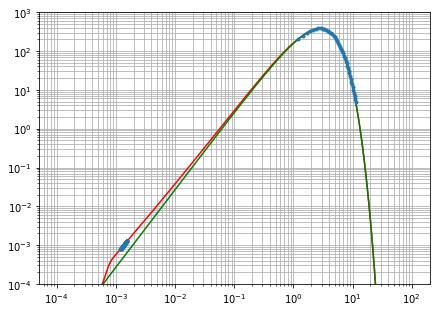

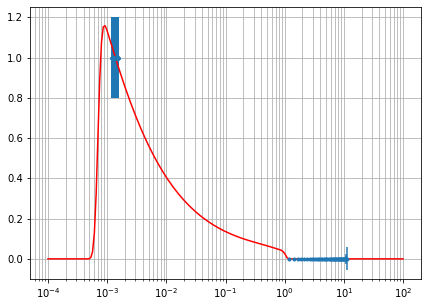

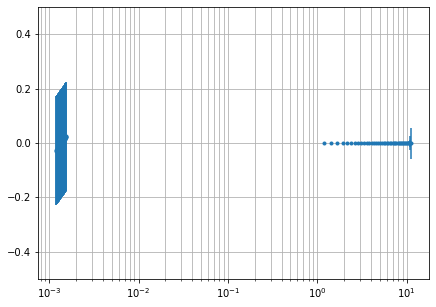

In [16]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20


gamma_asked = 10**(-18.791904)
xinj_asked = 10**(0.019243465)
f_dm = 10**(-4.9585675)

# for gamma between 1e-11 and 1e-12.5 we can use the formulas:

def xinj_of_gamma_edges(g):
    return (g/2e-14)**0.28

def fdm_of_gamma_edges(g):
    a = 1.11
    b = 29.23
    c = 182.4
    return 10**(a*np.log10(g)**2.+b*np.log10(g)+c)


#gamma_asked = 10**-12.3
#xinj_asked = xinj_of_gamma_edges(gamma_asked)
#f_dm = fdm_of_gamma_edges(gamma_asked)

print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)

plt.plot(x_model,pidist_model,c='r')
plt.plot(x_model,monopole,c='green')



sigma_fac = 1e0
plt.errorbar(x_data,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac



plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges_xxx.pdf')
#plt.close()

fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
for x in x_data:
    monopole_data.append(black_body(x))
monopole_data = np.asarray(monopole_data)



plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-monopole_data)/monopole_data,sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.1,1.25)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS_monopole_xxx.pdf')


fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
pidist_bf = []
for x in x_data:
    monopole_data.append(black_body(x))
    pidist_bf.append(f_pidist_model(x,xinj_asked,gamma_asked))
monopole_data = np.asarray(monopole_data)
pidist_bf = np.asarray(pidist_bf)
pidist_bf =pidist_bf[:,0]


#plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-pidist_bf) /(pidist_bf),sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.5,0.5)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS__full_xxx.pdf')

xinj=4.404e+00, GammaX=4.084e-12, fdm=3.468e-07


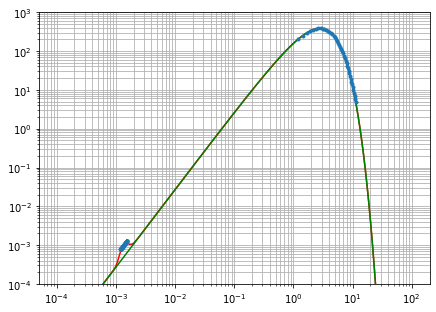

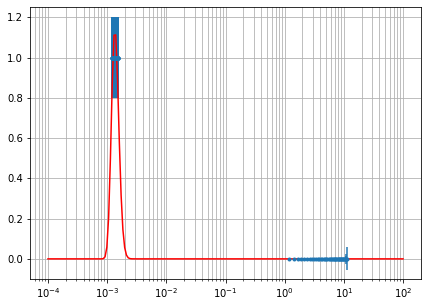

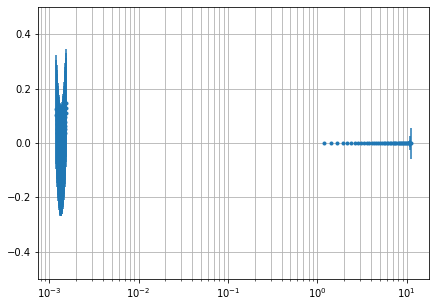

In [6]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20


gamma_asked = 10**(-11.38896)
xinj_asked = 10**(0.64386789)
f_dm = 10**(-6.4599239)

# for gamma between 1e-11 and 1e-12.5 we can use the formulas:

def xinj_of_gamma_edges(g):
    return (g/2e-14)**0.28

def fdm_of_gamma_edges(g):
    a = 1.11
    b = 29.23
    c = 182.4
    return 10**(a*np.log10(g)**2.+b*np.log10(g)+c)


#gamma_asked = 10**-12.3
#xinj_asked = xinj_of_gamma_edges(gamma_asked)
#f_dm = fdm_of_gamma_edges(gamma_asked)

print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)

plt.plot(x_model,pidist_model,c='r')
plt.plot(x_model,monopole,c='green')



sigma_fac = 1e0
plt.errorbar(x_data,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac



plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges_red.pdf')
#plt.close()

fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
for x in x_data:
    monopole_data.append(black_body(x))
monopole_data = np.asarray(monopole_data)



plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-monopole_data)/monopole_data,sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.1,1.25)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS_monopole_red.pdf')


fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
pidist_bf = []
for x in x_data:
    monopole_data.append(black_body(x))
    pidist_bf.append(f_pidist_model(x,xinj_asked,gamma_asked))
monopole_data = np.asarray(monopole_data)
pidist_bf = np.asarray(pidist_bf)
pidist_bf =pidist_bf[:,0]


#plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-pidist_bf) /(pidist_bf),sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.5,0.5)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS__full_red.pdf')

xinj=3.168e+00, GammaX=1.210e-12, fdm=5.976e-09


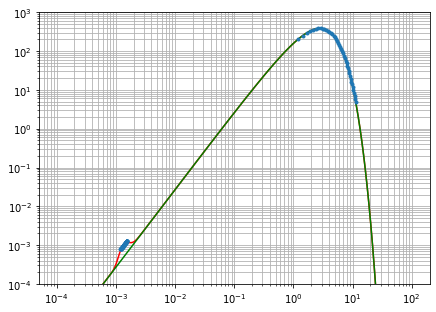

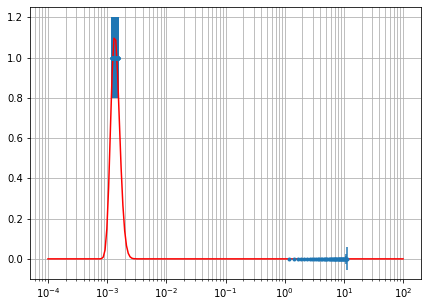

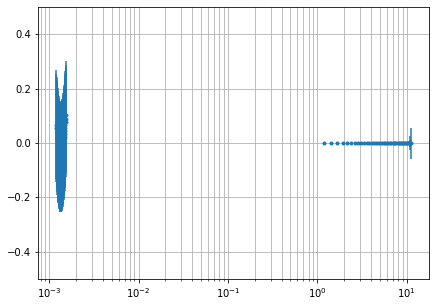

In [7]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20


gamma_asked = 10**(-11.917254)
xinj_asked = 10**(0.50072028)
f_dm = 10**(-8.2235598)

# for gamma between 1e-11 and 1e-12.5 we can use the formulas:

def xinj_of_gamma_edges(g):
    return (g/2e-14)**0.28

def fdm_of_gamma_edges(g):
    a = 1.11
    b = 29.23
    c = 182.4
    return 10**(a*np.log10(g)**2.+b*np.log10(g)+c)


#gamma_asked = 10**-12.3
#xinj_asked = xinj_of_gamma_edges(gamma_asked)
#f_dm = fdm_of_gamma_edges(gamma_asked)

print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)

plt.plot(x_model,pidist_model,c='r')
plt.plot(x_model,monopole,c='green')



sigma_fac = 1e0
plt.errorbar(x_data,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac



plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges_green.pdf')
#plt.close()

fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
for x in x_data:
    monopole_data.append(black_body(x))
monopole_data = np.asarray(monopole_data)



plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-monopole_data)/monopole_data,sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.1,1.25)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS_monopole_green.pdf')


fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
pidist_bf = []
for x in x_data:
    monopole_data.append(black_body(x))
    pidist_bf.append(f_pidist_model(x,xinj_asked,gamma_asked))
monopole_data = np.asarray(monopole_data)
pidist_bf = np.asarray(pidist_bf)
pidist_bf =pidist_bf[:,0]


#plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-pidist_bf) /(pidist_bf),sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.5,0.5)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS__full_green.pdf')

xinj=1.001e+00, GammaX=3.094e-14, fdm=9.602e-11


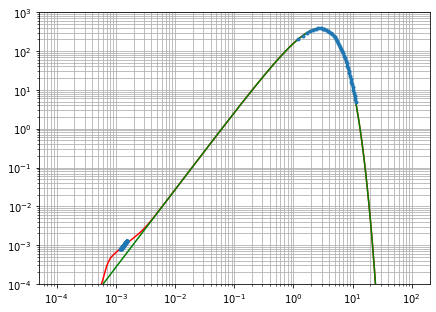

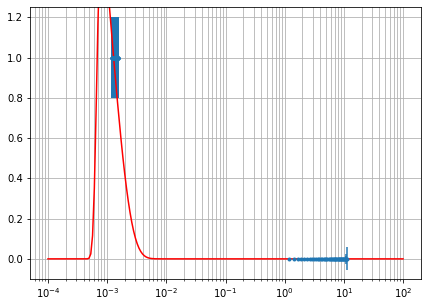

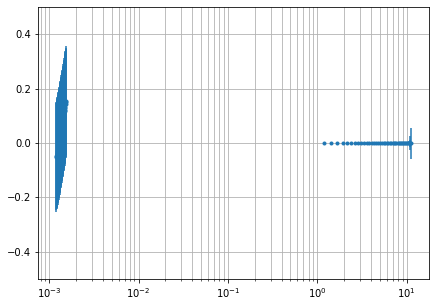

In [8]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20


gamma_asked = 10**(-13.509489)
xinj_asked = 10**(0.00061752247)
f_dm = 10**(-10.017654)

# for gamma between 1e-11 and 1e-12.5 we can use the formulas:

def xinj_of_gamma_edges(g):
    return (g/2e-14)**0.28

def fdm_of_gamma_edges(g):
    a = 1.11
    b = 29.23
    c = 182.4
    return 10**(a*np.log10(g)**2.+b*np.log10(g)+c)


#gamma_asked = 10**-12.3
#xinj_asked = xinj_of_gamma_edges(gamma_asked)
#f_dm = fdm_of_gamma_edges(gamma_asked)

print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)

plt.plot(x_model,pidist_model,c='r')
plt.plot(x_model,monopole,c='green')



sigma_fac = 1e0
plt.errorbar(x_data,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac



plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges_blue.pdf')
#plt.close()

fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
for x in x_data:
    monopole_data.append(black_body(x))
monopole_data = np.asarray(monopole_data)



plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-monopole_data)/monopole_data,sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.1,1.25)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS_monopole_blue.pdf')


fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
pidist_bf = []
for x in x_data:
    monopole_data.append(black_body(x))
    pidist_bf.append(f_pidist_model(x,xinj_asked,gamma_asked))
monopole_data = np.asarray(monopole_data)
pidist_bf = np.asarray(pidist_bf)
pidist_bf =pidist_bf[:,0]


#plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-pidist_bf) /(pidist_bf),sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.5,0.5)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS__full_blue.pdf')

xinj=3.454e+00, GammaX=1.596e-12, fdm=1.288e-08


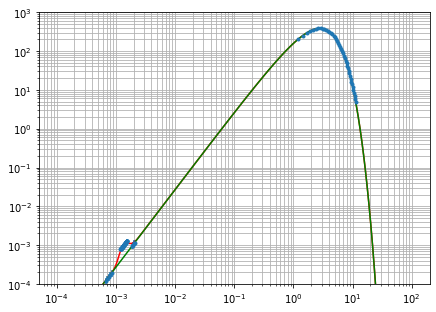

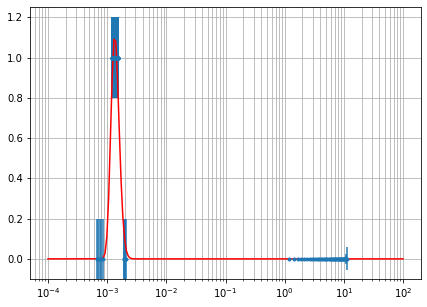

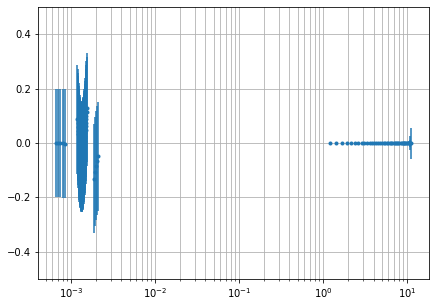

In [413]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20


gamma_asked = 10**(-1.1797001E+01)
xinj_asked = 10**(5.3836376E-01)
f_dm = 10**(-7.8900646E+00)

# for gamma between 1e-11 and 1e-12.5 we can use the formulas:

def xinj_of_gamma_edges(g):
    return (g/2e-14)**0.28

def fdm_of_gamma_edges(g):
    a = 1.11
    b = 29.23
    c = 182.4
    return 10**(a*np.log10(g)**2.+b*np.log10(g)+c)


#gamma_asked = 10**-12.3
#xinj_asked = xinj_of_gamma_edges(gamma_asked)
#f_dm = fdm_of_gamma_edges(gamma_asked)

print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)

plt.plot(x_model,pidist_model,c='r')
plt.plot(x_model,monopole,c='green')



sigma_fac = 1e0
plt.errorbar(x_data,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac



plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges.pdf')
#plt.close()

fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
for x in x_data:
    monopole_data.append(black_body(x))
monopole_data = np.asarray(monopole_data)



plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-monopole_data)/monopole_data,sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.1,1.25)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS_monopole.pdf')


fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
pidist_bf = []
for x in x_data:
    monopole_data.append(black_body(x))
    pidist_bf.append(f_pidist_model(x,xinj_asked,gamma_asked))
monopole_data = np.asarray(monopole_data)
pidist_bf = np.asarray(pidist_bf)
pidist_bf =pidist_bf[:,0]


#plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-pidist_bf) /(pidist_bf),sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.5,0.5)
plt.grid(which='both')

plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS_full.pdf')

In [421]:
#data that we want to fit
T_pivot = 2.725
firas = sd.firas()
# this sets everything with respect to the pivot temperature:
sd.GetFirasXTatTpivot(firas,T_pivot)
I_firas = firas.firas_I0
x_firas = firas.firas_x
nu_firas = firas.firas_nu
sigma_firas = firas.firas_sigma
covmat_firas = firas.firas_covmat
#print(x_firas,I_firas)


# copy to data vector
x_data = x_firas
nu_data = nu_firas
I_data = I_firas

I_firas = firas.firas_I0
x_firas = firas.firas_x
nu_firas = firas.firas_nu
sigma_firas = firas.firas_sigma
covmat_firas = firas.firas_covmat
#print(x_firas,I_firas)


# copy to data vector
x_data = x_firas
nu_data = nu_firas
I_data = I_firas

# Neglecting foreground, we put all the firas data on the monopole:
# create a monopole model:
monopole = []
for i in range(len(nu_data)):
    nu = nu_data[i]
    monopole.append(sd.B_nu_of_T(nu,T_pivot))
monopole = np.asarray(monopole)
I_model = monopole
I_firas = I_model
I_data = I_firas



sigma_data = sigma_firas
covmat_data = covmat_firas


# now add edges-like points
edges = sd.edges()
# central point
#I_edges = 2.*sd.B_nu_of_T(edges.edges_nu,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(edges.edges_nu,T_pivot)

#x_data = np.insert(x_data,0,edges.edges_x)
#nu_data  = np.insert(nu_data,0,edges.edges_nu)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(edges.edges_nu,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)




# lower point
# FWHM = 20MHz
#fwhm = 20e6
#nu_edges = edges.edges_nu - fwhm/2.
#I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
#x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#x_data = np.insert(x_data,0,x_edges)
#nu_data  = np.insert(nu_data,0,nu_edges)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)


# upper_point 
# FWHM = 20MHz
#fwhm = 20e6
#nu_edges = edges.edges_nu + fwhm/2.
#I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
#x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#x_data = np.insert(x_data,0,x_edges)
#nu_data  = np.insert(nu_data,0,nu_edges)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)

#sigma_data = np.sqrt(np.diag(covmat_data))


fwhm = 20e6









nu_edges_min = edges.edges_nu - fwhm/2.
nu_edges_max = edges.edges_nu + fwhm/2.

nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),len(x_firas))

for nu in nu_edges_like:
    nu_edges = nu
    I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
    sigma_edges = 0.2*sd.B_nu_of_T(nu_edges,T_pivot)
    x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

    x_data = np.insert(x_data,0,x_edges)
    nu_data  = np.insert(nu_data,0,nu_edges)
    I_data = np.insert(I_data,0,I_edges)
    I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

    cov_edges = [[(sigma_edges)**2.]]
    covmat_data = block_diag(cov_edges, covmat_data)

    sigma_data = np.sqrt(np.diag(covmat_data))



   

xinj=4.643e+04, GammaX=3.496e-17, fdm=1.000e-01


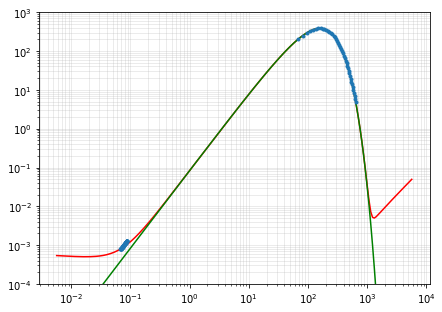

In [423]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20


gamma_asked = 3.496e-17#10**(-1.1797001E+01)
xinj_asked = 4.643e4#10**(5.3836376E-01)
f_dm = 1e-1#10**(-7.8900646E+00)

# for gamma between 1e-11 and 1e-12.5 we can use the formulas:

def xinj_of_gamma_edges(g):
    return (g/2e-14)**0.28

def fdm_of_gamma_edges(g):
    a = 1.11
    b = 29.23
    c = 182.4
    return 10**(a*np.log10(g)**2.+b*np.log10(g)+c)


#gamma_asked = 10**-12.3
#xinj_asked = xinj_of_gamma_edges(gamma_asked)
#f_dm = fdm_of_gamma_edges(gamma_asked)

print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)
nu = sd.kb*2.725/sd.hplanck*x_model
plt.plot(nu*1e-9,pidist_model,c='r')
plt.plot(nu*1e-9,monopole,c='green')



sigma_fac = 1e0
nu = sd.kb*2.725/sd.hplanck*x_data
plt.errorbar(nu*1e-9,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac



plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both',alpha=0.3)
plt.savefig(path_to_figures+'solution_to_edges_illustration.pdf')
#plt.close()



3.6074473523093427 -13.707119650661825 1.962819434138906e-14
3.6 0.2777777777777778 -13.7 1.9952623149688828e-14


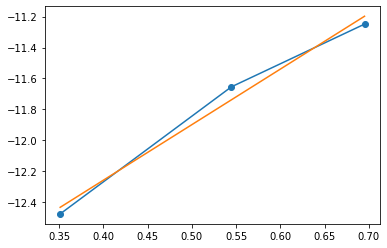

In [351]:
xinj_to_fit = np.array([0.35133726,0.54469816,0.69512819])
Gamma_inj_to_fit = np.array([-12.477857,-11.654921,-11.248542])
plt.plot(xinj_to_fit,Gamma_inj_to_fit,marker='o')
m,b = np.polyfit(xinj_to_fit, Gamma_inj_to_fit, 1)

print(m,b,10**b)
m =3.6
b = -13.7
print(m,1./m,b,10**b)
plt.plot(xinj_to_fit,m*xinj_to_fit+b)

In [374]:
10**0.55
ma  = xinj_to_mass*10**0.55
print(ma)
ma  = xinj_to_Einj*10**0.55
print(ma)

0.0016669133026193377
0.0008334566513096688


1.1103311377964462 29.226168419545417 182.40367633694547


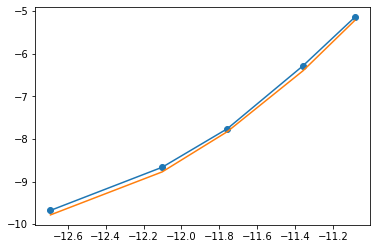

In [357]:
fdm_to_fit = np.array([-9.6751878,-8.6622366,-7.7598279,-6.2822795,-5.146211])
gamma_to_fit = np.array([-12.691681,-12.101455,-11.757952,-11.358099,-11.085093])
a,b,c = np.polyfit(gamma_to_fit, fdm_to_fit, 2)
print(a,b,c)
plt.plot(gamma_to_fit,fdm_to_fit,marker='o')
a = 1.11
b = 29.23
c = 182.4
plt.plot(gamma_to_fit,a*gamma_to_fit**2+b*gamma_to_fit+c)


In [257]:
class self:
    cvg = 0
    add_edges_data = 'yes'

firas = sd.firas()
sd.GetFirasXTatTpivot(firas,T_pivot)
self.I0 = firas.firas_I0
self.sigma = firas.firas_sigma
self.x = firas.firas_x


# diagonal version
self.cvg = np.asarray(self.sigma)**2.
self.cvg = np.diag(self.cvg)
self.covmat =  self.cvg

# non-diagonal version
self.covmat = firas.firas_covmat


if (self.add_edges_data ==  'yes'):
    print("[initialize] Using edges-like data")
    use_edges = 'yes'
    # copy to data vector
    x_data = self.x
    nu_firas = firas.firas_nu
    nu_data = nu_firas
    I_data = self.I0


    edges = sd.edges()

    fwhm = 20e6

    # add a couple of data points at high frequency with no distrortion
    nu_edges_min = edges.edges_nu + fwhm/2.
    nu_edges_max = edges.edges_nu + fwhm/2. + 10e6
    N_edges_like =  5
    nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),N_edges_like)
    for nu in nu_edges_like:
        nu_edges = nu
        I_edges = sd.B_nu_of_T(nu_edges,T_pivot)
        sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
        x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

        self.x = np.insert(self.x,0,x_edges)
        #nu_data  = np.insert(nu_data,0,nu_edges)
        self.I0 = np.insert(self.I0,0,I_edges)
        #I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

        cov_edges = [[(sigma_edges)**2.]]
        self.covmat = block_diag(cov_edges, self.covmat)

        self.sigma = np.sqrt(np.diag(self.covmat))


    # now add edges-like point
    nu_edges_min = edges.edges_nu - fwhm/2.
    nu_edges_max = edges.edges_nu + fwhm/2.
    N_edges_like =  10
    nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),N_edges_like)
    for nu in nu_edges_like:
        nu_edges = nu
        I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
        sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
        x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

        self.x = np.insert(self.x,0,x_edges)
        #nu_data  = np.insert(nu_data,0,nu_edges)
        self.I0 = np.insert(self.I0,0,I_edges)
        #I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

        cov_edges = [[(sigma_edges)**2.]]
        self.covmat = block_diag(cov_edges, self.covmat)

        self.sigma = np.sqrt(np.diag(self.covmat))

    # add a couple of data points at low frequency with no distrortion
    nu_edges_min = edges.edges_nu - fwhm/2. - 10e6
    nu_edges_max = edges.edges_nu - fwhm/2.
    N_edges_like =  5
    nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),N_edges_like)
    for nu in nu_edges_like:
        nu_edges = nu
        I_edges = sd.B_nu_of_T(nu_edges,T_pivot)
        sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
        x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

        self.x = np.insert(self.x,0,x_edges)
        #nu_data  = np.insert(nu_data,0,nu_edges)
        self.I0 = np.insert(self.I0,0,I_edges)
        #I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

        cov_edges = [[(sigma_edges)**2.]]
        self.covmat = block_diag(cov_edges, self.covmat)

        self.sigma = np.sqrt(np.diag(self.covmat))





    #
    # I_edges = 2.*sd.B_nu_of_T(edges.edges_nu,T_pivot)
    # sigma_edges = 0.5*sd.B_nu_of_T(edges.edges_nu,T_pivot)
    # x_data = np.insert(x_data,0,edges.edges_x)
    # nu_data  = np.insert(nu_data,0,edges.edges_nu)
    # self.I0 = np.insert(I_data,0,I_edges)
    # #I_model = np.insert(I_model,0,sd.B_nu_of_T(edges.edges_nu,T_pivot))
    # cov_edges = [[(sigma_edges)**2.]]
    # self.covmat = block_diag(cov_edges, self.covmat)
    # self.x = x_data
    # self.sigma = np.sqrt(np.diag(self.covmat))

# compute inverse an determinant
self.inv_covmat = np.linalg.inv(self.covmat)
self.det_covmat = np.linalg.det(self.covmat)



#print(self.det_covmat)
print('[reading specdist data files] read-in completed.')


[initialize] Using edges-like data
[reading specdist data files] read-in completed.


[]

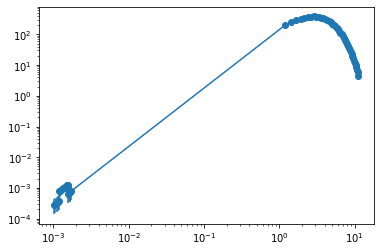

In [263]:
plt.errorbar(self.x,self.I0,yerr=self.sigma,marker='o')
plt.loglog()

In [341]:
edges = sd.edges()
edges.edges_nu

78000000.0

(10000000.0, 1000000000000.0)

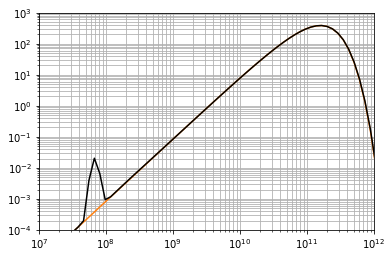

In [430]:
nu_array = np.logspace(5,13,100)
T = 2.725
B_nu = np.vectorize(sd.B_nu_of_T)

bedges=B_nu(edges.edges_nu,T)

plt.plot(edges.edges_nu,2.*bedges*1e-6,marker='o')
gamma_asked = 1e-11
#nu_asked = 5e9
#xinj_asked =4257.1306
xinj_asked =4.5
#xinj_asked = sd.hplanck*nu_asked/sd.kb/T

x_asked = sd.hplanck*nu_array/sd.kb/T
sd_lib = sd_lib_extended_run

S = sd.GetSpectra(gamma_asked,xinj_asked,x_asked,sd_lib)
pispec_DI = S['DI']*1e-6
pispec_nu = sd.kb*T*S['x']/sd.hplanck

bnu = B_nu(pispec_nu,T)
plt.plot(pispec_nu,bnu)
plt.plot(pispec_nu,pispec_DI*100.+bnu,c='k')
plt.loglog()
plt.grid(which='both')
plt.ylim(1e-4,1e3)
plt.xlim(1e7,1e12)

In [348]:
#data that we want to fit
T_pivot = 2.725
firas = sd.firas()
# this sets everything with respect to the pivot temperature:
sd.GetFirasXTatTpivot(firas,T_pivot)


In [462]:
I_firas = firas.firas_I0
x_firas = firas.firas_x
nu_firas = firas.firas_nu
sigma_firas = firas.firas_sigma
covmat_firas = firas.firas_covmat
#print(x_firas,I_firas)


# copy to data vector
x_data = x_firas
nu_data = nu_firas
I_data = I_firas

# Neglecting foreground, we put all the firas data on the monopole:
# create a monopole model:
monopole = []
for i in range(len(nu_data)):
    nu = nu_data[i]
    monopole.append(sd.B_nu_of_T(nu,T_pivot))
monopole = np.asarray(monopole)
I_model = monopole
I_firas = I_model
I_data = I_firas



sigma_data = sigma_firas
covmat_data = covmat_firas


# now add edges-like points
edges = sd.edges()
# central point
#I_edges = 2.*sd.B_nu_of_T(edges.edges_nu,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(edges.edges_nu,T_pivot)

#x_data = np.insert(x_data,0,edges.edges_x)
#nu_data  = np.insert(nu_data,0,edges.edges_nu)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(edges.edges_nu,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)




# lower point
# FWHM = 20MHz
#fwhm = 20e6
#nu_edges = edges.edges_nu - fwhm/2.
#I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
#x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#x_data = np.insert(x_data,0,x_edges)
#nu_data  = np.insert(nu_data,0,nu_edges)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)


# upper_point 
# FWHM = 20MHz
#fwhm = 20e6
#nu_edges = edges.edges_nu + fwhm/2.
#I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
#sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
#x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

#x_data = np.insert(x_data,0,x_edges)
#nu_data  = np.insert(nu_data,0,nu_edges)
#I_data = np.insert(I_data,0,I_edges)
#I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

#cov_edges = [[(sigma_edges)**2.]]
#covmat_data = block_diag(cov_edges, covmat_data)

#sigma_data = np.sqrt(np.diag(covmat_data))


fwhm = 20e6
nu_edges_min = edges.edges_nu - fwhm/2.
nu_edges_max = edges.edges_nu + fwhm/2.

nu_edges_like =  np.logspace(np.log10(nu_edges_min),np.log10(nu_edges_max),len(x_firas))

for nu in nu_edges_like:
    nu_edges = nu
    I_edges = 2.*sd.B_nu_of_T(nu_edges,T_pivot)
    sigma_edges = 0.5*sd.B_nu_of_T(nu_edges,T_pivot)
    x_edges = sd.hplanck*nu_edges/sd.kb/T_pivot

    x_data = np.insert(x_data,0,x_edges)
    nu_data  = np.insert(nu_data,0,nu_edges)
    I_data = np.insert(I_data,0,I_edges)
    I_model = np.insert(I_model,0,sd.B_nu_of_T(nu_edges,T_pivot))

    cov_edges = [[(sigma_edges)**2.]]
    covmat_data = block_diag(cov_edges, covmat_data)

    sigma_data = np.sqrt(np.diag(covmat_data))


    


In [483]:
# now define a pidist model, wich includes a monopole and a pidist
# chose a dm fraction:


In [484]:
#sd.GetSpectra(1e-17,1e-100,[x],sd_lib_extended_run)

xinj=1.014e+00, GammaX=8.568e-21, fdm=2.013e-04


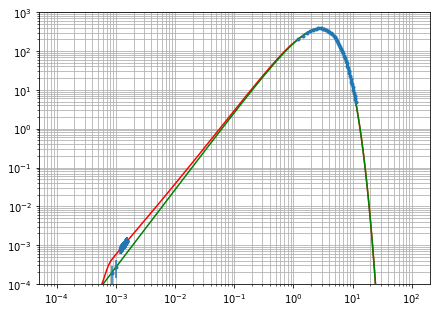

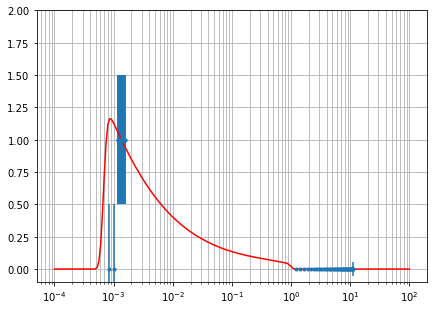

In [290]:
fig,ax = plt.subplots(1,1,figsize=(7,5))

#plt.plot(x_data,I_model,c='g',marker='o',markersize=2.,ls='None')

# test a particular pi_dist model
gamma_ref = 1e-20
gamma_asked = 10**(-2.0067132E+01)
xinj_asked = 10**(6.2419768E-03)
f_dm = 10**(-3.6961469E+00)
print('xinj=%.3e, GammaX=%.3e, fdm=%.3e'%(xinj_asked,gamma_asked,f_dm))



omega_cdm = 0.12
def f_pidist_model(x,x_inj,gamma_inj):
    # convert x to nu
    nu = sd.kb*T_pivot*x/sd.hplanck
    # monopole
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    # load spectrum from library
    if gamma_inj<gamma_ref:
        pidist = sd.GetSpectra(gamma_ref,x_inj,[x],sd_lib_extended_run)
        finj_ref= pidist['finj']
    else:
        pidist = sd.GetSpectra(gamma_inj,x_inj,[x],sd_lib_extended_run)
    
    pidist_at_x = pidist['DI']
    # convert to MJy
    pidist_at_x *= 1e-6
    # rescale according to fdm:
    if gamma_inj<gamma_ref:
        finj = finj_ref*gamma_ref/gamma_inj
    else:
        finj = pidist['finj']
    fdm_ct = 1./1.3098e4*finj*x_inj*(omega_cdm/0.12)**-1
    pidist_at_x *= f_dm/fdm_ct
    return monopole_at_x + pidist_at_x

def black_body(x):
    nu = sd.kb*T_pivot*x/sd.hplanck
    monopole_at_x = sd.B_nu_of_T(nu,T_pivot)
    return monopole_at_x 


pidist_model = []
monopole=[]
x_model = np.logspace(-4,2,200)
for x in x_model:
    y = f_pidist_model(x,xinj_asked,gamma_asked)
    pidist_model.append(y)
    monopole.append(black_body(x))
monopole=np.asarray(monopole)
pidist_model = np.asarray(pidist_model)

plt.plot(x_model,pidist_model,c='r')
plt.plot(x_model,monopole,c='green')


#nu_array = np.logspace(5,13,100)
#x_asked = sd.hplanck*nu_array/sd.kb/T_pivot
#S = sd.GetSpectra(gamma_asked,xinj_asked,x_asked,sd_lib_extended_run)

#pispec_DI = S['DI']*1e-6
#pispec_x = S['x']
#pispec_nu = sd.kb*T_pivot*pispec_x/sd.hplanck
#bnu = []
#for x in pispec_x:
#    nu = sd.kb*T_pivot*x/sd.hplanck
#    bnu.append(sd.B_nu_of_T(nu,T_pivot))

#bnu = B_nu(pispec_nu,T)
#plt.plot(pispec_x,pispec_DI*10.+bnu,c='k')

sigma_fac = 1e0
plt.errorbar(x_data,I_data,sigma_fac*sigma_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac


# just to check against previous implementation
#nu_array = np.logspace(5,13,100)
#T = 2.725
#B_nu = np.vectorize(sd.B_nu_of_T)

#bedges=B_nu(edges.edges_nu,T)

##plt.plot(edges.edges_nu,2.*bedges*1e-6,marker='o')
#gamma_asked = 1e-11
##nu_asked = 5e9
##xinj_asked =4257.1306
#xinj_asked =4.5
##xinj_asked = sd.hplanck*nu_asked/sd.kb/T

#x_asked = sd.hplanck*nu_array/sd.kb/T
#sd_lib = sd_lib_extended_run

#S = sd.GetSpectra(gamma_asked,xinj_asked,x_asked,sd_lib)
#pispec_DI = S['DI']*1e-6
#pispec_nu = sd.kb*T*S['x']/sd.hplanck
#pispec_x = S['x']
#bnu = B_nu(pispec_nu,T)
#plt.plot(pispec_x,bnu,c='orange',ls='--')
#plt.plot(pispec_x,pispec_DI*10.+bnu,c='magenta',ls='--')


plt.ylim(1e-4,1e3)
#plt.xlim(1e-4,1e-2)
plt.loglog()
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges.pdf')
#plt.close()

fig,ax = plt.subplots(1,1,figsize=(7,5))


monopole_data = []
for x in x_data:
    monopole_data.append(black_body(x))
monopole_data = np.asarray(monopole_data)



plt.plot(x_model,(pidist_model[:,0]-monopole)/monopole,c='r')

plt.errorbar(x_data,(I_data-monopole_data)/monopole_data,sigma_fac*sigma_data/monopole_data,marker='o',markersize=3,
             markefacecolor=None,ls='None') #error bars x sigma_fac
plt.xscale('log')
plt.yscale('linear')
plt.ylim(-0.1,2)
plt.grid(which='both')
plt.savefig(path_to_figures+'solution_to_edges_RESIDUALS.pdf')

In [575]:
'%.3e'%(1e2*sd.kb*2.725/sd.hplanck)

'5.678e+12'

# Long lived normalisation

(1e-06, 1000000000.0)

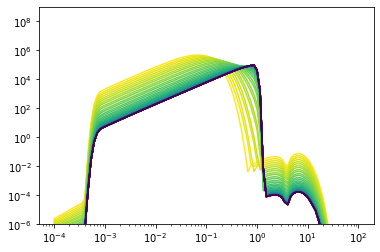

In [521]:
xinj_asked = 1e0
ngamma = 50
color=iter(cm.viridis(np.linspace(1,0,ngamma)))
Gamma_injs = np.logspace(-16,-20,ngamma)
x_asked = np.logspace(-4,2,100)
gamma_ref = 1e-20
finj_ref = sd.GetSpectra(gamma_ref,xinj_asked,x_asked,sd_lib)['finj']
finj_gamma = []
for g in Gamma_injs:
    col = next(color)
    x = x_asked
    y = sd.GetSpectra(g,xinj_asked,x_asked,sd_lib)['DI']
    finj = sd.GetSpectra(g,xinj_asked,x_asked,sd_lib)['finj']
    #print(finj*g,finj_ref*gamma_ref)
    finj_gamma.append(finj*g)
    #print(len(y))
    plt.plot(x,abs(y),c=col)
plt.loglog()
plt.ylim(1e-6,1e9)

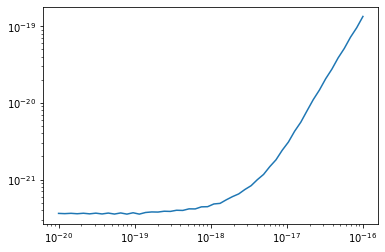

In [524]:
plt.plot(Gamma_injs,finj_gamma)
plt.xscale('log')
plt.yscale('log')

In [528]:
sd.GetSpectra(1.e-20,xinj_asked,x_asked,sd_lib)['DI']

array([ 3.04943802e-07,  3.01374767e-07,  2.98709996e-07,  2.96832592e-07,
        2.96200000e-07,  2.97200000e-07,  2.99733333e-07,  3.04588780e-07,
        3.11858034e-07,  3.23709885e-07,  3.98371655e-07,  1.71768432e-04,
        2.44785209e-02,  4.37457419e-01,  1.87167229e+00,  3.43221405e+00,
        4.57896271e+00,  5.75848422e+00,  7.20091079e+00,  8.98760387e+00,
        1.12115595e+01,  1.39526761e+01,  1.73530942e+01,  2.15643932e+01,
        2.67652994e+01,  3.32058536e+01,  4.11508398e+01,  5.09753574e+01,
        6.30972545e+01,  7.80846861e+01,  9.65673993e+01,  1.19372338e+02,
        1.47525001e+02,  1.82286693e+02,  2.25203287e+02,  2.77929627e+02,
        3.43135799e+02,  4.23760267e+02,  5.22806244e+02,  6.45052712e+02,
        7.95945475e+02,  9.82037497e+02,  1.21145389e+03,  1.49440721e+03,
        1.84317318e+03,  2.27286886e+03,  2.80266603e+03,  3.45595320e+03,
        4.26021654e+03,  5.25176648e+03,  6.47937371e+03,  7.97846723e+03,
        9.82096043e+03,  

# new library at high frequency for stimulated decay

In [2]:
sd_lib_extended_run_high_xinj = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_high_xinj_160920b',sd_lib_extended_run_high_xinj)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_stim_070920',sd_lib_extended_run_stim)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [3]:
sd_lib_extended_run = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_stim_070920',sd_lib_extended_run)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [34]:
def pi_compute_fdm_constraints_stim(log10_tau_a,log10_Einj_in_ev,asd_lib,*args,**kwargs):
    asd_lib_high_xinj0 = kwargs.get('asd_lib_high_xinj0',None)
    Einj_in_ev = 10**log10_Einj_in_ev
    tau_a = 10**log10_tau_a
    #ma_in_ev = log10_ma_in_ev
    #tau_a = log10_tau_a
    xinj = Einj_in_ev/xinj_to_Einj
    #gagg = 3.57e7*(Gamma_values)**0.5*Xinj_values**(-3./2.)
    Gamma = 1./tau_a#((gagg/3.57e7)/xinj**(-3./2.))**2.
    lib_for_constraints = asd_lib
    if asd_lib_high_xinj0:
        #if xinj>1e4 and Gamma<1e-14:
        if xinj>(80./xinj_to_Einj):
            lib_for_constraints = asd_lib_high_xinj0
              
    mode ='' #fisher, QS or mu
    gamma_mu = 1e-8
    if (xinj >= 10. and Gamma < 2e-20): 
        mode = 'QS'
        Gamma_QS = 2e-20
    elif (xinj < 10. and Gamma < 2e-21*xinj):
        mode = 'QS'
        Gamma_QS = 2e-21*xinj
    elif (xinj >= (gamma_mu/1e-15) and Gamma > gamma_mu):
        mode = 'mu'
    elif (xinj < (gamma_mu/1e-15) and Gamma > 1e-15*xinj):
        mode = 'mu'
    else:
        mode = 'fisher'
        #mode = 'fisher'
    
    
    
    
    # for short lifetime, we compute the constraint
    # analytically using the mu-distortion
    if mode  == 'mu':
        ct = sd.cosmotherm()
        ct.ct_T0 = 2.7255
        ct.ct_Yp = 0.245407
        ct.ct_N_eff = 3.046
        ct.ct_Omega_m = 0.312331
        ct.ct_Omega_b = 0.0491137
        ct.ct_h = 0.675422
        
        
        cosmo = sd.cosmo()
        X_dm = sd.dm_particle()
        pi.set_dm_params_to_CT_pi_params(X_dm,ct)
        pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
        
        X_dm.Gamma_inj = Gamma
        X_dm.x_0 = xinj
        #fdm_constraint = np.abs(pi.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,N_int = 5))
        fdm_constraint = np.abs(sd.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,**kwargs))
        #fdm_constraint = 0.0001
    # for long lifetime, we compute the constraint
    # by extrapolating
    elif mode == 'QS':
        #fdm_constraint = 1e50
        xi_a = [xinj]
        Gamma_values = [Gamma_QS]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']*Gamma_QS/Gamma
    # for intermerdiate cases we compute the constraints using fisher matrix
    else:
        #fdm_constraint = 1e100
        xi_a = [xinj]
        Gamma_values = [Gamma]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']
        
    return np.log10(fdm_constraint)

pi_compute_fdm_constraints_stim = np.vectorize(pi_compute_fdm_constraints_stim)






In [37]:
firas = sd.firas()
edges = sd.edges()

add_edges = 'yes'

tau_values = np.linspace(5,35,200)
#tau_values = np.linspace(5,15,30)
Einj_values =np.linspace(-10,5,200)
xlist = Einj_values
ylist = tau_values

X, Y = np.meshgrid(xlist, ylist)

a_dict = {}
a_dict['firas'] = firas
a_dict['edges'] = edges
a_dict['stim'] = 'yes'
a_dict['N_int'] = 10

if add_edges == 'yes':
    a_dict['add_edges'] = 'yes'
else:
    a_dict['add_edges'] = 'no'

#lib = sd_lib_lyc_reio

lib = sd_lib_extended_run
a_dict['asd_lib_high_xinj0'] = sd_lib_extended_run_high_xinj


#Z = vfunc_tau_a_contours(Y,X,lib,**a_dict)
Z =  pi_compute_fdm_constraints_stim(Y,X,lib,**a_dict)

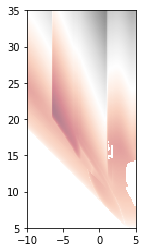

In [38]:
plt.imshow(Z, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap='RdGy', alpha=0.5)

In [39]:
# save the results

case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
     name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_stim_070920'
#name_ext += '_test'
np.shape(Z)
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'

    
np.savetxt(path, Z, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'


np.savetxt(path, X, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'


np.savetxt(path, Y, delimiter='\t', fmt='%.4e')



In [50]:
# load the non-thermal distorsion

NT = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/E_gamma_nt.dat')
z_nt = NT[:,1]
E_nt = NT[:,0]

# f_nt = interp1d(z_nt,E_nt)


ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422
pi.set_dm_params_to_CT_pi_params(X_dm,ct)
pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)

G_nt = []
for zx in z_nt:
    G_nt.append(pi.find_Gamma_inj_for_injection_redshift_zX(zx,cosmo,ct))
G_nt = np.asarray(G_nt)

In [131]:
# load the results
case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_stim_070920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

import math
for i in range(200):
    Zf[:,i] = [-6 if math.isnan(x) else x for x in Zf[:,i]]

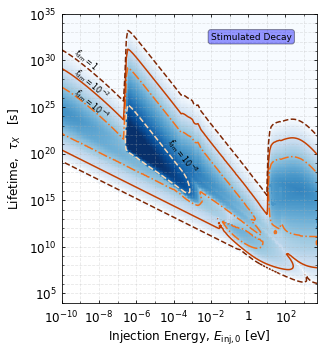

In [84]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [-8,-4,-2,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-','--'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')


#ax.set_xlim(Einj_values[0],Einj_values[-1])
ax.set_xlim(Einj_values[0],np.log10(5e3))
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(4,35)

ax.set_xlabel(label_injection_energy,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.15,0.5)
ax.xaxis.set_label_coords(0.5,-.09)




# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[-10,5,tau_values[0],tau_values[-1]], origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(-9.5, 31.5, r'$f_\mathrm{dm}=1$' , rotation = -40,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 29.5, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -40,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 27.3, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -40,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(-4.5, 22, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -52,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='r')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])

        
ax.text(-2, 33, 'Stimulated Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='blue', alpha=0.4))

ax.set_yticklabels([r'$10^{5}$',r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$',r'$10^{35}$'])



fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_tau_a_finally_stim' + name_ext)

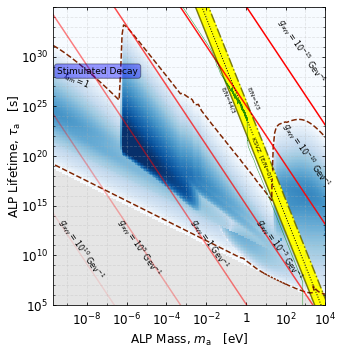

In [132]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

mass_values = np.log10(10**Einj_values/mass_to_Einj)

Mf = np.log10(10**Xf/mass_to_Einj)
# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Mf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-',':'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

masses_ev = np.logspace(-12,9,100)


xinjs = masses_ev/xinj_to_mass

gagg = 1e-15
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r', alpha=1)





gagg = 1e-10
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha = 0.9)


gagg = 1e-5
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.7)

gagg = 1e0
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.5)

gagg = 1e5
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.3)

gagg = 1e10
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.1)





ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')


name_ext = ''

if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '.pdf'




ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[mass_values[0],mass_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(0.03, 0.79, r'$f_\mathrm{dm}=1$' , rotation = -23,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))




ax.text(0.225, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{5}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.005, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{10}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



# ax.text(0.3, 0.63, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
#         transform=ax.transAxes, fontsize=8, 
#           verticalalignment='top',
#           bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.patch.set_color('grey') # or whatever color you like
ax.patch.set_alpha(.2)


mass_in_eV = np.logspace(-9,9,100)

E_over_N_minus_bla = 5./3. - 1.949
#E_over_N_minus_bla = 0.07#2. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_low = np.asarray(tau)
#ax.plot(mass_in_eV ,tau*1e-12,ls = '-')


E_over_N_minus_bla = 44./3. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_high = np.asarray(tau)

ax.plot(np.log10(mass_in_eV),np.log10(tau_high),ls='-',c='k',alpha=0.5)
ax.plot(np.log10(mass_in_eV),np.log10(tau_low),ls='-.',c='k',alpha=0.5)
ax.fill_between(np.log10(mass_in_eV),np.log10(tau_high),np.log10(tau_low),color='yellow',alpha=1.)
# ticks=np.arange(-10,6)
# plt.xticks(ticks)
# ticks=np.arange(5,30)
# plt.yticks(ticks)

# fig.tight_layout()


tau_ksvz = 8.9078e23*masses_ev**-5
ax.plot(np.log10(masses_ev),np.log10(tau_ksvz),c='k',lw=1,ls=':')
ax.text(0.27, 22, r'KSVZ  [E/N=0]' , rotation = -67,
          fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=1.))


ax.text(0, 27, r'E/N=5/3' , rotation = -67,
          fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-1.3, 27, r'E/N=44/3' , rotation = -67,
          fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))



# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev),np.log10(tau_dfsz),c='k',lw=1,ls=':')
# ax.text(0.625, 0.96, r'DFSZ' , rotation = -65,
#         transform=ax.transAxes, fontsize=8, 
#           verticalalignment='top',
#           bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

CAST = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/cast_env_2016.dat')
m_cast = CAST[:,0]
gagg_cast = CAST[:,1]

xinjs_cast = 1./xinj_to_mass*m_cast
gammas_casts = xinjs_cast**3.*1./(3.57e7)**2.*gagg_cast**2.


ax.plot(np.log10(m_cast),np.log10(1./gammas_casts),c='green',lw=0.5,alpha=0.8)
#ax.fill_between(CAST[:,0],CAST[:,1],1.e50,color='lightblue')


#ax.text(0.9, 0.23, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0))



m_nt = 1./mass_to_Einj*E_nt*1e3
ax.plot(np.log10(m_nt),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(m_nt),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)

# ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls='--')
# ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
# ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='r')

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-8}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])



ax.text(0.81, 0.97, r'$g_\mathrm{a\gamma\gamma}=10^{-15}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.text(0.83, 0.62, r'$g_\mathrm{a\gamma\gamma}=10^{-10}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(0.735, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{-5}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))




ax.text(0.49, 0.30, r'$g_\mathrm{a\gamma\gamma}=1\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



#ax.set_xlabel(label_mdm,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
#ax.set_ylabel(label_Tau_x,size=title_size)

ax.set_ylabel("ALP Lifetime, "+r'$\tau_\mathrm{a}\quad[\mathrm{s}]$',size=title_size)


ax.set_xlabel("ALP Mass, "+r'$m_\mathrm{a}\quad[\mathrm{eV}]$',size=title_size)

#ax.text(-9.5, 29., 'Standard Decay', fontsize=9, verticalalignment='top',
#      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))

ax.text(-9.5, 29., 'Stimulated Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='blue', alpha=0.4))

ax.set_xlim(mass_values[0],4)
ax.set_ylim(tau_values[0],tau_values[-1])

fig.tight_layout()
#plt.legend()
plt.savefig(path_to_figures + '/figures_for_paper_finally_alp_tau_a' + name_ext)

In [207]:
def g_agg(gamma,xinj):
    gagg = 3.57e7*gamma**0.5*xinj**(-3./2.)
    return gagg

g_agg = np.vectorize(g_agg)

def gammaX(gagg,xinj):
    gamma = (gagg/(3.57e7*xinj**(-3./2.)))**2.
    return gamma
gammaX = np.vectorize(gammaX)

In [231]:
# load the results
case = 'lyc+reio'
add_edges = 'yes'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_stim_070920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

import math
for i in range(200):
    Zf[:,i] = [-5 if math.isnan(x) else x for x in Zf[:,i]]

tau_values = Yf[:,0]
Einj_values = Xf[0]


xinj_values = 10**Einj_values/xinj_to_Einj

mX_values = np.log10(xinj_to_mass*xinj_values)
gamma_values = np.log10(1./10**tau_values)
gagg_values = np.log10(g_agg(10**gamma_values,xinj_values))

# create an interpolating function fdm(m_X, Gamma_X):
import scipy 
f_at_einj_and_tauinj = scipy.interpolate.interp2d(Einj_values, tau_values, Zf,
                                                kind='linear',bounds_error=False,fill_value=np.nan)

In [232]:
len(gagg_values)

200

In [233]:
Xf_gagg = np.zeros((200, 200))
Yf_gagg = np.zeros((200, 200))
Zf_gagg = np.zeros((200, 200))

In [234]:
for i in range(200):
    for j in range(200):
        einj = 10**Xf[i][j]
        tau_X = 10**Yf[i][j]
        #fdm  = Zf[i][j]

        xinj = einj/xinj_to_Einj
        Xf_gagg[i][j]=np.log10(xinj_to_mass*xinj)
        gamma = 1./tau_X
        Yf_gagg[i][j]=np.log10(g_agg(gamma,xinj))
        #Zf_gagg[i][j] = fdm
    
    
    
    

In [235]:
# find minimum value of log10 gagg
mymin = min([min(r) for r in Yf_gagg])
print(mymin)
# find maximum value of log10 gagg
mymax = max([max(r) for r in Yf_gagg])
print(mymax)
# All the g_agg values in the range
# have been computed before:
print(gagg_values[0],gagg_values[199], len(gagg_values))
# Xf_gagg contains the masses:
# Xf_gagg = [[m_min,...,m_max],
#              :::::::::::::: ,
#            [m_min,...,m_max],]
# Yf_gagg_new has to contain the g_agg values as follows (in column):
Yf_gagg_new  = np.zeros((200,200))
for i in range(200):
    Yf_gagg_new[:,i] = gagg_values[::-1]

# then we loop over gagg and mX values and compute fdm:
for i in range(200):
    for j in range(200):
        log10mX = Xf_gagg[i][j]
        log10gagg = Yf_gagg_new[i][j]
        # compute lifetime  corresponding to mX and gagg:
        xinj = 10**log10mX/xinj_to_mass
        einj = xinj_to_Einj*xinj
        gamma  = gammaX(10**log10gagg,xinj)
        tauinj = 1./gamma
        fdm = f_at_einj_and_tauinj(np.log10(einj),np.log10(tauinj))
        Zf_gagg[i][j] = fdm


-22.891007258721398
14.608992741278602
14.608992741278602 -22.891007258721398 200


In [236]:
Yf_gagg_new

array([[-22.89100726, -22.89100726, -22.89100726, ..., -22.89100726,
        -22.89100726, -22.89100726],
       [-22.70240726, -22.70240726, -22.70240726, ..., -22.70240726,
        -22.70240726, -22.70240726],
       [-22.51380726, -22.51380726, -22.51380726, ..., -22.51380726,
        -22.51380726, -22.51380726],
       ...,
       [ 14.23204274,  14.23204274,  14.23204274, ...,  14.23204274,
         14.23204274,  14.23204274],
       [ 14.42049274,  14.42049274,  14.42049274, ...,  14.42049274,
         14.42049274,  14.42049274],
       [ 14.60899274,  14.60899274,  14.60899274, ...,  14.60899274,
         14.60899274,  14.60899274]])

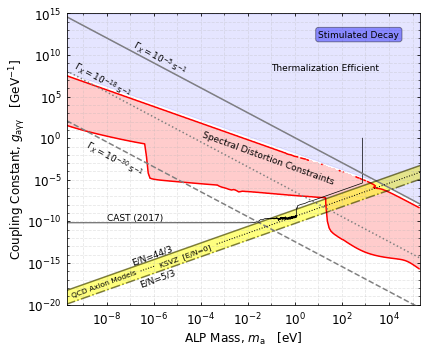

In [238]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5




# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

#levels = [-8,-4,-2,0]
levels = [-100,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf_gagg, Yf_gagg_new, Zf_gagg,
                levels,norm=normalize,linestyles=['-','-'],colors=['r','r'])
CS = ax.contourf(Xf_gagg, Yf_gagg_new, Zf_gagg,
                levels,extend='min',colors=['w','r'],alpha=0.2)

# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')





ax.set_xlabel("ALP Mass, "+r'$m_\mathrm{a}\quad[\mathrm{eV}]$',size=title_size)
ax.set_ylabel("Coupling Constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
#ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)




ax.set_xlim(mX_values[0],mX_values[-1])
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(gagg_values[::-1][0],gagg_values[::-1][-1])

#im = ax.imshow(Zf_gagg, 
#               extent=[mX_values[0],mX_values[-1],gagg_values[::-1][0],
#                           gagg_values[::-1][-1]],
#               origin='lower',
#           cmap=colormap2,norm=normalize, 
#               alpha=1.,aspect=0.5
#              )


#ax.text(-9.5, 24.8, r'$f_\mathrm{dm}=1$' , rotation = -23,
#          fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(-9.5, 22.8, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -23,
#         fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(-9.5, 20.8, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -23,
#         fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



#ax.text(-5.5, 21, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
#        fontsize=8, 
#          verticalalignment='top',color='k',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


#ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
#ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
#ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='None')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$10^{0}$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{-20}$',r'$10^{-15}$',r'$10^{-10}$',r'$10^{-5}$',r'$10^{0}$',r'$10^{5}$',r'$10^{10}$',r'$10^{15}$'])
CAST = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/cast_env_2016.dat')
m_cast = CAST[:,0]
gagg_cast = CAST[:,1]
ax.plot(np.log10(m_cast),np.log10(gagg_cast),c='k',ls='-',lw=0.7)


xinj_values = 10**mX_values/xinj_to_mass
gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-5')
gamma = 1e-30
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',ls='--',label='G=1e-30')
gamma = 1e-18
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',ls=':',label='G=1e-18')
#ax.text(0.5, 33., 'Standard Decay', fontsize=9, verticalalignment='top',
#      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))



mass_in_eV = np.logspace(-11,9,100)
xinj_am = mass_in_eV/xinj_to_mass

E_over_N_minus_bla = 5./3. - 1.949
#E_over_N_minus_bla = 0.07#2. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_low = np.asarray(tau)
#ax.plot(mass_in_eV ,tau*1e-12,ls = '-')
gamma_low = 1./tau_low

E_over_N_minus_bla = 44./3. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_high = np.asarray(tau)
gamma_high = 1./tau_high

ax.plot(np.log10(mass_in_eV),np.log10(g_agg(gamma_high,xinj_am)),ls='-',c='k',alpha=0.5)
ax.plot(np.log10(mass_in_eV),np.log10(g_agg(gamma_low,xinj_am)),ls='-.',c='k',alpha=0.5)
ax.fill_between(np.log10(mass_in_eV),np.log10(g_agg(gamma_high,xinj_am)),np.log10(g_agg(gamma_low,xinj_am)),
                color='yellow',alpha=0.5)
# ticks=np.arange(-10,6)
# plt.xticks(ticks)
# ticks=np.arange(5,30)
# plt.yticks(ticks)

# fig.tight_layout()


tau_ksvz = 8.9078e23*mass_in_eV**-5
gamma_ksvz = 1./tau_ksvz

ax.plot(np.log10(mass_in_eV)[(np.log10(mass_in_eV)>-6.6) & (np.log10(mass_in_eV)<-5.9)],
        np.log10(g_agg(gamma_ksvz,xinj_am))[(np.log10(mass_in_eV)>-6.6) & (np.log10(mass_in_eV)<-5.9)],
        c='k',lw=1,ls=':')

ax.plot(np.log10(mass_in_eV)[np.log10(mass_in_eV)>-3.5],
        np.log10(g_agg(gamma_ksvz,xinj_am))[np.log10(mass_in_eV)>-3.5],
        c='k',lw=1,ls=':')

ax.text(-5.8,-12.6, r'KSVZ  [E/N=0]' , rotation = 20.2,
        fontsize=7.5, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))





ax.text(-6.65, -15.6, r'E/N=5/3' , rotation = 20.2,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-7, -12.7, r'E/N=44/3' , rotation = 20.2,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-8, -9, r'CAST (2017)' , rotation = 0,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-9, 0, r'$\Gamma_X = 10^{-30}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))



ax.text(-9.5, 9.5, r'$\Gamma_X = 10^{-18}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-7, 12, r'$\Gamma_X = 10^{-5}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-9.5,-15.7, r'QCD Axion Models' , rotation = 20.2,
        fontsize=7.5, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))


ax.text(-1, 9, r'Thermalization Efficient' , rotation = 0,c='k',
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

xinj_values = 10**mX_values/xinj_to_mass
gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
#ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-8')
ax.fill_between(mX_values,np.log10(g_agg(gamma,xinj_values)),15,color='b',alpha=0.1)



mX_valuess = mX_values[mX_values<3.2]
xinj_values = 10**mX_valuess/xinj_to_mass

gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
#ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-8')
ax.fill_between(mX_valuess,np.log10(g_agg(gamma,xinj_values))+0.5*mX_valuess-1.8,np.log10(g_agg(gamma,xinj_values)),color='b',alpha=0.1)



ax.text(1., 13., 'Stimulated Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='blue', alpha=0.4))


ax.set_ylim(-20,15)


ax.text(-4, 1, 'Spectral Distortion Constraints' , rotation = -20,c='k',
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))






fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'



plt.savefig(path_to_figures + '/figures_for_paper_gagg_finally_stim_' + name_ext)

Non stimulated case

In [424]:
# load the results
case = 'lyc+reio'
add_edges = 'yes'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_high_xinj_260920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

import math
for i in range(200):
    Zf[:,i] = [-6 if math.isnan(x) else x for x in Zf[:,i]]

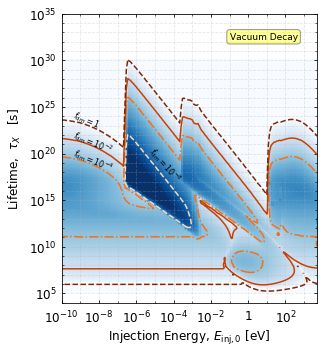

In [425]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [-8,-4,-2,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-','--'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')



#ax.set_xlim(Einj_values[0],Einj_values[-1])
ax.set_xlim(Einj_values[0],np.log10(5e3))
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(4,35)

ax.set_xlabel(label_injection_energy,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.15,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[-10,5,tau_values[0],
                           tau_values[-1]],
               origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(-9.5, 24.8, r'$f_\mathrm{dm}=1$' , rotation = -23,
          fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 22.8, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -23,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 20.8, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -23,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(-5.5, 21, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
        fontsize=8, 
          verticalalignment='top',color='k',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='None')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$',r'$10^{35}$'])


ax.text(-1., 33., 'Vacuum Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))

fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_tau_a_finally_' + name_ext)

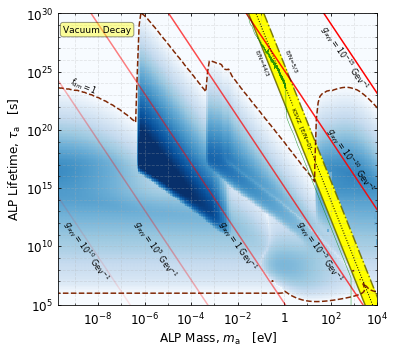

In [432]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

mass_values = np.log10(10**Einj_values/mass_to_Einj)

Mf = np.log10(10**Xf/mass_to_Einj)
# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Mf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-',':'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

masses_ev = np.logspace(-12,9,100)


xinjs = masses_ev/xinj_to_mass

gagg = 1e-15
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r', alpha=1)





gagg = 1e-10
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha = 0.9)


gagg = 1e-5
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.7)

gagg = 1e0
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.5)

gagg = 1e5
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.3)

gagg = 1e10
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.1)





ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')


name_ext = ''

if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '.pdf'




ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[mass_values[0],mass_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(0.03, 0.79, r'$f_\mathrm{dm}=1$' , rotation = -23,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))




ax.text(0.225, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{5}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.005, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{10}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



# ax.text(0.3, 0.63, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
#         transform=ax.transAxes, fontsize=8, 
#           verticalalignment='top',
#           bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.patch.set_color('grey') # or whatever color you like
ax.patch.set_alpha(.2)


mass_in_eV = np.logspace(-9,9,100)

E_over_N_minus_bla = 5./3. - 1.949
#E_over_N_minus_bla = 0.07#2. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_low = np.asarray(tau)
#ax.plot(mass_in_eV ,tau*1e-12,ls = '-')


E_over_N_minus_bla = 44./3. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_high = np.asarray(tau)

ax.plot(np.log10(mass_in_eV),np.log10(tau_high),ls='-',c='k',alpha=0.5)
ax.plot(np.log10(mass_in_eV),np.log10(tau_low),ls='-.',c='k',alpha=0.5)
ax.fill_between(np.log10(mass_in_eV),np.log10(tau_high),np.log10(tau_low),color='yellow',alpha=1.)
# ticks=np.arange(-10,6)
# plt.xticks(ticks)
# ticks=np.arange(5,30)
# plt.yticks(ticks)

# fig.tight_layout()


tau_ksvz = 8.9078e23*masses_ev**-5
ax.plot(np.log10(masses_ev),np.log10(tau_ksvz),c='k',lw=1,ls=':')
ax.text(0.27, 22, r'KSVZ  [E/N=0]' , rotation = -67,
          fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=1.))


ax.text(0, 27, r'E/N=5/3' , rotation = -67,
          fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-1.3, 27, r'E/N=44/3' , rotation = -67,
          fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))



# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev),np.log10(tau_dfsz),c='k',lw=1,ls=':')
# ax.text(0.625, 0.96, r'DFSZ' , rotation = -65,
#         transform=ax.transAxes, fontsize=8, 
#           verticalalignment='top',
#           bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

CAST = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/cast_env_2016.dat')
m_cast = CAST[:,0]
gagg_cast = CAST[:,1]

xinjs_cast = 1./xinj_to_mass*m_cast
gammas_casts = xinjs_cast**3.*1./(3.57e7)**2.*gagg_cast**2.


ax.plot(np.log10(m_cast),np.log10(1./gammas_casts),c='green',lw=0.5,alpha=0.8)
#ax.fill_between(CAST[:,0],CAST[:,1],1.e50,color='lightblue')


#ax.text(0.9, 0.23, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0))



m_nt = 1./mass_to_Einj*E_nt*1e3
ax.plot(np.log10(m_nt),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(m_nt),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)

# ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls='--')
# ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
# ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='r')

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-8}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])



ax.text(0.81, 0.97, r'$g_\mathrm{a\gamma\gamma}=10^{-15}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.text(0.83, 0.62, r'$g_\mathrm{a\gamma\gamma}=10^{-10}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(0.735, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{-5}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))




ax.text(0.49, 0.30, r'$g_\mathrm{a\gamma\gamma}=1\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



#ax.set_xlabel(label_mdm,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
#ax.set_ylabel(label_Tau_x,size=title_size)

ax.set_ylabel("ALP Lifetime, "+r'$\tau_\mathrm{a}\quad[\mathrm{s}]$',size=title_size)


ax.set_xlabel("ALP Mass, "+r'$m_\mathrm{a}\quad[\mathrm{eV}]$',size=title_size)

ax.text(-9.5, 29., 'Vacuum Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))


ax.set_xlim(mass_values[0],4)
ax.set_ylim(tau_values[0],tau_values[-1])

fig.tight_layout()
#plt.legend()
plt.savefig(path_to_figures + '/figures_for_paper_finally_alp_tau_a' + name_ext)

# coupling constant and mass

In [426]:
def g_agg(gamma,xinj):
    gagg = 3.57e7*gamma**0.5*xinj**(-3./2.)
    return gagg

g_agg = np.vectorize(g_agg)

def gammaX(gagg,xinj):
    gamma = (gagg/(3.57e7*xinj**(-3./2.)))**2.
    return gamma
gammaX = np.vectorize(gammaX)

In [427]:
# load the results
case = 'lyc+reio'
add_edges = 'yes'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_high_xinj_260920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

import math
for i in range(200):
    Zf[:,i] = [-5 if math.isnan(x) else x for x in Zf[:,i]]

tau_values = Yf[:,0]
Einj_values = Xf[0]


xinj_values = 10**Einj_values/xinj_to_Einj

mX_values = np.log10(xinj_to_mass*xinj_values)
gamma_values = np.log10(1./10**tau_values)
gagg_values = np.log10(g_agg(10**gamma_values,xinj_values))

# create an interpolating function fdm(m_X, Gamma_X):
import scipy 
f_at_einj_and_tauinj = scipy.interpolate.interp2d(Einj_values, tau_values, Zf,
                                                kind='linear',bounds_error=False,fill_value=np.nan)

In [241]:
len(gagg_values)

200

In [428]:
Xf_gagg = np.zeros((200, 200))
Yf_gagg = np.zeros((200, 200))
Zf_gagg = np.zeros((200, 200))

In [429]:
for i in range(200):
    for j in range(200):
        einj = 10**Xf[i][j]
        tau_X = 10**Yf[i][j]
        #fdm  = Zf[i][j]

        xinj = einj/xinj_to_Einj
        Xf_gagg[i][j]=np.log10(xinj_to_mass*xinj)
        gamma = 1./tau_X
        Yf_gagg[i][j]=np.log10(g_agg(gamma,xinj))
        #Zf_gagg[i][j] = fdm
    
    
    
    

In [430]:
# find minimum value of log10 gagg
mymin = min([min(r) for r in Yf_gagg])
print(mymin)
# find maximum value of log10 gagg
mymax = max([max(r) for r in Yf_gagg])
print(mymax)
# All the g_agg values in the range
# have been computed before:
print(gagg_values[0],gagg_values[199], len(gagg_values))
# Xf_gagg contains the masses:
# Xf_gagg = [[m_min,...,m_max],
#              :::::::::::::: ,
#            [m_min,...,m_max],]
# Yf_gagg_new has to contain the g_agg values as follows (in column):
Yf_gagg_new  = np.zeros((200,200))
for i in range(200):
    Yf_gagg_new[:,i] = gagg_values[::-1]

# then we loop over gagg and mX values and compute fdm:
for i in range(200):
    for j in range(200):
        log10mX = Xf_gagg[i][j]
        log10gagg = Yf_gagg_new[i][j]
        # compute lifetime  corresponding to mX and gagg:
        xinj = 10**log10mX/xinj_to_mass
        einj = xinj_to_Einj*xinj
        gamma  = gammaX(10**log10gagg,xinj)
        tauinj = 1./gamma
        fdm = f_at_einj_and_tauinj(np.log10(einj),np.log10(tauinj))
        Zf_gagg[i][j] = fdm


-20.391007258721398
14.608992741278602
14.608992741278602 -20.391007258721398 200


In [245]:
Yf_gagg_new

array([[-20.39100726, -20.39100726, -20.39100726, ..., -20.39100726,
        -20.39100726, -20.39100726],
       [-20.21490726, -20.21490726, -20.21490726, ..., -20.21490726,
        -20.21490726, -20.21490726],
       [-20.03930726, -20.03930726, -20.03930726, ..., -20.03930726,
        -20.03930726, -20.03930726],
       ...,
       [ 14.25714274,  14.25714274,  14.25714274, ...,  14.25714274,
         14.25714274,  14.25714274],
       [ 14.43309274,  14.43309274,  14.43309274, ...,  14.43309274,
         14.43309274,  14.43309274],
       [ 14.60899274,  14.60899274,  14.60899274, ...,  14.60899274,
         14.60899274,  14.60899274]])

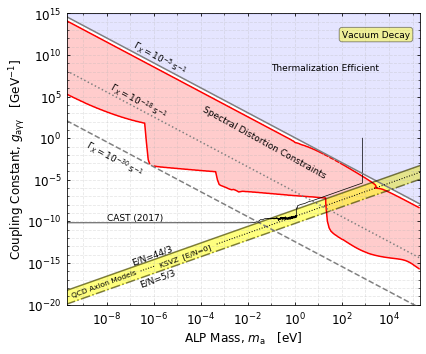

In [431]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5




# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

#levels = [-8,-4,-2,0]
levels = [-100,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf_gagg, Yf_gagg_new, Zf_gagg,
                levels,norm=normalize,linestyles=['-','-'],colors=['r','r'])
CS = ax.contourf(Xf_gagg, Yf_gagg_new, Zf_gagg,
                levels,extend='min',colors=['w','r'],alpha=0.2)

# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')





ax.set_xlabel("ALP Mass, "+r'$m_\mathrm{a}\quad[\mathrm{eV}]$',size=title_size)
ax.set_ylabel("Coupling Constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
#ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)




ax.set_xlim(mX_values[0],mX_values[-1])
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(gagg_values[::-1][0],gagg_values[::-1][-1])

#im = ax.imshow(Zf_gagg, 
#               extent=[mX_values[0],mX_values[-1],gagg_values[::-1][0],
#                           gagg_values[::-1][-1]],
#               origin='lower',
#           cmap=colormap2,norm=normalize, 
#               alpha=1.,aspect=0.5
#              )


#ax.text(-9.5, 24.8, r'$f_\mathrm{dm}=1$' , rotation = -23,
#          fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(-9.5, 22.8, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -23,
#         fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(-9.5, 20.8, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -23,
#         fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



#ax.text(-5.5, 21, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
#        fontsize=8, 
#          verticalalignment='top',color='k',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


#ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
#ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
#ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='None')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$10^{0}$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{-20}$',r'$10^{-15}$',r'$10^{-10}$',r'$10^{-5}$',r'$10^{0}$',r'$10^{5}$',r'$10^{10}$',r'$10^{15}$'])
CAST = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/cast_env_2016.dat')
m_cast = CAST[:,0]
gagg_cast = CAST[:,1]
ax.plot(np.log10(m_cast),np.log10(gagg_cast),c='k',ls='-',lw=0.7)


xinj_values = 10**mX_values/xinj_to_mass
gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-8')
gamma = 1e-30
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',ls='--',label='G=1e-30')
gamma = 1e-18
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',ls=':',label='G=1e-17')
#ax.text(0.5, 33., 'Standard Decay', fontsize=9, verticalalignment='top',
#      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))



mass_in_eV = np.logspace(-11,9,100)
xinj_am = mass_in_eV/xinj_to_mass

E_over_N_minus_bla = 5./3. - 1.949
#E_over_N_minus_bla = 0.07#2. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_low = np.asarray(tau)
#ax.plot(mass_in_eV ,tau*1e-12,ls = '-')
gamma_low = 1./tau_low

E_over_N_minus_bla = 44./3. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_high = np.asarray(tau)
gamma_high = 1./tau_high

ax.plot(np.log10(mass_in_eV),np.log10(g_agg(gamma_high,xinj_am)),ls='-',c='k',alpha=0.5)
ax.plot(np.log10(mass_in_eV),np.log10(g_agg(gamma_low,xinj_am)),ls='-.',c='k',alpha=0.5)
ax.fill_between(np.log10(mass_in_eV),np.log10(g_agg(gamma_high,xinj_am)),np.log10(g_agg(gamma_low,xinj_am)),
                color='yellow',alpha=0.5)
# ticks=np.arange(-10,6)
# plt.xticks(ticks)
# ticks=np.arange(5,30)
# plt.yticks(ticks)

# fig.tight_layout()


tau_ksvz = 8.9078e23*mass_in_eV**-5
gamma_ksvz = 1./tau_ksvz

ax.plot(np.log10(mass_in_eV)[(np.log10(mass_in_eV)>-6.6) & (np.log10(mass_in_eV)<-5.9)],
        np.log10(g_agg(gamma_ksvz,xinj_am))[(np.log10(mass_in_eV)>-6.6) & (np.log10(mass_in_eV)<-5.9)],
        c='k',lw=1,ls=':')

ax.plot(np.log10(mass_in_eV)[np.log10(mass_in_eV)>-3.5],
        np.log10(g_agg(gamma_ksvz,xinj_am))[np.log10(mass_in_eV)>-3.5],
        c='k',lw=1,ls=':')

ax.text(-5.8,-12.6, r'KSVZ  [E/N=0]' , rotation = 20.2,
        fontsize=7.5, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))





ax.text(-6.65, -15.6, r'E/N=5/3' , rotation = 20.2,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-7, -12.7, r'E/N=44/3' , rotation = 20.2,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-8, -9, r'CAST (2017)' , rotation = 0,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-9, 0, r'$\Gamma_X = 10^{-30}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))



ax.text(-8, 7, r'$\Gamma_X = 10^{-18}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-7, 12, r'$\Gamma_X = 10^{-5}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))


ax.text(-4, 4, 'Spectral Distortion Constraints' , rotation = -29,c='k',
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))





ax.text(-9.5,-15.7, r'QCD Axion Models' , rotation = 20.2,
        fontsize=7.5, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))


ax.text(-1, 9, r'Thermalization Efficient' , rotation = 0,c='k',
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

xinj_values = 10**mX_values/xinj_to_mass
gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
#ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-8')
ax.fill_between(mX_values,np.log10(g_agg(gamma,xinj_values)),15,color='b',alpha=0.1)


ax.text(2., 13., 'Vacuum Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))

ax.set_ylim(-20,15)

fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_gagg_finally' + name_ext)

# new library at high frequency

In [3]:
sd_lib_extended_run_high_xinj = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_high_xinj_160920b',sd_lib_extended_run_high_xinj)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_stim_070920',sd_lib_extended_run_stim)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [4]:
sd_lib_extended_run = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_190820',sd_lib_extended_run)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [ ]:
def pi_compute_fdm_constraints(log10_tau_a,log10_Einj_in_ev,asd_lib,*args,**kwargs):
    
    asd_lib_high_xinj0 = kwargs.get('asd_lib_high_xinj0',None)
    
    Einj_in_ev = 10**log10_Einj_in_ev
    tau_a = 10**log10_tau_a
    #ma_in_ev = log10_ma_in_ev
    #tau_a = log10_tau_a
    xinj = Einj_in_ev/xinj_to_Einj
    #gagg = 3.57e7*(Gamma_values)**0.5*Xinj_values**(-3./2.)
    Gamma = 1./tau_a#((gagg/3.57e7)/xinj**(-3./2.))**2.
    lib_for_constraints = asd_lib
    if asd_lib_high_xinj0:
        #if xinj>1e4 and Gamma<1e-14:
        if xinj>(80./xinj_to_Einj):
            lib_for_constraints = asd_lib_high_xinj0
            
    
    # for short lifetime, we compute the constraint
    # analytically using the mu-distortion
    if Gamma>1e-8:
        ct = sd.cosmotherm()
        ct.ct_T0 = 2.7255
        ct.ct_Yp = 0.245407
        ct.ct_N_eff = 3.046
        ct.ct_Omega_m = 0.312331
        ct.ct_Omega_b = 0.0491137
        ct.ct_h = 0.675422
        
        
        cosmo = sd.cosmo()
        X_dm = sd.dm_particle()
        pi.set_dm_params_to_CT_pi_params(X_dm,ct)
        pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
        
        X_dm.Gamma_inj = Gamma
        X_dm.x_0 = xinj
        fdm_constraint = np.abs(pi.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,N_int = 5))
    # for long lifetime, we compute the constraint
    # by extrapolating
    elif Gamma < lib_for_constraints.Gamma_inj_min:
        xi_a = [xinj]
        Gamma_values = [lib_for_constraints.Gamma_inj_min]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']*asd_lib.Gamma_inj_min/Gamma
    # for intermerdiate cases we compute the constraints using fisher matrix
    else:
        xi_a = [xinj]
        Gamma_values = [Gamma]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']
    return np.log10(fdm_constraint)

pi_compute_fdm_constraints = np.vectorize(pi_compute_fdm_constraints)







In [50]:
1e4*xinj_to_Einj

2.3489999999999998

In [23]:
def pi_compute_fdm_constraints(log10_tau_a,log10_Einj_in_ev,asd_lib,*args,**kwargs):
    
    asd_lib_high_xinj0 = kwargs.get('asd_lib_high_xinj0',None)
    
    Einj_in_ev = 10**log10_Einj_in_ev
    tau_a = 10**log10_tau_a
    #ma_in_ev = log10_ma_in_ev
    #tau_a = log10_tau_a
    xinj = Einj_in_ev/xinj_to_Einj
    #gagg = 3.57e7*(Gamma_values)**0.5*Xinj_values**(-3./2.)
    Gamma = 1./tau_a#((gagg/3.57e7)/xinj**(-3./2.))**2.
    lib_for_constraints = asd_lib
    if asd_lib_high_xinj0:
        #if xinj>1e4 and Gamma<1e-14:
        if xinj>(80./xinj_to_Einj):
            lib_for_constraints = asd_lib_high_xinj0
            
    
    # for short lifetime, we compute the constraint
    # analytically using the mu-distortion
    if Gamma>1e-8:
        ct = sd.cosmotherm()
        ct.ct_T0 = 2.7255
        ct.ct_Yp = 0.245407
        ct.ct_N_eff = 3.046
        ct.ct_Omega_m = 0.312331
        ct.ct_Omega_b = 0.0491137
        ct.ct_h = 0.675422
        
        
        cosmo = sd.cosmo()
        X_dm = sd.dm_particle()
        pi.set_dm_params_to_CT_pi_params(X_dm,ct)
        pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
        
        X_dm.Gamma_inj = Gamma
        X_dm.x_0 = xinj
        fdm_constraint = np.abs(pi.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,N_int = 5))
    # for long lifetime, we compute the constraint
    # by extrapolating
    elif Gamma < lib_for_constraints.Gamma_inj_min:
        xi_a = [xinj]
        Gamma_values = [lib_for_constraints.Gamma_inj_min]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']*asd_lib.Gamma_inj_min/Gamma
    # for intermerdiate cases we compute the constraints using fisher matrix
    else:
        xi_a = [xinj]
        Gamma_values = [Gamma]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']
    return np.log10(fdm_constraint)

pi_compute_fdm_constraints = np.vectorize(pi_compute_fdm_constraints)






In [24]:
firas = sd.firas()
edges = sd.edges()

add_edges = 'yes'

#tau_values = np.linspace(13,20,50)
#Einj_values =np.linspace(0,5,50)

tau_values = np.linspace(5,30,200)
Einj_values =np.linspace(-10,5,200)
#Einj_values =np.linspace(-1,5,50)

xlist = Einj_values
ylist = tau_values

X, Y = np.meshgrid(xlist, ylist)

a_dict = {}
a_dict['firas'] = firas
a_dict['edges'] = edges

if add_edges == 'yes':
    a_dict['add_edges'] = 'yes'
else:
    a_dict['add_edges'] = 'no'

#lib = sd_lib_lyc_reio
lib = sd_lib_extended_run
a_dict['asd_lib_high_xinj0'] = sd_lib_extended_run_high_xinj

#Z = vfunc_tau_a_contours(Y,X,lib,**a_dict)
Z =  pi_compute_fdm_constraints(Y,X,lib,**a_dict)

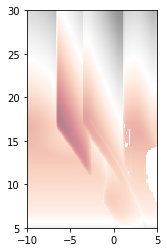

In [25]:
plt.imshow(Z, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap='RdGy', alpha=0.5)

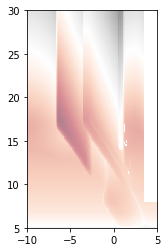

In [20]:
plt.imshow(Z, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap='RdGy', alpha=0.5)

In [26]:
# save the results

case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
     name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_high_xinj_260920'
#name_ext += '_test'
np.shape(Z)
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'

    
np.savetxt(path, Z, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'


np.savetxt(path, X, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'


np.savetxt(path, Y, delimiter='\t', fmt='%.4e')





In [207]:
# load the results
case = 'lyc+reio'
add_edges = 'yes'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_high_xinj_260920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

import math
for i in range(200):
    Zf[:,i] = [-5 if math.isnan(x) else x for x in Zf[:,i]]

In [208]:
# load the non-thermal distorsion

NT = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/E_gamma_nt.dat')
z_nt = NT[:,1]
E_nt = NT[:,0]

# f_nt = interp1d(z_nt,E_nt)


ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422
pi.set_dm_params_to_CT_pi_params(X_dm,ct)
pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)

G_nt = []
for zx in z_nt:
    G_nt.append(pi.find_Gamma_inj_for_injection_redshift_zX(zx,cosmo,ct))
G_nt = np.asarray(G_nt)

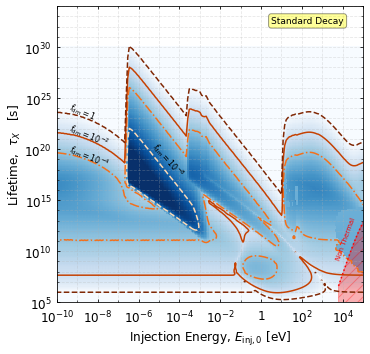

In [209]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [-8,-4,-2,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-','--'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')



ax.set_xlim(Einj_values[0],Einj_values[-1])
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(tau_values[0],34)

ax.set_xlabel(label_injection_energy,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[-10,5,tau_values[0],
                           tau_values[-1]],
               origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(-9.5, 24.8, r'$f_\mathrm{dm}=1$' , rotation = -23,
          fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 22.8, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -23,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 20.8, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -23,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(-5.5, 21, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
        fontsize=8, 
          verticalalignment='top',color='k',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
        transform=ax.transAxes, fontsize=7, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='None')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])


ax.text(0.5, 33., 'Standard Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))

fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_tau_a_final' + name_ext)

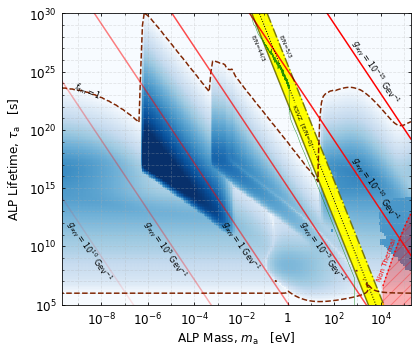

In [123]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

mass_values = np.log10(10**Einj_values/mass_to_Einj)

Mf = np.log10(10**Xf/mass_to_Einj)
# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Mf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-',':'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

masses_ev = np.logspace(-12,9,100)


xinjs = masses_ev/xinj_to_mass

gagg = 1e-15
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r', alpha=1)





gagg = 1e-10
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha = 0.9)


gagg = 1e-5
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.7)

gagg = 1e0
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.5)

gagg = 1e5
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.3)

gagg = 1e10
gammas = xinjs**3.*1./(3.57e7)**2.*gagg**2.
plt.plot(np.log10(masses_ev),np.log10(1./gammas),ls='-',c='r',alpha=0.1)





ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')


name_ext = ''

if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '.pdf'

ax.set_xlim(mass_values[0],mass_values[-1])
ax.set_ylim(tau_values[0],tau_values[-1])


ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[mass_values[0],mass_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(0.03, 0.77, r'$f_\mathrm{dm}=1$' , rotation = -23,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(0.67, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{-5}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.447, 0.30, r'$g_\mathrm{a\gamma\gamma}=1\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.text(0.225, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{5}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.005, 0.30, r'$g_\mathrm{a\gamma\gamma}=10^{10}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.text(0.82, 0.52, r'$g_\mathrm{a\gamma\gamma}=10^{-10}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.82, 0.92, r'$g_\mathrm{a\gamma\gamma}=10^{-15}\,\,\mathrm{Gev}^{-1}$' , rotation = -56,
        transform=ax.transAxes, fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


# ax.text(0.3, 0.63, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
#         transform=ax.transAxes, fontsize=8, 
#           verticalalignment='top',
#           bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.patch.set_color('grey') # or whatever color you like
ax.patch.set_alpha(.2)


mass_in_eV = np.logspace(-9,9,100)

E_over_N_minus_bla = 5./3. - 1.949
#E_over_N_minus_bla = 0.07#2. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_low = np.asarray(tau)
#ax.plot(mass_in_eV ,tau*1e-12,ls = '-')


E_over_N_minus_bla = 44./3. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_high = np.asarray(tau)

ax.plot(np.log10(mass_in_eV),np.log10(tau_high),ls='-',c='k',alpha=0.5)
ax.plot(np.log10(mass_in_eV),np.log10(tau_low),ls='-.',c='k',alpha=0.5)
ax.fill_between(np.log10(mass_in_eV),np.log10(tau_high),np.log10(tau_low),color='yellow',alpha=1.)
# ticks=np.arange(-10,6)
# plt.xticks(ticks)
# ticks=np.arange(5,30)
# plt.yticks(ticks)

# fig.tight_layout()


tau_ksvz = 8.9078e23*masses_ev**-5
ax.plot(np.log10(masses_ev),np.log10(tau_ksvz),c='k',lw=1,ls=':')
ax.text(0.659, 0.69, r'KSVZ  [E/N=0]' , rotation = -67,
        transform=ax.transAxes, fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=1.))


ax.text(0.62, 0.93, r'E/N=5/3' , rotation = -67,
        transform=ax.transAxes, fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(0.54, 0.93, r'E/N=44/3' , rotation = -67,
        transform=ax.transAxes, fontsize=6, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))



# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev),np.log10(tau_dfsz),c='k',lw=1,ls=':')
# ax.text(0.625, 0.96, r'DFSZ' , rotation = -65,
#         transform=ax.transAxes, fontsize=8, 
#           verticalalignment='top',
#           bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

CAST = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/cast_env_2016.dat')
m_cast = CAST[:,0]
gagg_cast = CAST[:,1]

xinjs_cast = 1./xinj_to_mass*m_cast
gammas_casts = xinjs_cast**3.*1./(3.57e7)**2.*gagg_cast**2.


ax.plot(np.log10(m_cast),np.log10(1./gammas_casts),c='green',lw=0.5,alpha=0.8)
#ax.fill_between(CAST[:,0],CAST[:,1],1.e50,color='lightblue')


ax.text(0.9, 0.23, r'Non Thermal' , rotation = 70,color='r',
        transform=ax.transAxes, fontsize=7, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0))



m_nt = 1./mass_to_Einj*E_nt*1e3
ax.plot(np.log10(m_nt),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(m_nt),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)

# ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls='--')
# ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
# ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='r')

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-8}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])


#ax.set_xlabel(label_mdm,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
ax.set_ylabel("ALP Lifetime, "+r'$\tau_\mathrm{a}\quad[\mathrm{s}]$',size=title_size)


ax.set_xlabel("ALP Mass, "+r'$m_\mathrm{a}\quad[\mathrm{eV}]$',size=title_size)
fig.tight_layout()
#plt.legend()
#plt.savefig(path_to_figures + '/figures_for_paper_alp_tau_a' + name_ext)

# coupling constant and mass

In [179]:
def g_agg(gamma,xinj):
    gagg = 3.57e7*gamma**0.5*xinj**(-3./2.)
    return gagg

g_agg = np.vectorize(g_agg)

def gammaX(gagg,xinj):
    gamma = (gagg/(3.57e7*xinj**(-3./2.)))**2.
    return gamma
gammaX = np.vectorize(gammaX)

In [211]:
# load the results
case = 'lyc+reio'
add_edges = 'yes'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_high_xinj_260920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

import math
for i in range(200):
    Zf[:,i] = [-5 if math.isnan(x) else x for x in Zf[:,i]]

tau_values = Yf[:,0]
Einj_values = Xf[0]


xinj_values = 10**Einj_values/xinj_to_Einj

mX_values = np.log10(xinj_to_mass*xinj_values)
gamma_values = np.log10(1./10**tau_values)
gagg_values = np.log10(g_agg(10**gamma_values,xinj_values))

# create an interpolating function fdm(m_X, Gamma_X):
import scipy 
f_at_einj_and_tauinj = scipy.interpolate.interp2d(Einj_values, tau_values, Zf,
                                                kind='linear',bounds_error=False,fill_value=np.nan)

In [212]:
len(gagg_values)

200

In [213]:
Xf_gagg = np.zeros((200, 200))
Yf_gagg = np.zeros((200, 200))
Zf_gagg = np.zeros((200, 200))

In [214]:
for i in range(200):
    for j in range(200):
        einj = 10**Xf[i][j]
        tau_X = 10**Yf[i][j]
        #fdm  = Zf[i][j]

        xinj = einj/xinj_to_Einj
        Xf_gagg[i][j]=np.log10(xinj_to_mass*xinj)
        gamma = 1./tau_X
        Yf_gagg[i][j]=np.log10(g_agg(gamma,xinj))
        #Zf_gagg[i][j] = fdm
    
    
    
    

In [215]:
# find minimum value of log10 gagg
mymin = min([min(r) for r in Yf_gagg])
print(mymin)
# find maximum value of log10 gagg
mymax = max([max(r) for r in Yf_gagg])
print(mymax)
# All the g_agg values in the range
# have been computed before:
print(gagg_values[0],gagg_values[199], len(gagg_values))
# Xf_gagg contains the masses:
# Xf_gagg = [[m_min,...,m_max],
#              :::::::::::::: ,
#            [m_min,...,m_max],]
# Yf_gagg_new has to contain the g_agg values as follows (in column):
Yf_gagg_new  = np.zeros((200,200))
for i in range(200):
    Yf_gagg_new[:,i] = gagg_values[::-1]

# then we loop over gagg and mX values and compute fdm:
for i in range(200):
    for j in range(200):
        log10mX = Xf_gagg[i][j]
        log10gagg = Yf_gagg_new[i][j]
        # compute lifetime  corresponding to mX and gagg:
        xinj = 10**log10mX/xinj_to_mass
        einj = xinj_to_Einj*xinj
        gamma  = gammaX(10**log10gagg,xinj)
        tauinj = 1./gamma
        fdm = f_at_einj_and_tauinj(np.log10(einj),np.log10(tauinj))
        Zf_gagg[i][j] = fdm


-20.391007258721398
14.608992741278602
14.608992741278602 -20.391007258721398 200


In [216]:
Yf_gagg_new

array([[-20.39100726, -20.39100726, -20.39100726, ..., -20.39100726,
        -20.39100726, -20.39100726],
       [-20.21490726, -20.21490726, -20.21490726, ..., -20.21490726,
        -20.21490726, -20.21490726],
       [-20.03930726, -20.03930726, -20.03930726, ..., -20.03930726,
        -20.03930726, -20.03930726],
       ...,
       [ 14.25714274,  14.25714274,  14.25714274, ...,  14.25714274,
         14.25714274,  14.25714274],
       [ 14.43309274,  14.43309274,  14.43309274, ...,  14.43309274,
         14.43309274,  14.43309274],
       [ 14.60899274,  14.60899274,  14.60899274, ...,  14.60899274,
         14.60899274,  14.60899274]])

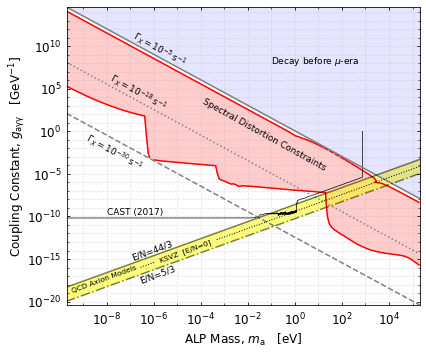

In [339]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5




# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

#levels = [-8,-4,-2,0]
levels = [-100,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf_gagg, Yf_gagg_new, Zf_gagg,
                levels,norm=normalize,linestyles=['-','-'],colors=['r','r'])
CS = ax.contourf(Xf_gagg, Yf_gagg_new, Zf_gagg,
                levels,extend='min',colors=['w','r'],alpha=0.2)

# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')





ax.set_xlabel("ALP Mass, "+r'$m_\mathrm{a}\quad[\mathrm{eV}]$',size=title_size)
ax.set_ylabel("Coupling Constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
#ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)




ax.set_xlim(mX_values[0],mX_values[-1])
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(gagg_values[::-1][0],gagg_values[::-1][-1])

#im = ax.imshow(Zf_gagg, 
#               extent=[mX_values[0],mX_values[-1],gagg_values[::-1][0],
#                           gagg_values[::-1][-1]],
#               origin='lower',
#           cmap=colormap2,norm=normalize, 
#               alpha=1.,aspect=0.5
#              )


#ax.text(-9.5, 24.8, r'$f_\mathrm{dm}=1$' , rotation = -23,
#          fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(-9.5, 22.8, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -23,
#         fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(-9.5, 20.8, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -23,
#         fontsize=8, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



#ax.text(-5.5, 21, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
#        fontsize=8, 
#          verticalalignment='top',color='k',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

#ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
#        transform=ax.transAxes, fontsize=7, 
#          verticalalignment='top',
#          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


#ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
#ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
#ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='None')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$10^{0}$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{-25}$',r'$10^{-20}$',r'$10^{-15}$',r'$10^{-10}$',r'$10^{-5}$',r'$10^{0}$',r'$10^{5}$',r'$10^{10}$',r'$10^{15}$'])
CAST = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/cast_env_2016.dat')
m_cast = CAST[:,0]
gagg_cast = CAST[:,1]
ax.plot(np.log10(m_cast),np.log10(gagg_cast),c='k',ls='-',lw=0.7)


xinj_values = 10**mX_values/xinj_to_mass
gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-8')
gamma = 1e-30
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',ls='--',label='G=1e-30')
gamma = 1e-18
np.log10(g_agg(gamma,xinj_values))
ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',ls=':',label='G=1e-17')
#ax.text(0.5, 33., 'Standard Decay', fontsize=9, verticalalignment='top',
#      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))



mass_in_eV = np.logspace(-11,9,100)
xinj_am = mass_in_eV/xinj_to_mass

E_over_N_minus_bla = 5./3. - 1.949
#E_over_N_minus_bla = 0.07#2. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_low = np.asarray(tau)
#ax.plot(mass_in_eV ,tau*1e-12,ls = '-')
gamma_low = 1./tau_low

E_over_N_minus_bla = 44./3. - 1.949
def f_p(m):
    return (3.4718e24/(E_over_N_minus_bla)**2.)*m**-5

tau = []
for m in mass_in_eV:
    tau.append(f_p(m))
tau_high = np.asarray(tau)
gamma_high = 1./tau_high

ax.plot(np.log10(mass_in_eV),np.log10(g_agg(gamma_high,xinj_am)),ls='-',c='k',alpha=0.5)
ax.plot(np.log10(mass_in_eV),np.log10(g_agg(gamma_low,xinj_am)),ls='-.',c='k',alpha=0.5)
ax.fill_between(np.log10(mass_in_eV),np.log10(g_agg(gamma_high,xinj_am)),np.log10(g_agg(gamma_low,xinj_am)),
                color='yellow',alpha=0.5)
# ticks=np.arange(-10,6)
# plt.xticks(ticks)
# ticks=np.arange(5,30)
# plt.yticks(ticks)

# fig.tight_layout()


tau_ksvz = 8.9078e23*mass_in_eV**-5
gamma_ksvz = 1./tau_ksvz

ax.plot(np.log10(mass_in_eV)[(np.log10(mass_in_eV)>-6.6) & (np.log10(mass_in_eV)<-5.9)],
        np.log10(g_agg(gamma_ksvz,xinj_am))[(np.log10(mass_in_eV)>-6.6) & (np.log10(mass_in_eV)<-5.9)],
        c='k',lw=1,ls=':')

ax.plot(np.log10(mass_in_eV)[np.log10(mass_in_eV)>-3.5],
        np.log10(g_agg(gamma_ksvz,xinj_am))[np.log10(mass_in_eV)>-3.5],
        c='k',lw=1,ls=':')

ax.text(-5.8,-12.6, r'KSVZ  [E/N=0]' , rotation = 20.2,
        fontsize=7.5, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))





ax.text(-6.65, -15.6, r'E/N=5/3' , rotation = 20.2,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-7, -12.7, r'E/N=44/3' , rotation = 20.2,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-8, -9, r'CAST (2017)' , rotation = 0,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))




ax.text(-9, 0, r'$\Gamma_X = 10^{-30}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))



ax.text(-8, 7, r'$\Gamma_X = 10^{-18}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

ax.text(-7, 12, r'$\Gamma_X = 10^{-5}\,\mathrm{s}^{-1}$' , rotation = -29,
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))


ax.text(-4, 4, 'Spectral Distortion Constraints' , rotation = -29,c='k',
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))





ax.text(-9.5,-15.7, r'QCD Axion Models' , rotation = 20.2,
        fontsize=7.5, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))


ax.text(-1, 9, r'Decay before $\mu$-era' , rotation = 0,c='k',
         fontsize=9, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='yellow',edgecolor='none', alpha=0.))

xinj_values = 10**mX_values/xinj_to_mass
gamma = 1e-5
np.log10(g_agg(gamma,xinj_values))
#ax.plot(mX_values,np.log10(g_agg(gamma,xinj_values)),c='grey',label='G=1e-8')
ax.fill_between(mX_values,np.log10(g_agg(gamma,xinj_values)),15,color='b',alpha=0.1)

fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_gagg_final' + name_ext)

In [74]:
gagg_values

array([14.60899274, 14.54619274, 14.48334274, 14.42054274, 14.35774274,
       14.29494274, 14.23209274, 14.16929274, 14.10649274, 14.04364274,
       13.98084274, 13.91804274, 13.85524274, 13.79239274, 13.72959274,
       13.66679274, 13.60394274, 13.54114274, 13.47834274, 13.41554274,
       13.35269274, 13.28989274, 13.22709274, 13.16429274, 13.10144274,
       13.03864274, 12.97584274, 12.91299274, 12.85019274, 12.78739274,
       12.72459274, 12.66174274, 12.59894274, 12.53614274, 12.47329274,
       12.41049274, 12.34769274, 12.28489274, 12.22204274, 12.15924274,
       12.09649274, 12.03349274, 11.97099274, 11.90799274, 11.84499274,
       11.78249274, 11.71949274, 11.65649274, 11.59399274, 11.53099274,
       11.46849274, 11.40549274, 11.34249274, 11.27999274, 11.21699274,
       11.15399274, 11.09149274, 11.02849274, 10.96599274, 10.90299274,
       10.83999274, 10.77749274, 10.71449274, 10.65149274, 10.58899274,
       10.52599274, 10.46349274, 10.40049274, 10.33749274, 10.27

#final spectra movie

In [409]:
Gamma_values= np.logspace(-8,-17,70)
xdec_values = [1e-3]

1.000e-08
1.000e-03


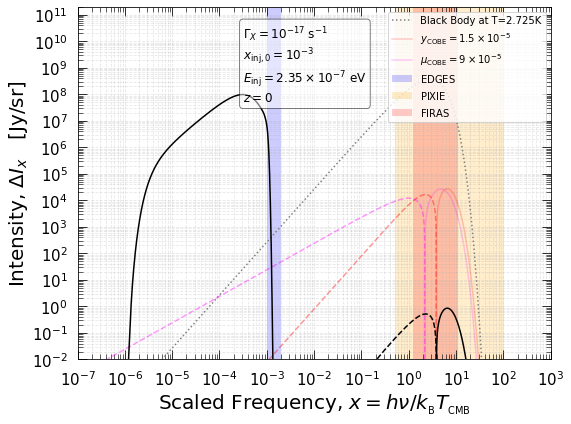

In [412]:
for ig in range(len(xdec_values)):
    #if ig==0:
    #    continue
    for ix in range(len(xdec_values)):
        gamma = Gamma_values[ix]
        str_gamma = str("%.3e"%gamma)
        print(str_gamma)
        xdec = xdec_values[ig]
        str_xdec = "%.3e"%xdec
        print(str_xdec)
        solz_z_dict = dict_results['results_at_xdec'][ig][ix]


        B_nu = np.vectorize(sd.B_nu_of_T)
        i = 0
        #i = 46
        #for gamma_asked in sd_lib_extended_run.Gamma_values:
        nx = len(Gamma_values)
        x = []
        y = []
        xinj = []
        gammainj = []
        fdm_values = []
        #z_asked = np.logspace(-2,5,1e3)
        for k in range(nx):
            gamma = Gamma_values[k]
            xinj.append(xdec)
            gammainj.append(gamma)
            #S_xe_history = pi.GetXeHistory(gamma_asked,xinj,z_asked,sd_lib_extended_run)
            x_asked = np.logspace(np.log10(1e-8),np.log10(1e8),3000)
            #fdm_value = GetSpectra(gamma_p,xinj_p,x_asked,a_lib,get_fisher_fdm='yes',use_edges='yes')["fisher_fdm"]


            S_pectra = pi.GetSpectra(gamma,xdec,x_asked,sd_lib_extended_run)
            x.append(S_pectra['x'])
            y.append(S_pectra['DI'])
            #y.append(solz_z_dict_no_inj['DI'][k])
            #y.append(solz_z_dict['DI'][k])#-solz_z_dict_no_inj['DI'][k])

            #fdm_values.append(sd_lib_extended_run.finj_2d[i][k][0]/1.3098e4*sd_lib_extended_run.x_inj_values[k])
        #print(gamma_asked)

        #z_no_inj = sd_lib_extended_run.DXe_Xe_redshifts_2d[0][0]
        #Xe_no_inj = sd_lib_extended_run.Xe_no_inj_2d[0][0]

        #xinj = np.logspace(-8,7,nx)
        x_min = 1.e-7
        x_max = 1.e3
        #raise

        fig, ax1 = plt.subplots(1,1,figsize=(8,6))
        label_size = 15
        title_size = 20
        legend_size = 25
        handle_length = 1.5

        ymin = 1.e-2
        ymax = 2e11


        linesp = []
        patches = []


        i_ax = 0
        firas = sd.firas()


        for ax in [ax1]:
            ax.set_xlim(x_min,x_max)
            ax.set_ylim(ymin,ymax)
            ax.set_xscale('log')
            ax.set_yscale('log')


            #ax.set_xlabel("scaled injection frequency, "+ r'$x_\mathrm{inj}=h\nu_\mathrm{inj}/k_{_\mathrm{B}}T_{\gamma}$',size=title_size)
            ax.set_xlabel(label_scaled_frequency,size=title_size)
            ax.set_ylabel(label_intensity,size=title_size)
            ax.yaxis.set_label_coords(-.1,0.5)

            # ticks_array = np.logspace(-6,6,13)
            # ax.set_xticks(ticks_array)

            # ticks_array = np.logspace(-8,2,11)
            # ax.set_yticks(ticks_array)


            ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
            ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

            plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
            plt.setp(ax.get_xticklabels(), fontsize=label_size)

            ax.xaxis.set_ticks_position('both')
            ax.yaxis.set_ticks_position('both')
            #ax.plot(z_no_inj,Xe_no_inj,c='r')


            ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
            ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
            ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')

            x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)

            bnu = B_nu(x_asked*sd.kb*pi.firas_T0_bf/sd.hplanck,pi.firas_T0_bf)*1e6
            ax.plot(x_asked,bnu,c='grey',ls=':',label='Black Body at T=2.725K')

            Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
            ax.plot(x_asked,Y,c='r',alpha = 0.2,label = label_y_firas)
            ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

            MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
            ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.2,label=label_mu_firas)
            ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)

            ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
            ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
            for label in ax.yaxis.get_ticklabels()[::2]:
                label.set_visible(True) #(3)

            ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
            ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
            ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
            ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

            # manipulate x-axis ticks and labels
            ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
            ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
            for label in ax.xaxis.get_ticklabels()[::2]:
                label.set_visible(True) #(3)

            case_type = 'bare'
            case_color ='green'
            #ax.text(0.85, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
            #  bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

            ax.grid( b=True, which="both", alpha=0.3, linestyle='--')    
            ax.legend(loc=1)

            #plt.grid( b=True, which="both", alpha=0.3, linestyle='--')

            i_ax = i_ax + 1


        linesp1 = [ax1.plot([], [],c='k',ls='-')[0] for _ in range(1)]
        linesm1 = [ax1.plot([], [],c='k',ls='--')[0] for _ in range(1)]
        text_gamma =  [ax.text(0.05, 0.15, r'$z= %.4e$'%1, transform=ax.transAxes, fontsize=14, verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))]
        patches1 = linesp1 +linesm1 + text_gamma 


        patches = patches1




        def init():

            for line in linesp1:
                line.set_data([], [])

            return patches

        def animate(i):
            for j,line in enumerate(linesp1):
                if j==0:
                    line.set_data(x[i],y[i])
            for j,line in enumerate(linesm1):
                if j==0:
                    line.set_data(x[i],-y[i])
                text_gamma[j].remove()
                #einj = xinj_to_Einj*xinj[i]
                einj = xinj_to_Einj*xdec
                text_gamma_str1 = r'$z=0$'
                text_gamma_str2 = r'$E_\mathrm{inj}=$'+ scientific_notation(einj)+' '+r'$\mathrm{eV}$'
                text_gamma_str3 = r'$x_\mathrm{inj,0}=$'+ scientific_notation(xinj[i])
                text_gamma_str4 = r'$\Gamma_X=$'+ scientific_notation(gammainj[i])+' '+r'$\mathrm{s}^{-1}$'
                #text_gamma_str3 = r'$f_\mathrm{dm}= %.4e$'%fdm_values[i]
                text_gamma_str = '\n'.join((text_gamma_str4,
                                            text_gamma_str3,
                                            text_gamma_str2,
                                            text_gamma_str1))

                text_gamma[j] = ax.text(0.35, 0.95, text_gamma_str , transform=ax.transAxes, fontsize=12, verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

            return patches


        fig.tight_layout()




        anim = animation.FuncAnimation(fig, animate, init_func=init,
                                       frames=len(y), interval=800, blit=True)

        anim.save(path_to_figures + '/Dn_today_movie_Drho_rho_3e-5_xinj_'+str_xdec+'.mp4', fps=3, extra_args=['-vcodec', 'libx264'],dpi=100)
        #plt.show()
        i+=1

# Redshift dependence

In [393]:
param_name = 'photon injection x_dec'
xi_array = [1e5]
Gamma_values = [1e-6]

In [395]:
import specdist as sd
import numpy as np

photon_injection_case = 'redshift_dependence_no_lyc'
compute_hubble_dist = 'yes'

finj_from_fisher = 'no'
add_edges = 'yes'


if compute_hubble_dist == 'yes':
    Drho_rho = 1e-100
    photon_injection_case += '_no_injection'
else:
    Drho_rho = 3e-5


# load photon injection and cosmotherm modules
ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()


if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':
    firas = sd.firas()
    edges = sd.edges()
    a_dict = {}
    a_dict['firas'] = firas
    a_dict['edges'] = edges
    a_dict['add_edges'] = 'yes'
    sd_lib_for_fisher = sd.specdist_ct_spectra_lib()
    sd.load_ct_spectra_lib("xe_history_200720",sd_lib_for_fisher)




# set relevant parameter values
ct.ct_Drho_rho_dec = Drho_rho
# ct.ct_h = 0.70
# ct.ct_Omega_b = 0.0457
# ct.ct_Omega_m = 0.30
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 2e7
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422

ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 0
ct.ct_pi_stim = 0
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1

ct.ct_include_collisions = 0
ct.pi_use_zstart_from_total_energy_fraction = 'no'

sd.set_dm_params_to_CT_pi_params(X_dm,ct)
sd.set_cosmo_to_CT_cosmo_params(cosmo,ct)

#xi_array = np.logspace(np.log10(1e4),np.log10(5e8),4)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1e7),20)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1.e7),64)
#einj = 10

#xi_array = [einj/xinj_to_Einj]
#Gamma_X = 1e-6 #np.logspace(-9,-6,4)
#zi_array = [1.1e6,9.9e5]
#for Gamma_X in np.logspace(-30,-8,20):
#for Gamma_X in np.logspace(-8,-20,80):
for Gamma_X in Gamma_values:
    str_gamma = str("%.3e"%Gamma_X)

    ct.ct_Gamma_dec = Gamma_X
    #ct.ct_x_dec = 1e7
    args = {}
    p_name = param_name
    #p_name = 'zend'
    p_array = xi_array
    #p_array = zi_array
    args['param_values_array'] = p_array
    args['param_name'] = p_name
    args['save_spectra'] = 'yes'


    if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':

        # Gamma_values = [ct.ct_Gamma_dec]
        # xinj_array = [ct.ct_x_dec]
        # f_dm_fisher = sd.pi_run_fisher_constraints(Gamma_values,xinj_array,sd_lib,**a_dict)
        # print(f_dm_fisher)
        # ct.ct_Drho_rho_dec = 0.
        # ct.ct_photon_injection_f_dec = f_dm_fisher['curves'][0]['finj']
        # print('finj_fisher = %e'%ct.ct_photon_injection_f_dec)
        ct.ct_pi_finj_from_fisher = 'yes'
        ct.ct_x_dec =  1e-6
        args['dict_for_fisher'] = a_dict
        args['sd_lib_for_fisher'] = sd_lib_for_fisher
    else:
        args['dict_for_fisher'] = {}
        args['sd_lib_for_fisher'] = None
        ct.ct_photon_injection_f_dec = 0.
        print('not using finj, using Drho_rho instead.')




    ct.save_dir_name = photon_injection_case + '_G_' + str_gamma

    R = ct.run_cosmotherm_parallel(**args)
#print(R)



not using finj, using Drho_rho instead.


In [396]:
import glob, os
dict_results = {}
dict_results['Gamma_X'] = []
dict_results['results_at_xdec'] = []
for Gamma_X in Gamma_values:
    dict_results['Gamma_X'].append(Gamma_X)
    str_gamma = str("%.3e"%Gamma_X)
    results_at_gamma =[]
    
    for (xdec,i) in zip(xi_array,range(len(xi_array))):
        path_to_files = '/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_lyc_G_'+str_gamma+'/tmp_'
        path_to_files_no_inj = '/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_lyc_no_injection_G_'+str_gamma+'/tmp_'


        path_to_files += str(i)+'/Solutions_at_z/'
        path_to_files_no_inj += str(i)+'/Solutions_at_z/'
        
        os.chdir(path_to_files)
        file_names = []
        step_id = []
        solz_z_dict={}

        for file in glob.glob("*.dat"):
            parts=file.split('.')
            step_id.append(int(parts[1]))
            file_names.append(file)

        LS = zip(step_id,file_names)
        LS = sorted(LS,key=lambda pair:pair[0])
        step_id,file_names = zip(*LS)

        solz_z_dict['filenames'] = file_names
        solz_z_dict['step_id'] =step_id

        x = []
        DI = []
        z_current = []
        for fn in solz_z_dict['filenames']:
            DN = np.loadtxt(path_to_files+'/'+fn)
            x.append(DN[:,0])
            DI.append(DN[:,5])
            with open(path_to_files+'/'+fn) as f:
                for line in f:
                    if not line.startswith("#"):
                        break
                    else:
                        if "z=" in line:
                            ls = line.split(' ')
                            z_current.append(float(ls[-1]))
                            #print(line)


        solz_z_dict['z_current'] = z_current
        solz_z_dict['x'] = x
        solz_z_dict['DI'] = DI

        print(path_to_files_no_inj)
        os.chdir(path_to_files_no_inj)
        file_names = []
        step_id = []
        solz_z_dict_no_inj={}

        for file in glob.glob("*.dat"):
            parts=file.split('.')
            step_id.append(int(parts[1]))
            file_names.append(file)

        LS = zip(step_id,file_names)
        LS = sorted(LS,key=lambda pair:pair[0])
        step_id,file_names = zip(*LS)

        solz_z_dict_no_inj['filenames'] = file_names
        solz_z_dict_no_inj['step_id'] =step_id

        x = []
        DI = []
        z_current = []
        for fn in solz_z_dict_no_inj['filenames']:
            DN = np.loadtxt(path_to_files_no_inj+'/'+fn)
            x.append(DN[:,0])
            DI.append(DN[:,5])
            with open(path_to_files_no_inj+'/'+fn) as f:
                for line in f:
                    if not line.startswith("#"):
                        break
                    else:
                        if "z=" in line:
                            ls = line.split(' ')
                            z_current.append(float(ls[-1]))
                            #print(line)


        solz_z_dict_no_inj['z_current'] = z_current
        solz_z_dict_no_inj['x'] = x
        solz_z_dict_no_inj['DI'] = DI
        
        results_at_xdec={}
        results_at_xdec['z_current'] =  z_current
        results_at_xdec['xdec'] = xdec
        results_at_xdec['x'] = x
        results_at_xdec['DI'] = solz_z_dict['DI']
        results_at_xdec['DI_no_inj'] = solz_z_dict_no_inj['DI']
        
        results_at_gamma.append(results_at_xdec)
    dict_results['results_at_xdec'].append(results_at_gamma)
        

/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_lyc_no_injection_G_1.000e-06/tmp_0/Solutions_at_z/


1.000e-06
1.000e+05


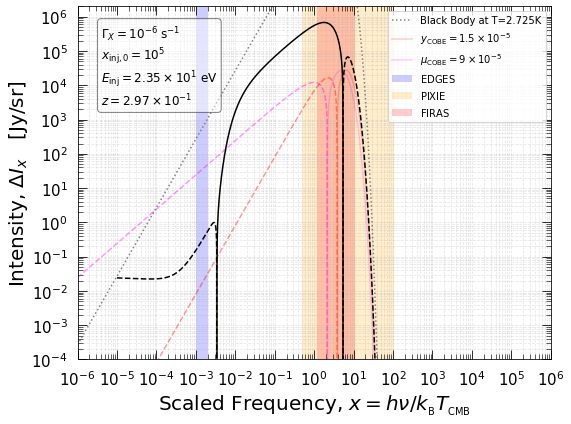

In [397]:
for ig in range(len(dict_results['Gamma_X'])):
    #if ig==0:
    #    continue
    for ix in range(len(dict_results['results_at_xdec'][ig])):
        gamma = dict_results['Gamma_X'][ig]
        str_gamma = str("%.3e"%gamma)
        print(str_gamma)
        xdec = dict_results['results_at_xdec'][ig][ix]['xdec']
        str_xdec = "%.3e"%xdec
        print(str_xdec)
        solz_z_dict = dict_results['results_at_xdec'][ig][ix]


        B_nu = np.vectorize(sd.B_nu_of_T)
        i = 0
        #i = 46
        #for gamma_asked in sd_lib_extended_run.Gamma_values:
        nx = len(solz_z_dict['z_current'])
        x = []
        y = []
        xinj = []
        fdm_values = []
        #z_asked = np.logspace(-2,5,1e3)
        for k in range(nx):
            xinj.append(solz_z_dict['z_current'][k])
            #S_xe_history = pi.GetXeHistory(gamma_asked,xinj,z_asked,sd_lib_extended_run)
            x.append(solz_z_dict['x'][k])
            y.append(solz_z_dict['DI'][k]-solz_z_dict['DI_no_inj'][k])
            #y.append(solz_z_dict_no_inj['DI'][k])
            #y.append(solz_z_dict['DI'][k])#-solz_z_dict_no_inj['DI'][k])

            #fdm_values.append(sd_lib_extended_run.finj_2d[i][k][0]/1.3098e4*sd_lib_extended_run.x_inj_values[k])
        #print(gamma_asked)

        #z_no_inj = sd_lib_extended_run.DXe_Xe_redshifts_2d[0][0]
        #Xe_no_inj = sd_lib_extended_run.Xe_no_inj_2d[0][0]

        #xinj = np.logspace(-8,7,nx)
        x_min = 1.e-6
        x_max = 1.e6
        #raise

        fig, ax1 = plt.subplots(1,1,figsize=(8,6))
        label_size = 15
        title_size = 20
        legend_size = 25
        handle_length = 1.5

        ymin = 1.e-4
        ymax = 2e6


        linesp = []
        patches = []


        i_ax = 0
        firas = sd.firas()


        for ax in [ax1]:
            ax.set_xlim(x_min,x_max)
            ax.set_ylim(ymin,ymax)
            ax.set_xscale('log')
            ax.set_yscale('log')


            #ax.set_xlabel("scaled injection frequency, "+ r'$x_\mathrm{inj}=h\nu_\mathrm{inj}/k_{_\mathrm{B}}T_{\gamma}$',size=title_size)
            ax.set_xlabel(label_scaled_frequency,size=title_size)
            ax.set_ylabel(label_intensity,size=title_size)
            ax.yaxis.set_label_coords(-.1,0.5)

            # ticks_array = np.logspace(-6,6,13)
            # ax.set_xticks(ticks_array)

            # ticks_array = np.logspace(-8,2,11)
            # ax.set_yticks(ticks_array)


            ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
            ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

            plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
            plt.setp(ax.get_xticklabels(), fontsize=label_size)

            ax.xaxis.set_ticks_position('both')
            ax.yaxis.set_ticks_position('both')
            #ax.plot(z_no_inj,Xe_no_inj,c='r')


            ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
            ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
            ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')

            x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)

            bnu = B_nu(x_asked*sd.kb*pi.firas_T0_bf/sd.hplanck,pi.firas_T0_bf)*1e6
            ax.plot(x_asked,bnu,c='grey',ls=':',label='Black Body at T=2.725K')

            Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
            ax.plot(x_asked,Y,c='r',alpha = 0.2,label = label_y_firas)
            ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

            MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
            ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.2,label=label_mu_firas)
            ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)

            ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
            ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
            for label in ax.yaxis.get_ticklabels()[::2]:
                label.set_visible(True) #(3)

            ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
            ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
            ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
            ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

            # manipulate x-axis ticks and labels
            ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
            ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
            for label in ax.xaxis.get_ticklabels()[::2]:
                label.set_visible(True) #(3)

            case_type = 'bare'
            case_color ='green'
            #ax.text(0.85, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
            #  bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

            ax.grid( b=True, which="both", alpha=0.3, linestyle='--')    
            ax.legend(loc=1)

            #plt.grid( b=True, which="both", alpha=0.3, linestyle='--')

            i_ax = i_ax + 1


        linesp1 = [ax1.plot([], [],c='k',ls='-')[0] for _ in range(1)]
        linesm1 = [ax1.plot([], [],c='k',ls='--')[0] for _ in range(1)]
        text_gamma =  [ax.text(0.05, 0.15, r'$z= %.4e$'%1, transform=ax.transAxes, fontsize=14, verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))]
        patches1 = linesp1 +linesm1 + text_gamma 


        patches = patches1




        def init():

            for line in linesp1:
                line.set_data([], [])

            return patches

        def animate(i):
            for j,line in enumerate(linesp1):
                if j==0:
                    line.set_data(x[i],y[i])
            for j,line in enumerate(linesm1):
                if j==0:
                    line.set_data(x[i],-y[i])
                text_gamma[j].remove()
                #einj = xinj_to_Einj*xinj[i]
                einj = xinj_to_Einj*xdec
                text_gamma_str1 = r'$z=$' + scientific_notation(xinj[i])
                text_gamma_str2 = r'$E_\mathrm{inj}=$'+ scientific_notation(einj)+' '+r'$\mathrm{eV}$'
                text_gamma_str3 = r'$x_\mathrm{inj,0}=$'+ scientific_notation(xdec)
                text_gamma_str4 = r'$\Gamma_X=$'+ scientific_notation(gamma)+' '+r'$\mathrm{s}^{-1}$'
                #text_gamma_str3 = r'$f_\mathrm{dm}= %.4e$'%fdm_values[i]
                text_gamma_str = '\n'.join((text_gamma_str4,
                                            text_gamma_str3,
                                            text_gamma_str2,
                                            text_gamma_str1))

                text_gamma[j] = ax.text(0.05, 0.95, text_gamma_str , transform=ax.transAxes, fontsize=12, verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

            return patches


        fig.tight_layout()




        anim = animation.FuncAnimation(fig, animate, init_func=init,
                                       frames=len(y), interval=800, blit=True)

        anim.save(path_to_figures + '/Dn_at_z_movie_Drho_rho_3e-5_xinj_'+str_xdec+'_gamma_'+str_gamma+'_no_lyc.mp4', fps=3, extra_args=['-vcodec', 'libx264'],dpi=100)
        #plt.show()
        i+=1

# do the runs

In [105]:
param_name = 'photon injection x_dec'
xi_array = [1e-6,1e-3,1e0,1e3,1e6]
Gamma_values = [1e-17,5e-16,5e-14,1e-11,1e-8]

In [45]:
import specdist as sd
import numpy as np

photon_injection_case = 'redshift_dependence'
compute_hubble_dist = 'yes'

finj_from_fisher = 'no'
add_edges = 'yes'


if compute_hubble_dist == 'yes':
    Drho_rho = 1e-100
    photon_injection_case += '_no_injection'
else:
    Drho_rho = 3e-5


# load photon injection and cosmotherm modules
ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()


if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':
    firas = sd.firas()
    edges = sd.edges()
    a_dict = {}
    a_dict['firas'] = firas
    a_dict['edges'] = edges
    a_dict['add_edges'] = 'yes'
    sd_lib_for_fisher = sd.specdist_ct_spectra_lib()
    sd.load_ct_spectra_lib("xe_history_200720",sd_lib_for_fisher)




# set relevant parameter values
ct.ct_Drho_rho_dec = Drho_rho
# ct.ct_h = 0.70
# ct.ct_Omega_b = 0.0457
# ct.ct_Omega_m = 0.30
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 2e7
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422

ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 1
ct.ct_pi_stim = 0
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1

ct.ct_include_collisions = 0
ct.pi_use_zstart_from_total_energy_fraction = 'no'

sd.set_dm_params_to_CT_pi_params(X_dm,ct)
sd.set_cosmo_to_CT_cosmo_params(cosmo,ct)

#xi_array = np.logspace(np.log10(1e4),np.log10(5e8),4)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1e7),20)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1.e7),64)
#einj = 10

#xi_array = [einj/xinj_to_Einj]
#Gamma_X = 1e-6 #np.logspace(-9,-6,4)
#zi_array = [1.1e6,9.9e5]
#for Gamma_X in np.logspace(-30,-8,20):
#for Gamma_X in np.logspace(-8,-20,80):
for Gamma_X in Gamma_values:
    str_gamma = str("%.3e"%Gamma_X)

    ct.ct_Gamma_dec = Gamma_X
    #ct.ct_x_dec = 1e7
    args = {}
    p_name = param_name
    #p_name = 'zend'
    p_array = xi_array
    #p_array = zi_array
    args['param_values_array'] = p_array
    args['param_name'] = p_name
    args['save_spectra'] = 'yes'


    if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':

        # Gamma_values = [ct.ct_Gamma_dec]
        # xinj_array = [ct.ct_x_dec]
        # f_dm_fisher = sd.pi_run_fisher_constraints(Gamma_values,xinj_array,sd_lib,**a_dict)
        # print(f_dm_fisher)
        # ct.ct_Drho_rho_dec = 0.
        # ct.ct_photon_injection_f_dec = f_dm_fisher['curves'][0]['finj']
        # print('finj_fisher = %e'%ct.ct_photon_injection_f_dec)
        ct.ct_pi_finj_from_fisher = 'yes'
        ct.ct_x_dec =  1e-6
        args['dict_for_fisher'] = a_dict
        args['sd_lib_for_fisher'] = sd_lib_for_fisher
    else:
        args['dict_for_fisher'] = {}
        args['sd_lib_for_fisher'] = None
        ct.ct_photon_injection_f_dec = 0.
        print('not using finj, using Drho_rho instead.')




    ct.save_dir_name = photon_injection_case + '_G_' + str_gamma

    R = ct.run_cosmotherm_parallel(**args)
#print(R)



not using finj, using Drho_rho instead.
not using finj, using Drho_rho instead.
not using finj, using Drho_rho instead.
not using finj, using Drho_rho instead.
not using finj, using Drho_rho instead.


## load the files

In [36]:


#path_to_files += '/sol.'
#path_to_files += step_id 000000
#path_to_files += '.cooling.photon_inj.PDE_ODE.tmp.dat'

In [106]:
import glob, os
dict_results = {}
dict_results['Gamma_X'] = []
dict_results['results_at_xdec'] = []
for Gamma_X in Gamma_values:
    dict_results['Gamma_X'].append(Gamma_X)
    str_gamma = str("%.3e"%Gamma_X)
    results_at_gamma =[]
    
    for (xdec,i) in zip(xi_array,range(len(xi_array))):
        path_to_files = '/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_G_'+str_gamma+'/tmp_'
        path_to_files_no_inj = '/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_'+str_gamma+'/tmp_'


        path_to_files += str(i)+'/Solutions_at_z/'
        path_to_files_no_inj += str(i)+'/Solutions_at_z/'
        
        os.chdir(path_to_files)
        file_names = []
        step_id = []
        solz_z_dict={}

        for file in glob.glob("*.dat"):
            parts=file.split('.')
            step_id.append(int(parts[1]))
            file_names.append(file)

        LS = zip(step_id,file_names)
        LS = sorted(LS,key=lambda pair:pair[0])
        step_id,file_names = zip(*LS)

        solz_z_dict['filenames'] = file_names
        solz_z_dict['step_id'] =step_id

        x = []
        DI = []
        z_current = []
        for fn in solz_z_dict['filenames']:
            DN = np.loadtxt(path_to_files+'/'+fn)
            x.append(DN[:,0])
            DI.append(DN[:,5])
            with open(path_to_files+'/'+fn) as f:
                for line in f:
                    if not line.startswith("#"):
                        break
                    else:
                        if "z=" in line:
                            ls = line.split(' ')
                            z_current.append(float(ls[-1]))
                            #print(line)


        solz_z_dict['z_current'] = z_current
        solz_z_dict['x'] = x
        solz_z_dict['DI'] = DI

        print(path_to_files_no_inj)
        os.chdir(path_to_files_no_inj)
        file_names = []
        step_id = []
        solz_z_dict_no_inj={}

        for file in glob.glob("*.dat"):
            parts=file.split('.')
            step_id.append(int(parts[1]))
            file_names.append(file)

        LS = zip(step_id,file_names)
        LS = sorted(LS,key=lambda pair:pair[0])
        step_id,file_names = zip(*LS)

        solz_z_dict_no_inj['filenames'] = file_names
        solz_z_dict_no_inj['step_id'] =step_id

        x = []
        DI = []
        z_current = []
        for fn in solz_z_dict_no_inj['filenames']:
            DN = np.loadtxt(path_to_files_no_inj+'/'+fn)
            x.append(DN[:,0])
            DI.append(DN[:,5])
            with open(path_to_files_no_inj+'/'+fn) as f:
                for line in f:
                    if not line.startswith("#"):
                        break
                    else:
                        if "z=" in line:
                            ls = line.split(' ')
                            z_current.append(float(ls[-1]))
                            #print(line)


        solz_z_dict_no_inj['z_current'] = z_current
        solz_z_dict_no_inj['x'] = x
        solz_z_dict_no_inj['DI'] = DI
        
        results_at_xdec={}
        results_at_xdec['z_current'] =  z_current
        results_at_xdec['xdec'] = xdec
        results_at_xdec['x'] = x
        results_at_xdec['DI'] = solz_z_dict['DI']
        results_at_xdec['DI_no_inj'] = solz_z_dict_no_inj['DI']
        
        results_at_gamma.append(results_at_xdec)
    dict_results['results_at_xdec'].append(results_at_gamma)
        

/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_1.000e-17/tmp_0/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_1.000e-17/tmp_1/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_1.000e-17/tmp_2/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_1.000e-17/tmp_3/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_1.000e-17/tmp_4/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_5.000e-16/tmp_0/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_corr/runfiles/redshift_dependence_no_injection_G_5.000e-16/tmp_1/Solutions_at_z/
/Users/boris/Work/SPECTRAL-DISTORTIONS/cosmotherm.rel_c

5.000e-16
1.000e-06
5.000e-16
1.000e-03
5.000e-16
1.000e+00
5.000e-16
1.000e+03
5.000e-16
1.000e+06
5.000e-14
1.000e-06
5.000e-14
1.000e-03
5.000e-14
1.000e+00
5.000e-14
1.000e+03
5.000e-14
1.000e+06
1.000e-11
1.000e-06
1.000e-11
1.000e-03
1.000e-11
1.000e+00
1.000e-11
1.000e+03
1.000e-11
1.000e+06
1.000e-08
1.000e-06
1.000e-08
1.000e-03
1.000e-08
1.000e+00
1.000e-08
1.000e+03
1.000e-08
1.000e+06


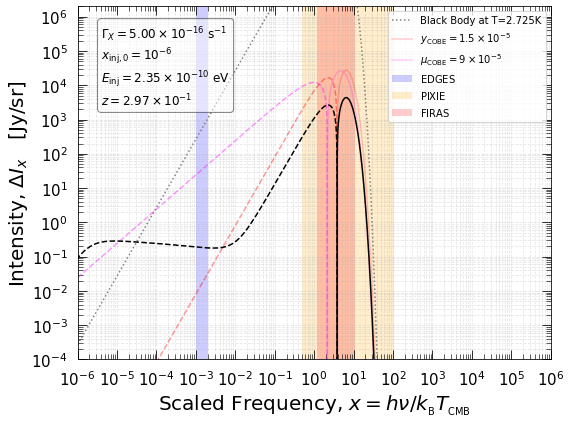

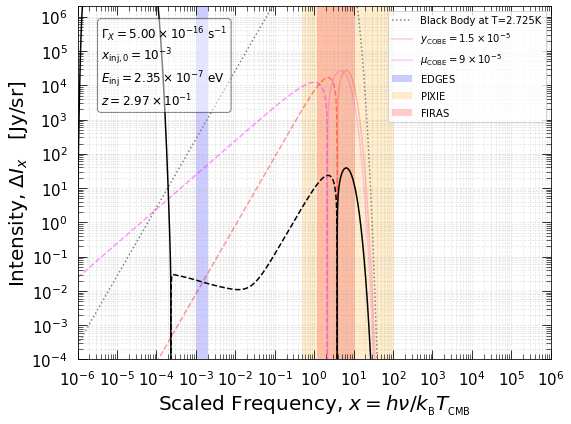

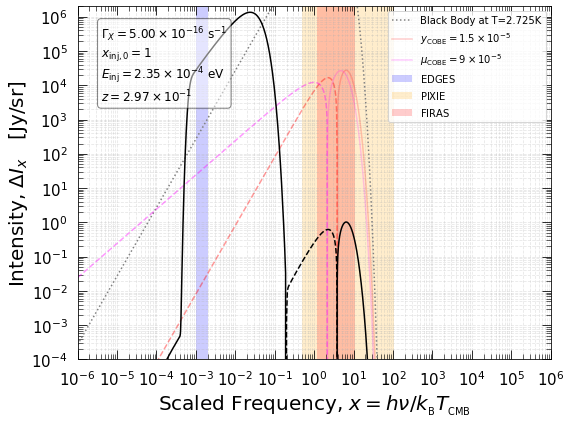

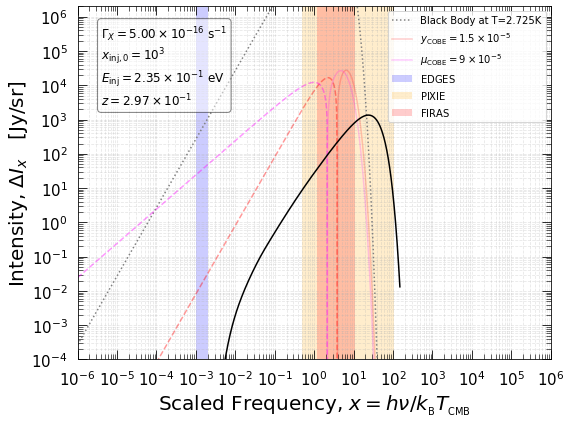

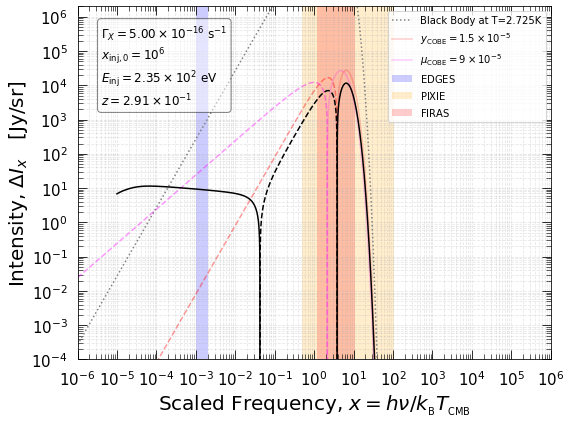

...

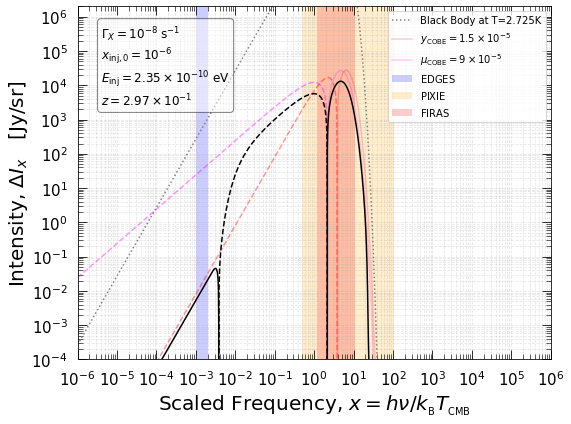

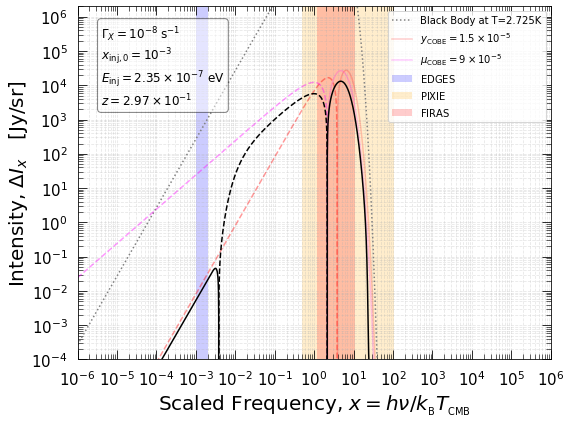

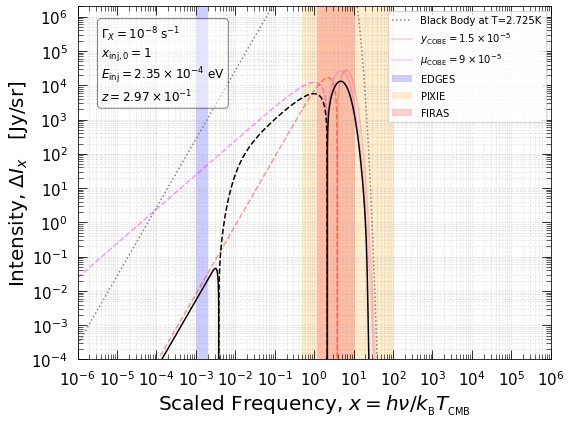

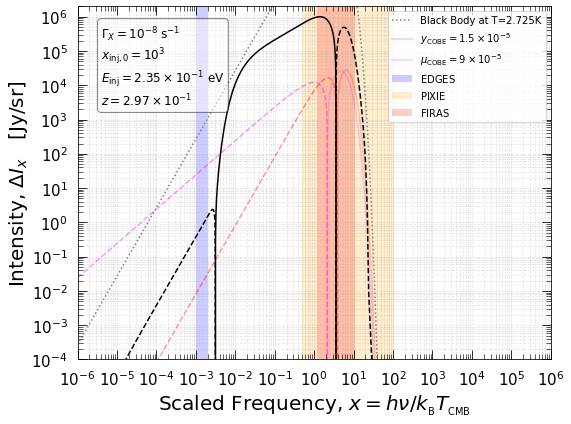

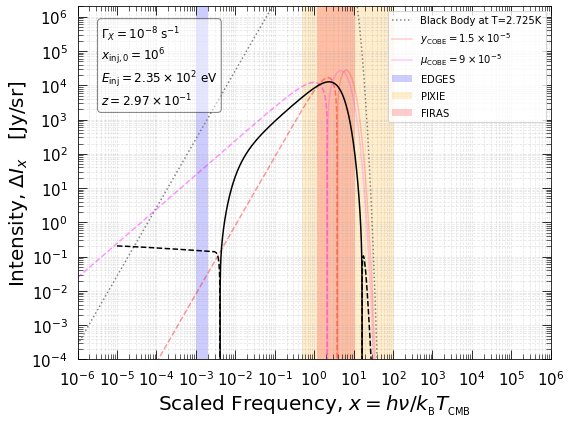

In [108]:
for ig in range(len(dict_results['Gamma_X'])):
    if ig==0:
        continue
    for ix in range(len(dict_results['results_at_xdec'][ig])):
        gamma = dict_results['Gamma_X'][ig]
        str_gamma = str("%.3e"%gamma)
        print(str_gamma)
        xdec = dict_results['results_at_xdec'][ig][ix]['xdec']
        str_xdec = "%.3e"%xdec
        print(str_xdec)
        solz_z_dict = dict_results['results_at_xdec'][ig][ix]


        B_nu = np.vectorize(sd.B_nu_of_T)
        i = 0
        #i = 46
        #for gamma_asked in sd_lib_extended_run.Gamma_values:
        nx = len(solz_z_dict['z_current'])
        x = []
        y = []
        xinj = []
        fdm_values = []
        #z_asked = np.logspace(-2,5,1e3)
        for k in range(nx):
            xinj.append(solz_z_dict['z_current'][k])
            #S_xe_history = pi.GetXeHistory(gamma_asked,xinj,z_asked,sd_lib_extended_run)
            x.append(solz_z_dict['x'][k])
            y.append(solz_z_dict['DI'][k]-solz_z_dict['DI_no_inj'][k])
            #y.append(solz_z_dict_no_inj['DI'][k])
            #y.append(solz_z_dict['DI'][k])#-solz_z_dict_no_inj['DI'][k])

            #fdm_values.append(sd_lib_extended_run.finj_2d[i][k][0]/1.3098e4*sd_lib_extended_run.x_inj_values[k])
        #print(gamma_asked)

        #z_no_inj = sd_lib_extended_run.DXe_Xe_redshifts_2d[0][0]
        #Xe_no_inj = sd_lib_extended_run.Xe_no_inj_2d[0][0]

        #xinj = np.logspace(-8,7,nx)
        x_min = 1.e-6
        x_max = 1.e6
        #raise

        fig, ax1 = plt.subplots(1,1,figsize=(8,6))
        label_size = 15
        title_size = 20
        legend_size = 25
        handle_length = 1.5

        ymin = 1.e-4
        ymax = 2e6


        linesp = []
        patches = []


        i_ax = 0
        firas = sd.firas()


        for ax in [ax1]:
            ax.set_xlim(x_min,x_max)
            ax.set_ylim(ymin,ymax)
            ax.set_xscale('log')
            ax.set_yscale('log')


            #ax.set_xlabel("scaled injection frequency, "+ r'$x_\mathrm{inj}=h\nu_\mathrm{inj}/k_{_\mathrm{B}}T_{\gamma}$',size=title_size)
            ax.set_xlabel(label_scaled_frequency,size=title_size)
            ax.set_ylabel(label_intensity,size=title_size)
            ax.yaxis.set_label_coords(-.1,0.5)

            # ticks_array = np.logspace(-6,6,13)
            # ax.set_xticks(ticks_array)

            # ticks_array = np.logspace(-8,2,11)
            # ax.set_yticks(ticks_array)


            ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
            ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

            plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
            plt.setp(ax.get_xticklabels(), fontsize=label_size)

            ax.xaxis.set_ticks_position('both')
            ax.yaxis.set_ticks_position('both')
            #ax.plot(z_no_inj,Xe_no_inj,c='r')


            ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
            ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
            ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')

            x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)

            bnu = B_nu(x_asked*sd.kb*pi.firas_T0_bf/sd.hplanck,pi.firas_T0_bf)*1e6
            ax.plot(x_asked,bnu,c='grey',ls=':',label='Black Body at T=2.725K')

            Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
            ax.plot(x_asked,Y,c='r',alpha = 0.2,label = label_y_firas)
            ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

            MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
            ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.2,label=label_mu_firas)
            ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)

            ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
            ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
            for label in ax.yaxis.get_ticklabels()[::2]:
                label.set_visible(True) #(3)

            ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
            ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
            ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
            ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

            # manipulate x-axis ticks and labels
            ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
            ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
            for label in ax.xaxis.get_ticklabels()[::2]:
                label.set_visible(True) #(3)

            case_type = 'bare'
            case_color ='green'
            #ax.text(0.85, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
            #  bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

            ax.grid( b=True, which="both", alpha=0.3, linestyle='--')    
            ax.legend(loc=1)

            #plt.grid( b=True, which="both", alpha=0.3, linestyle='--')

            i_ax = i_ax + 1


        linesp1 = [ax1.plot([], [],c='k',ls='-')[0] for _ in range(1)]
        linesm1 = [ax1.plot([], [],c='k',ls='--')[0] for _ in range(1)]
        text_gamma =  [ax.text(0.05, 0.15, r'$z= %.4e$'%1, transform=ax.transAxes, fontsize=14, verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))]
        patches1 = linesp1 +linesm1 + text_gamma 


        patches = patches1




        def init():

            for line in linesp1:
                line.set_data([], [])

            return patches

        def animate(i):
            for j,line in enumerate(linesp1):
                if j==0:
                    line.set_data(x[i],y[i])
            for j,line in enumerate(linesm1):
                if j==0:
                    line.set_data(x[i],-y[i])
                text_gamma[j].remove()
                #einj = xinj_to_Einj*xinj[i]
                einj = xinj_to_Einj*xdec
                text_gamma_str1 = r'$z=$' + scientific_notation(xinj[i])
                text_gamma_str2 = r'$E_\mathrm{inj}=$'+ scientific_notation(einj)+' '+r'$\mathrm{eV}$'
                text_gamma_str3 = r'$x_\mathrm{inj,0}=$'+ scientific_notation(xdec)
                text_gamma_str4 = r'$\Gamma_X=$'+ scientific_notation(gamma)+' '+r'$\mathrm{s}^{-1}$'
                #text_gamma_str3 = r'$f_\mathrm{dm}= %.4e$'%fdm_values[i]
                text_gamma_str = '\n'.join((text_gamma_str4,
                                            text_gamma_str3,
                                            text_gamma_str2,
                                            text_gamma_str1))

                text_gamma[j] = ax.text(0.05, 0.95, text_gamma_str , transform=ax.transAxes, fontsize=12, verticalalignment='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

            return patches


        fig.tight_layout()




        anim = animation.FuncAnimation(fig, animate, init_func=init,
                                       frames=len(y), interval=800, blit=True)

        anim.save(path_to_figures + '/Dn_at_z_movie_Drho_rho_3e-5_xinj_'+str_xdec+'_gamma_'+str_gamma+'.mp4', fps=3, extra_args=['-vcodec', 'libx264'],dpi=100)
        #plt.show()
        i+=1

# some tests with redshift dependence

In [19]:
param_name = 'zend'
xi_array = [1e-2,5,20,200,900,1100,4e4,1e5]

In [20]:
import specdist as sd
import numpy as np

photon_injection_case = 'redshift_dependence'
compute_hubble_dist = 'no'

finj_from_fisher = 'no'
add_edges = 'yes'


if compute_hubble_dist == 'yes':
    Drho_rho = 1e-100
    photon_injection_case += '_hubble'
else:
    Drho_rho = 3e-5


# load photon injection and cosmotherm modules
ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()


if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':
    firas = sd.firas()
    edges = sd.edges()
    a_dict = {}
    a_dict['firas'] = firas
    a_dict['edges'] = edges
    a_dict['add_edges'] = 'yes'
    sd_lib_for_fisher = sd.specdist_ct_spectra_lib()
    sd.load_ct_spectra_lib("xe_history_200720",sd_lib_for_fisher)




# set relevant parameter values
ct.ct_Drho_rho_dec = Drho_rho
# ct.ct_h = 0.70
# ct.ct_Omega_b = 0.0457
# ct.ct_Omega_m = 0.30
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 2e7
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422

ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 1
ct.ct_pi_stim = 0
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1

ct.ct_include_collisions = 0
ct.pi_use_zstart_from_total_energy_fraction = 'no'

sd.set_dm_params_to_CT_pi_params(X_dm,ct)
sd.set_cosmo_to_CT_cosmo_params(cosmo,ct)

#xi_array = np.logspace(np.log10(1e4),np.log10(5e8),4)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1e7),20)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1.e7),64)
#einj = 10

#xi_array = [einj/xinj_to_Einj]
#Gamma_X = 1e-6 #np.logspace(-9,-6,4)
#zi_array = [1.1e6,9.9e5]
#for Gamma_X in np.logspace(-30,-8,20):
#for Gamma_X in np.logspace(-8,-20,80):
for Gamma_X in [1e-14]:
    str_gamma = str("%.3e"%Gamma_X)

    ct.ct_Gamma_dec = Gamma_X
    #ct.ct_x_dec = 1e7
    args = {}
    p_name = param_name
    #p_name = 'zend'
    p_array = xi_array
    #p_array = zi_array
    args['param_values_array'] = p_array
    args['param_name'] = p_name
    args['save_spectra'] = 'yes'


    if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':

        # Gamma_values = [ct.ct_Gamma_dec]
        # xinj_array = [ct.ct_x_dec]
        # f_dm_fisher = sd.pi_run_fisher_constraints(Gamma_values,xinj_array,sd_lib,**a_dict)
        # print(f_dm_fisher)
        # ct.ct_Drho_rho_dec = 0.
        # ct.ct_photon_injection_f_dec = f_dm_fisher['curves'][0]['finj']
        # print('finj_fisher = %e'%ct.ct_photon_injection_f_dec)
        ct.ct_pi_finj_from_fisher = 'yes'
        ct.ct_x_dec =  1e-6
        args['dict_for_fisher'] = a_dict
        args['sd_lib_for_fisher'] = sd_lib_for_fisher
    else:
        args['dict_for_fisher'] = {}
        args['sd_lib_for_fisher'] = None
        ct.ct_photon_injection_f_dec = 0.
        print('not using finj, using Drho_rho instead.')




    ct.save_dir_name = photon_injection_case + '_G_' + str_gamma

    R = ct.run_cosmotherm_parallel(**args)
#print(R)


not using finj, using Drho_rho instead.


In [21]:
import specdist as sd
import numpy as np

photon_injection_case = 'redshift_dependence'
compute_hubble_dist = 'yes'

finj_from_fisher = 'no'
add_edges = 'yes'


if compute_hubble_dist == 'yes':
    Drho_rho = 1e-100
    photon_injection_case += '_hubble'
else:
    Drho_rho = 3e-5


# load photon injection and cosmotherm modules
ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()


if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':
    firas = sd.firas()
    edges = sd.edges()
    a_dict = {}
    a_dict['firas'] = firas
    a_dict['edges'] = edges
    a_dict['add_edges'] = 'yes'
    sd_lib_for_fisher = sd.specdist_ct_spectra_lib()
    sd.load_ct_spectra_lib("xe_history_200720",sd_lib_for_fisher)




# set relevant parameter values
ct.ct_Drho_rho_dec = Drho_rho
# ct.ct_h = 0.70
# ct.ct_Omega_b = 0.0457
# ct.ct_Omega_m = 0.30
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 2e7
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422

ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 1
ct.ct_pi_stim = 0
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1

ct.ct_include_collisions = 0
ct.pi_use_zstart_from_total_energy_fraction = 'no'

sd.set_dm_params_to_CT_pi_params(X_dm,ct)
sd.set_cosmo_to_CT_cosmo_params(cosmo,ct)

#xi_array = np.logspace(np.log10(1e4),np.log10(5e8),4)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1e7),20)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1.e7),64)
#einj = 10

#xi_array = [einj/xinj_to_Einj]
#Gamma_X = 1e-6 #np.logspace(-9,-6,4)
#zi_array = [1.1e6,9.9e5]
#for Gamma_X in np.logspace(-30,-8,20):
#for Gamma_X in np.logspace(-8,-20,80):
for Gamma_X in [1e-14]:
    str_gamma = str("%.3e"%Gamma_X)

    ct.ct_Gamma_dec = Gamma_X
    #ct.ct_x_dec = 1e7
    args = {}
    p_name = param_name
    #p_name = 'zend'
    p_array = xi_array
    #p_array = zi_array
    args['param_values_array'] = p_array
    args['param_name'] = p_name
    args['save_spectra'] = 'yes'


    if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':

        # Gamma_values = [ct.ct_Gamma_dec]
        # xinj_array = [ct.ct_x_dec]
        # f_dm_fisher = sd.pi_run_fisher_constraints(Gamma_values,xinj_array,sd_lib,**a_dict)
        # print(f_dm_fisher)
        # ct.ct_Drho_rho_dec = 0.
        # ct.ct_photon_injection_f_dec = f_dm_fisher['curves'][0]['finj']
        # print('finj_fisher = %e'%ct.ct_photon_injection_f_dec)
        ct.ct_pi_finj_from_fisher = 'yes'
        ct.ct_x_dec =  1e-6
        args['dict_for_fisher'] = a_dict
        args['sd_lib_for_fisher'] = sd_lib_for_fisher
    else:
        args['dict_for_fisher'] = {}
        args['sd_lib_for_fisher'] = None
        ct.ct_photon_injection_f_dec = 0.
        print('not using finj, using Drho_rho instead.')




    ct.save_dir_name = photon_injection_case + '_G_' + str_gamma

    R_hubble = ct.run_cosmotherm_parallel(**args)
#print(R)


not using finj, using Drho_rho instead.


In [48]:
#R_hubble = R

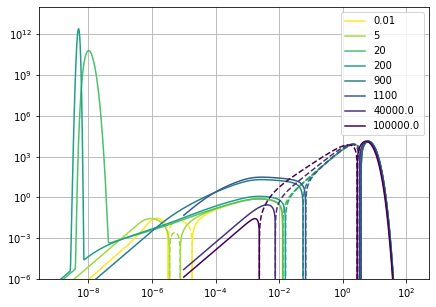

In [32]:
fig,ax = plt.subplots(1,1, figsize=(7,5))
color=iter(cm.viridis(np.linspace(1.,0.,len(R))))
for i in range(len(R)):
    col = next(color)
    ax.plot(R[i]['x'],(R[i]['DI']-R_hubble[i]['DI']),c=col,label=xi_array[i])
    ax.plot(R[i]['x'],-(R[i]['DI']-R_hubble[i]['DI']),c=col,ls='--')
    #ax.plot(R_hubble[i]['x'],abs(R_hubble[i]['DI']),c=col,ls='--')
plt.loglog()
plt.ylim(1e-6,1e14)
plt.grid(which='both')
plt.legend()
plt.savefig(path_to_figures+'reshift_dependence.pdf')

# some problematic case

42571.30693912303

In [17]:
import specdist as sd
import numpy as np

photon_injection_case = 'test_high_xinj'
compute_hubble_dist = 'no'

finj_from_fisher = 'no'
add_edges = 'yes'


if compute_hubble_dist == 'yes':
    Drho_rho = 1e-100
    photon_injection_case += '_hubble'
else:
    Drho_rho = 3e-5


# load photon injection and cosmotherm modules
ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()


if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':
    firas = sd.firas()
    edges = sd.edges()
    a_dict = {}
    a_dict['firas'] = firas
    a_dict['edges'] = edges
    a_dict['add_edges'] = 'yes'
    sd_lib_for_fisher = sd.specdist_ct_spectra_lib()
    sd.load_ct_spectra_lib("xe_history_200720",sd_lib_for_fisher)




# set relevant parameter values
ct.ct_Drho_rho_dec = Drho_rho
# ct.ct_h = 0.70
# ct.ct_Omega_b = 0.0457
# ct.ct_Omega_m = 0.30
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 2e7
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422

ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 1
ct.ct_pi_stim = 0
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1

ct.ct_include_collisions = 0
ct.pi_use_zstart_from_total_energy_fraction = 'no'

sd.set_dm_params_to_CT_pi_params(X_dm,ct)
sd.set_cosmo_to_CT_cosmo_params(cosmo,ct)

#xi_array = np.logspace(np.log10(1e4),np.log10(5e8),4)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1e7),20)
#xi_array = np.logspace(np.log10(1e-8),np.log10(1.e7),64)
#einj = 10
xi_array = [5e8]
#xi_array = [einj/xinj_to_Einj]
#Gamma_X = 1e-6 #np.logspace(-9,-6,4)
#zi_array = [1.1e6,9.9e5]
#for Gamma_X in np.logspace(-30,-8,20):
#for Gamma_X in np.logspace(-8,-20,80):
for Gamma_X in [1e-14]:
    str_gamma = str("%.3e"%Gamma_X)

    ct.ct_Gamma_dec = Gamma_X
    #ct.ct_x_dec = 1e7
    args = {}
    p_name = 'photon injection x_dec'
    #p_name = 'zend'
    p_array = xi_array
    #p_array = zi_array
    args['param_values_array'] = p_array
    args['param_name'] = p_name
    args['save_spectra'] = 'yes'


    if finj_from_fisher == 'yes' and compute_hubble_dist != 'yes':

        # Gamma_values = [ct.ct_Gamma_dec]
        # xinj_array = [ct.ct_x_dec]
        # f_dm_fisher = sd.pi_run_fisher_constraints(Gamma_values,xinj_array,sd_lib,**a_dict)
        # print(f_dm_fisher)
        # ct.ct_Drho_rho_dec = 0.
        # ct.ct_photon_injection_f_dec = f_dm_fisher['curves'][0]['finj']
        # print('finj_fisher = %e'%ct.ct_photon_injection_f_dec)
        ct.ct_pi_finj_from_fisher = 'yes'
        args['dict_for_fisher'] = a_dict
        args['sd_lib_for_fisher'] = sd_lib_for_fisher
    else:
        args['dict_for_fisher'] = {}
        args['sd_lib_for_fisher'] = None
        ct.ct_photon_injection_f_dec = 0.
        print('not using finj, using Drho_rho instead.')




    ct.save_dir_name = photon_injection_case + '_G_' + str_gamma

    R = ct.run_cosmotherm_parallel(**args)
#print(R)


not using finj, using Drho_rho instead.


In [48]:
#R_hubble = R

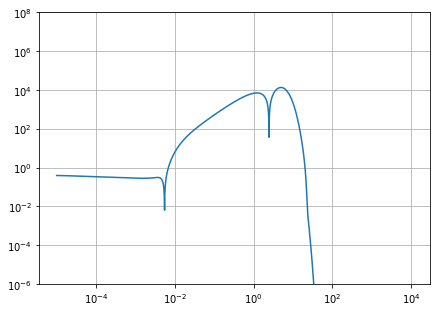

In [16]:
fig,ax = plt.subplots(1,1, figsize=(7,5))

for i in range(len(R)):
    ax.plot(R[i]['x'],abs(R[i]['DI']))
plt.loglog()
plt.ylim(1e-6,1e8)
plt.grid(which='both')

# looking for models that solve edges

In [19]:
sd_lib_extended_run = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_190820',sd_lib_extended_run)



In [28]:
edges = sd.edges()
edges.edges_nu

78000000.0

(10000000.0, 1000000000000.0)

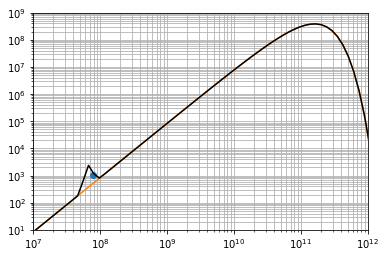

In [78]:
nu_array = np.logspace(5,13,100)
T = 2.725
B_nu = np.vectorize(sd.B_nu_of_T)

bedges=B_nu(edges.edges_nu,T)*1e6

plt.plot(edges.edges_nu,2.*bedges,marker='o')
gamma_asked = 1e-11
#nu_asked = 5e9
#xinj_asked =4257.1306
xinj_asked =4.5
#xinj_asked = sd.hplanck*nu_asked/sd.kb/T

x_asked = sd.hplanck*nu_array/sd.kb/T
sd_lib = sd_lib_extended_run

S = sd.GetSpectra(gamma_asked,xinj_asked,x_asked,sd_lib)
pispec_DI = S['DI']
pispec_nu = sd.kb*T*S['x']/sd.hplanck

bnu = B_nu(pispec_nu,T)*1e6
plt.plot(pispec_nu,bnu)
plt.plot(pispec_nu,pispec_DI*10.+bnu,c='k')
plt.loglog()
plt.grid(which='both')
plt.ylim(1e1,1e9)
plt.xlim(1e7,1e12)

In [70]:
1./xinj_to_Einj

4257.130693912303

In [22]:
def pi_compute_fdm_constraints_stim(log10_tau_a,log10_Einj_in_ev,asd_lib,*args,**kwargs):
    Einj_in_ev = 10**log10_Einj_in_ev
    tau_a = 10**log10_tau_a
    #ma_in_ev = log10_ma_in_ev
    #tau_a = log10_tau_a
    xinj = Einj_in_ev/xinj_to_Einj
    #gagg = 3.57e7*(Gamma_values)**0.5*Xinj_values**(-3./2.)
    Gamma = 1./tau_a#((gagg/3.57e7)/xinj**(-3./2.))**2.
    
    mode ='' #fisher, QS or mu
    gamma_mu = 1e-8
    if (xinj >= 10. and Gamma < 2e-20): 
        mode = 'QS'
        Gamma_QS = 2e-20
    elif (xinj < 10. and Gamma < 2e-21*xinj):
        mode = 'QS'
        Gamma_QS = 2e-21*xinj
    elif (xinj >= (gamma_mu/1e-15) and Gamma > gamma_mu):
        mode = 'mu'
    elif (xinj < (gamma_mu/1e-15) and Gamma > 1e-15*xinj):
        mode = 'mu'
    else:
        mode = 'fisher'
        #mode = 'fisher'
    
    
    
    
    # for short lifetime, we compute the constraint
    # analytically using the mu-distortion
    if mode  == 'mu':
        ct = sd.cosmotherm()
        ct.ct_T0 = 2.7255
        ct.ct_Yp = 0.245407
        ct.ct_N_eff = 3.046
        ct.ct_Omega_m = 0.312331
        ct.ct_Omega_b = 0.0491137
        ct.ct_h = 0.675422
        
        
        cosmo = sd.cosmo()
        X_dm = sd.dm_particle()
        pi.set_dm_params_to_CT_pi_params(X_dm,ct)
        pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
        
        X_dm.Gamma_inj = Gamma
        X_dm.x_0 = xinj
        #fdm_constraint = np.abs(pi.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,N_int = 5))
        fdm_constraint = np.abs(sd.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,**kwargs))
        #fdm_constraint = 0.0001
    # for long lifetime, we compute the constraint
    # by extrapolating
    elif mode == 'QS':
        #fdm_constraint = 1e50
        xi_a = [xinj]
        Gamma_values = [Gamma_QS]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,asd_lib,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']*Gamma_QS/Gamma
    # for intermerdiate cases we compute the constraints using fisher matrix
    else:
        #fdm_constraint = 1e100
        xi_a = [xinj]
        Gamma_values = [Gamma]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,asd_lib,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']
        
    return np.log10(fdm_constraint)

pi_compute_fdm_constraints_stim = np.vectorize(pi_compute_fdm_constraints_stim)




In [24]:
firas = sd.firas()
edges = sd.edges()

add_edges = 'yes'

tau_values = np.linspace(5,34,20)
#tau_values = np.linspace(5,15,30)
Einj_values =np.linspace(-10,5,20)
xlist = Einj_values
ylist = tau_values

X, Y = np.meshgrid(xlist, ylist)

a_dict = {}
a_dict['firas'] = firas
a_dict['edges'] = edges
a_dict['stim'] = 'yes'
a_dict['N_int'] = 10

if add_edges == 'yes':
    a_dict['add_edges'] = 'yes'
else:
    a_dict['add_edges'] = 'no'

#lib = sd_lib_lyc_reio
lib = sd_lib_extended_run
#lib = None


#Z = vfunc_tau_a_contours(Y,X,lib,**a_dict)
Z =  pi_compute_fdm_constraints_stim(Y,X,lib,**a_dict)

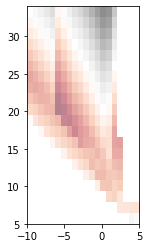

In [25]:
plt.imshow(Z, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap='RdGy', alpha=0.5)

# what is going on with stimulated decay bottom corner?

--> solved by setting correct bounds to mu analytics

In [9]:
sd_lib_extended_run_stim = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_stim_070920',sd_lib_extended_run_stim)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [10]:
def pi_compute_fdm_constraints_stim(log10_tau_a,log10_Einj_in_ev,asd_lib,*args,**kwargs):
    Einj_in_ev = 10**log10_Einj_in_ev
    tau_a = 10**log10_tau_a
    #ma_in_ev = log10_ma_in_ev
    #tau_a = log10_tau_a
    xinj = Einj_in_ev/xinj_to_Einj
    #gagg = 3.57e7*(Gamma_values)**0.5*Xinj_values**(-3./2.)
    Gamma = 1./tau_a#((gagg/3.57e7)/xinj**(-3./2.))**2.
    
    mode ='' #fisher, QS or mu
    gamma_mu = 1e-8
    if (xinj >= 10. and Gamma < 2e-20): 
        mode = 'QS'
        Gamma_QS = 2e-20
    elif (xinj < 10. and Gamma < 2e-21*xinj):
        mode = 'QS'
        Gamma_QS = 2e-21*xinj
    elif (xinj >= (gamma_mu/1e-15) and Gamma > gamma_mu):
        mode = 'mu'
    elif (xinj < (gamma_mu/1e-15) and Gamma > 1e-15*xinj):
        mode = 'mu'
    else:
        mode = 'fisher'
        #mode = 'fisher'
    
    
    
    
    # for short lifetime, we compute the constraint
    # analytically using the mu-distortion
    if mode  == 'mu':
        ct = sd.cosmotherm()
        ct.ct_T0 = 2.7255
        ct.ct_Yp = 0.245407
        ct.ct_N_eff = 3.046
        ct.ct_Omega_m = 0.312331
        ct.ct_Omega_b = 0.0491137
        ct.ct_h = 0.675422
        
        
        cosmo = sd.cosmo()
        X_dm = sd.dm_particle()
        pi.set_dm_params_to_CT_pi_params(X_dm,ct)
        pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
        
        X_dm.Gamma_inj = Gamma
        X_dm.x_0 = xinj
        #fdm_constraint = np.abs(pi.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,N_int = 5))
        fdm_constraint = np.abs(sd.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,**kwargs))
        #fdm_constraint = 0.0001
    # for long lifetime, we compute the constraint
    # by extrapolating
    elif mode == 'QS':
        #fdm_constraint = 1e50
        xi_a = [xinj]
        Gamma_values = [Gamma_QS]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,asd_lib,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']*Gamma_QS/Gamma
    # for intermerdiate cases we compute the constraints using fisher matrix
    else:
        #fdm_constraint = 1e100
        xi_a = [xinj]
        Gamma_values = [Gamma]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,asd_lib,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']
        
    return np.log10(fdm_constraint)

pi_compute_fdm_constraints_stim = np.vectorize(pi_compute_fdm_constraints_stim)




In [12]:
firas = sd.firas()
edges = sd.edges()

add_edges = 'yes'

tau_values = np.linspace(5,34,200)
#tau_values = np.linspace(5,15,30)
Einj_values =np.linspace(-10,5,200)
xlist = Einj_values
ylist = tau_values

X, Y = np.meshgrid(xlist, ylist)

a_dict = {}
a_dict['firas'] = firas
a_dict['edges'] = edges
a_dict['stim'] = 'yes'
a_dict['N_int'] = 10

if add_edges == 'yes':
    a_dict['add_edges'] = 'yes'
else:
    a_dict['add_edges'] = 'no'

#lib = sd_lib_lyc_reio
lib = sd_lib_extended_run_stim
#lib = None


#Z = vfunc_tau_a_contours(Y,X,lib,**a_dict)
Z =  pi_compute_fdm_constraints_stim(Y,X,lib,**a_dict)

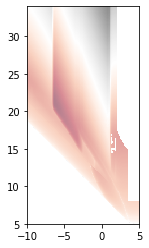

In [13]:
plt.imshow(Z, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap='RdGy', alpha=0.5)

In [14]:
# save the results

case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
     name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_stim_070920'
#name_ext += '_test'
np.shape(Z)
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'

    
np.savetxt(path, Z, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'


np.savetxt(path, X, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'


np.savetxt(path, Y, delimiter='\t', fmt='%.4e')





In [15]:
# load the results
case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_stim_070920'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

In [16]:
# load the non-thermal distorsion

NT = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/E_gamma_nt.dat')
z_nt = NT[:,1]
E_nt = NT[:,0]

# f_nt = interp1d(z_nt,E_nt)


ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422
pi.set_dm_params_to_CT_pi_params(X_dm,ct)
pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)

G_nt = []
for zx in z_nt:
    G_nt.append(pi.find_Gamma_inj_for_injection_redshift_zX(zx,cosmo,ct))
G_nt = np.asarray(G_nt)

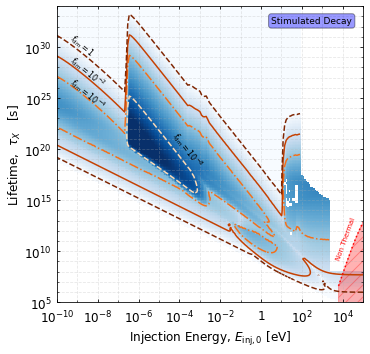

In [18]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [-8,-4,-2,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-','--'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')



ax.set_xlim(Einj_values[0],Einj_values[-1])
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(tau_values[0],tau_values[-1])

ax.set_xlabel(label_injection_energy,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[-10,5,tau_values[0],tau_values[-1]], origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(-9.5, 31.5, r'$f_\mathrm{dm}=1$' , rotation = -40,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 29.5, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -40,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 27.3, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -40,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(-4.5, 22, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -52,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
        transform=ax.transAxes, fontsize=7, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='r')

ax.patch.set_color('white') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])

        
ax.text(0.5, 33, 'Stimulated Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='blue', alpha=0.4))



fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_tau_a_final_stim' + name_ext)

# final final versions of the figures with  distortions

In [3]:
sd_lib_raw_lyc_reio = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('raw_lyc_reio',sd_lib_raw_lyc_reio)

sd_lib_bare = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('bare',sd_lib_bare)


sd_lib_lyc = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('lyc',sd_lib_lyc)

sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)




[[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd397c62780>


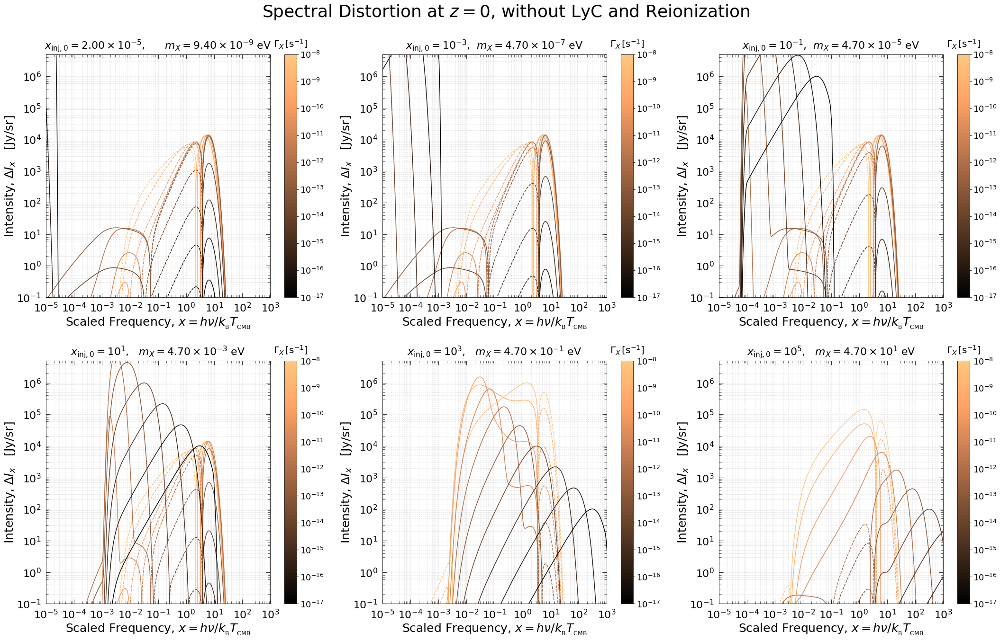

In [58]:
firas = sd.firas()
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)

xinj_asked_array = [2.e-5,1e-3,1e-1,1e1,1e3,1e5]

# x_min = 1.e-6
# x_max = 1.5e4
# ymin = 1.e-18
# ymax = 1.5e-3
x_min = 1.e-5
x_max = 1.e3
ymin = 1.e-1
ymax = 5e-6*1e6*1e6

ngamma = 10


fig, ax_array = plt.subplots(2,3,figsize=(30,20))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5
viridis =  cm.get_cmap('copper')#(np.linspace(0.,0.5,ngamma))
my_cmap = viridis#(np.linspace(0.,0.5,ngamma))
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax) in zip(xinj_asked_array,ax_array.reshape(-1)):



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')


    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.13,0.5)
    
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)





#     ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
#     ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

#     plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
#     plt.setp(ax.get_xticklabels(), fontsize=label_size)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
#     majors = [0, 1, 5]
# #     majors = [0, 1, 5]
#    ax.xaxis.set_major_locator(ticker.FixedLocator(majors))
#     for label in ax.xaxis.get_ticklabels()[::2]:
#         label.set_visible(False) #(3)


#     ax.xaxis.set_ticks_position('both')
#     ax.yaxis.set_ticks_position('both')

#     ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     locmin = matplotlib.ticker.LogLocator(base=10.0, subs=np.arange(2, 10) ,
#                                           numticks=12)
#     ax.xaxis.set_minor_locator(locmin)
#     ax.yaxis.set_minor_locator(locmin)
#     ax.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
#     ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

    #ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    #ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    #ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    #ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    color=iter(cm.copper(np.linspace(1.,0.,ngamma)))

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    str_m_dec_in_ev =  str("%.3e"%m_dec_in_ev)
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'

    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib_bare)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    #ax.text(0.05, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #      bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    
    #Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,Y,c='r',alpha = 0.2,label = label_y_firas)
    #ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    #MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.2,label=label_mu_firas)
    #ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)

        
    if xinj_asked==1e3:
        lloc = 3
    else:
        lloc =1
    #legend1 = ax.legend(loc=lloc,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)

    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)

    case_type = 'bare'
    case_color ='green'
    #ax.text(0.85, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #  bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = ',\t'.join((text_gamma_str1,text_mdec))  


    ax.set_title(text_gamma_str,size=22,pad=12)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
plt.suptitle('Spectral Distortion at $z=0$, without LyC and Reionization',size=36)
#plt.subplots_adjust(top=0.85)

fig.tight_layout(pad=3.0,rect=[0, 0.03, 1, 0.95])
str_x = str("%.3e"%xinj_ct_for_plot)

plt.savefig(path_to_figures + '/spectra_for_paper_xinj_bare_final_version.pdf')
plt.show()
plt.close(fig)





In [18]:
scientific_notation(xinj_asked)

'$2.00 \\times 10^{-5}$'

[[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd3af95c4e0>


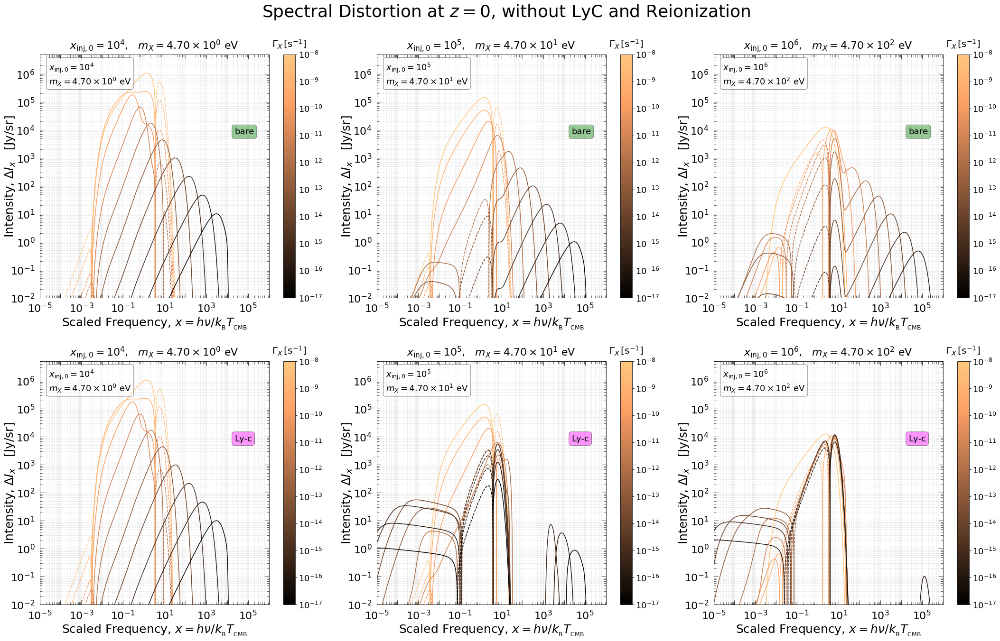

In [51]:
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)
xinj_to_mass = 4.698e-4 #in ev
xinj_asked_array = [1.e4,1e5,1e6,1.e4,1e5,1e6]

x_min = 1.e-5
x_max = 1.e6
ymin = 1.e-14*1e12
ymax = 5e-6*1e12

ngamma = 10


fig, ax_array = plt.subplots(2,3,figsize=(30,20))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5

my_cmap =  cm.get_cmap('copper')
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax,iax) in zip(xinj_asked_array,ax_array.reshape(-1),np.arange(6)):
    if iax in (0,1,2):
        sd_lib = sd_lib_bare
        color=iter(cm.copper(np.linspace(1,0,ngamma)))
        case_type = 'bare'
        case_color ='green'
    else:
        sd_lib = sd_lib_lyc
        color=iter(cm.copper(np.linspace(1,0,ngamma)))
        case_type = 'Ly-c'
        case_color ='magenta'
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')

    
    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.1,0.5)


        
    #ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    #ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    #ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'
    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()
    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    ax.text(0.04, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    
    ax.text(0.85, 0.7, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

    
    #Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,Y,c='r',alpha = 0.4,label = label_y_firas)
    #ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    #MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.4,label=label_mu_firas)
    #ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)
    
    #legend1 = ax.legend(loc=1,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(False) #(3)
    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')

#fig.tight_layout(pad=3.0)
#str_x = str("%.3e"%xinj_ct_for_plot)

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = ',\t'.join((text_gamma_str1,text_mdec))


    ax.set_title(text_gamma_str,size=22,pad=12)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
plt.suptitle('Spectral Distortion at $z=0$, without LyC and Reionization',size=36)
#plt.subplots_adjust(top=0.85)

fig.tight_layout(pad=3.0,rect=[0, 0.03, 1, 0.95])


plt.savefig(path_to_figures + '/spectra_for_paper_xinj_bare_vs_lyc_final_version.pdf')
plt.show()
plt.close(fig)

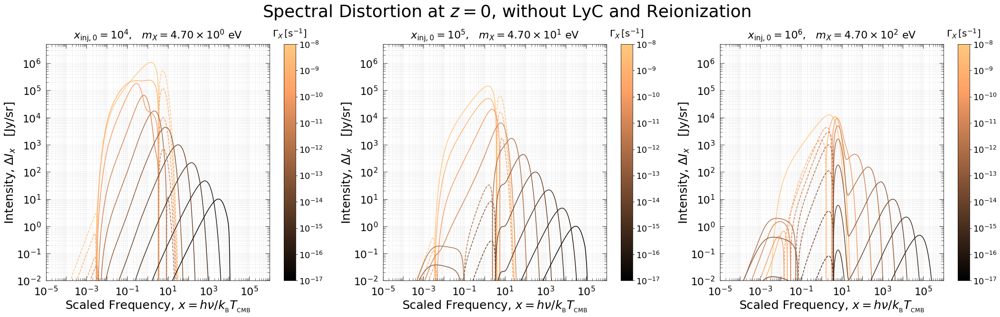

In [57]:
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)
xinj_to_mass = 4.698e-4 #in ev
xinj_asked_array = [1.e4,1e5,1e6,1.e4,1e5,1e6]

x_min = 1.e-5
x_max = 1.e6
ymin = 1.e-14*1e12
ymax = 5e-6*1e12

ngamma = 10


fig, ax_array = plt.subplots(1,3,figsize=(30,10))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5

my_cmap =  cm.get_cmap('copper')
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax,iax) in zip(xinj_asked_array,ax_array.reshape(-1),np.arange(6)):
    if iax in (0,1,2):
        sd_lib = sd_lib_bare
        color=iter(cm.copper(np.linspace(1,0,ngamma)))
        case_type = 'bare'
        case_color ='green'
    else:
        sd_lib = sd_lib_lyc
        color=iter(cm.copper(np.linspace(1,0,ngamma)))
        case_type = 'Ly-c'
        case_color ='magenta'
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')

    
    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.13,0.5)


        
    #ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    #ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    #ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'
    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()
    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    #ax.text(0.04, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    
    #ax.text(0.85, 0.7, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #      bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

    
    #Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,Y,c='r',alpha = 0.4,label = label_y_firas)
    #ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    #MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.4,label=label_mu_firas)
    #ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)
    
    #legend1 = ax.legend(loc=1,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(False) #(3)
    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')

#fig.tight_layout(pad=3.0)
#str_x = str("%.3e"%xinj_ct_for_plot)

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = ',\t'.join((text_gamma_str1,text_mdec))


    ax.set_title(text_gamma_str,size=22,pad=12)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
plt.suptitle('Spectral Distortion at $z=0$, without LyC and Reionization',size=36)
#plt.subplots_adjust(top=0.85)

fig.tight_layout(pad=3.0,rect=[0, 0.03, 1, 0.95])


plt.savefig(path_to_figures + '/spectra_for_paper_xinj_bare_vs_lyc_final_version_a.pdf')
plt.show()
plt.close(fig)

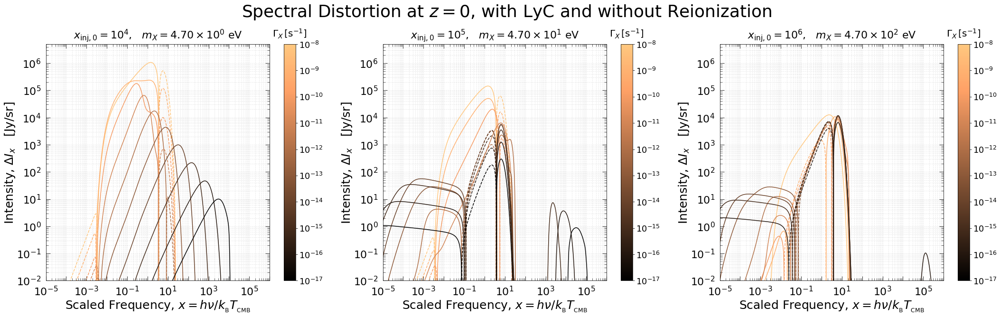

In [56]:
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)
xinj_to_mass = 4.698e-4 #in ev
xinj_asked_array = [1.e4,1e5,1e6,1.e4,1e5,1e6]

x_min = 1.e-5
x_max = 1.e6
ymin = 1.e-14*1e12
ymax = 5e-6*1e12

ngamma = 10


fig, ax_array = plt.subplots(1,3,figsize=(30,10))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5

my_cmap =  cm.get_cmap('copper')
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax,iax) in zip(xinj_asked_array,ax_array.reshape(-1),np.arange(6)):
    if iax in (0,1,2):
        sd_lib = sd_lib_lyc
        color=iter(cm.copper(np.linspace(1,0,ngamma)))
        case_type = 'bare'
        case_color ='green'
    else:
        sd_lib = sd_lib_lyc
        color=iter(cm.copper(np.linspace(1,0,ngamma)))
        case_type = 'Ly-c'
        case_color ='magenta'
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')

    
    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.13,0.5)


        
    #ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    #ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    #ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'
    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()
    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    #ax.text(0.04, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #      bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    
    #ax.text(0.85, 0.7, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #      bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

    
    #Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,Y,c='r',alpha = 0.4,label = label_y_firas)
    #ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    #MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.4,label=label_mu_firas)
    #ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)
    
    #legend1 = ax.legend(loc=1,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(False) #(3)
    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')

#fig.tight_layout(pad=3.0)
#str_x = str("%.3e"%xinj_ct_for_plot)

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = ',\t'.join((text_gamma_str1,text_mdec))


    ax.set_title(text_gamma_str,size=22,pad=12)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
plt.suptitle('Spectral Distortion at $z=0$, with LyC and without Reionization',size=36)
#plt.subplots_adjust(top=0.85)

fig.tight_layout(pad=3.0,rect=[0, 0.03, 1, 0.95])


plt.savefig(path_to_figures + '/spectra_for_paper_xinj_bare_vs_lyc_final_version_b.pdf')
plt.show()
plt.close(fig)

[[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd3acfef198>


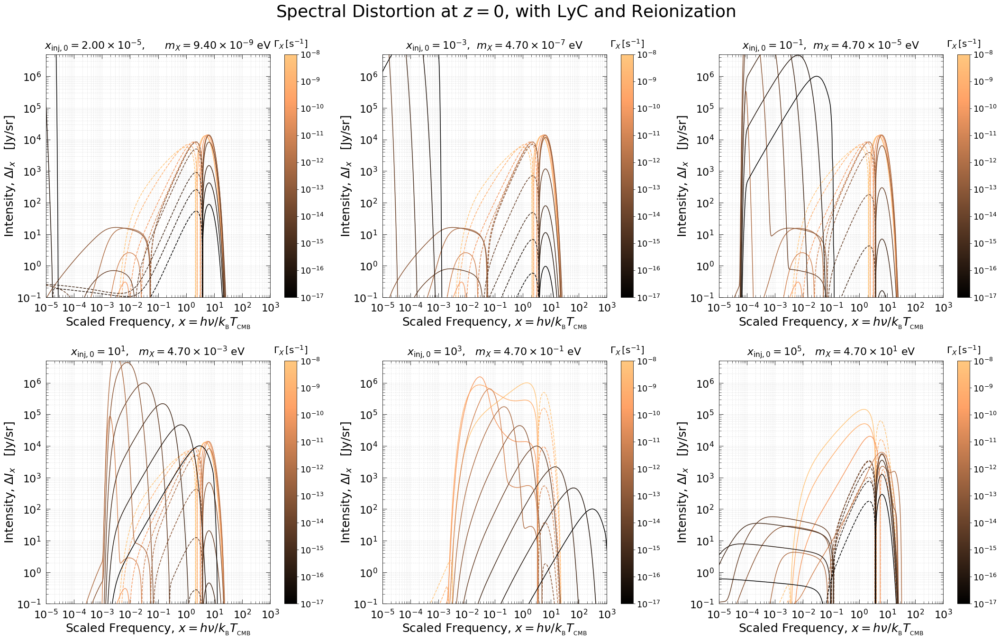

In [62]:
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)

xinj_asked_array = [2.e-5,1e-3,1e-1,1e1,1e3,1e5]

# x_min = 1.e-6
# x_max = 1.5e4
# ymin = 1.e-18
# ymax = 1.5e-3
x_min = 1.e-5
x_max = 1.e3
ymin = 1.e-1
ymax = 5e-6*1e6*1e6

ngamma = 10


fig, ax_array = plt.subplots(2,3,figsize=(30,20))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5

my_cmap =  cm.get_cmap('copper')
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax) in zip(xinj_asked_array,ax_array.reshape(-1)):



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')


    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.13,0.5)
    
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)





#     ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
#     ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

#     plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
#     plt.setp(ax.get_xticklabels(), fontsize=label_size)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
#     majors = [0, 1, 5]
# #     majors = [0, 1, 5]
#    ax.xaxis.set_major_locator(ticker.FixedLocator(majors))
#     for label in ax.xaxis.get_ticklabels()[::2]:
#         label.set_visible(False) #(3)


#     ax.xaxis.set_ticks_position('both')
#     ax.yaxis.set_ticks_position('both')

#     ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     locmin = matplotlib.ticker.LogLocator(base=10.0, subs=np.arange(2, 10) ,
#                                           numticks=12)
#     ax.xaxis.set_minor_locator(locmin)
#     ax.yaxis.set_minor_locator(locmin)
#     ax.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
#     ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

    #ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    #ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    #ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    #ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    color=iter(cm.copper(np.linspace(1,0,ngamma)))

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    str_m_dec_in_ev =  str("%.3e"%m_dec_in_ev)
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'

    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib_lyc_reio)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


   # ax.text(0.05, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
   #       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    
    #Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,Y,c='r',alpha = 0.4,label = label_y_firas)
    #ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    #MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    #ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.4,label=label_mu_firas)
    #ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)
    
    
    if xinj_asked==1e3:
        lloc = 3
    else:
        lloc =1
    #legend1 = ax.legend(loc=lloc,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)

    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    case_type = 'Ly-c + reio'
    case_color ='orange'
    #ax.text(0.77, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
    #  bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.7))
        
    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
#fig.tight_layout(pad=3.0)


    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = ',\t'.join((text_gamma_str1,text_mdec))


    ax.set_title(text_gamma_str,size=22,pad=12)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
plt.suptitle('Spectral Distortion at $z=0$, with LyC and Reionization',size=36)

fig.tight_layout(pad=3.0,rect=[0, 0.03, 1, 0.95])

str_x = str("%.3e"%xinj_ct_for_plot)
plt.savefig(path_to_figures + '/spectra_for_paper_xinj_lyc_reio_final_version.pdf')
plt.show()
plt.close(fig)





# final versions of the figures with  distortions

In [37]:
sd_lib_raw_lyc_reio = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('raw_lyc_reio',sd_lib_raw_lyc_reio)

sd_lib_bare = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('bare',sd_lib_bare)


sd_lib_lyc = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('lyc',sd_lib_lyc)

sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)




[[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8c8cbe1c88>


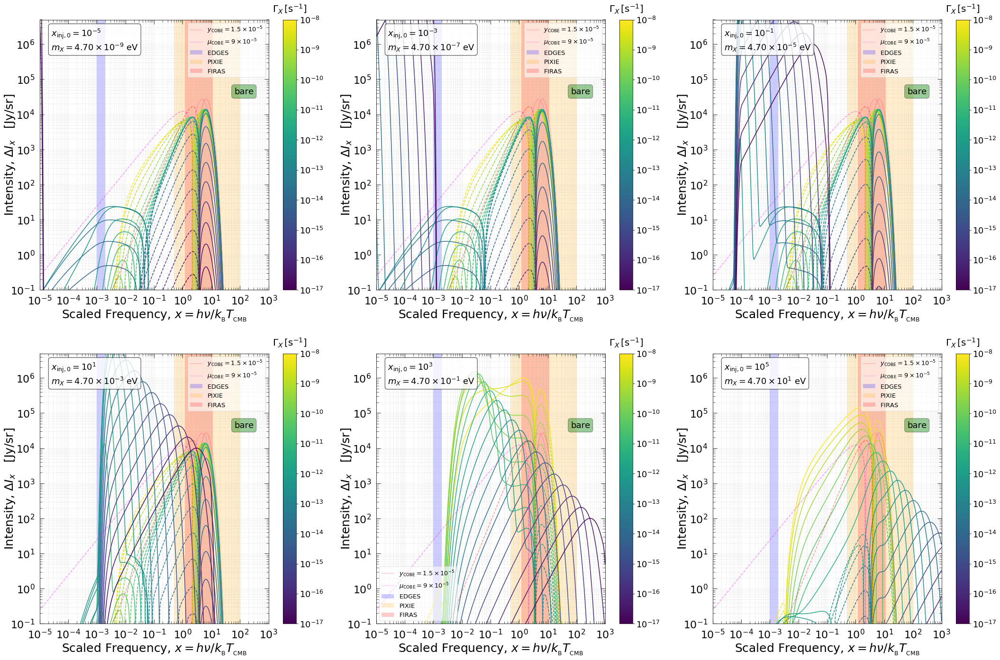

In [39]:
firas = sd.firas()
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)

xinj_asked_array = [1.e-5,1e-3,1e-1,1e1,1e3,1e5]

# x_min = 1.e-6
# x_max = 1.5e4
# ymin = 1.e-18
# ymax = 1.5e-3
x_min = 1.e-5
x_max = 1.e3
ymin = 1.e-1
ymax = 5e-6*1e6*1e6

ngamma = 20


fig, ax_array = plt.subplots(2,3,figsize=(30,20))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5
my_cmap =  cm.get_cmap('viridis')
#my_cmap = my_cmap(np.linspace(0.,0.5,ngamma))
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax) in zip(xinj_asked_array,ax_array.reshape(-1)):



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')


    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.1,0.5)
    
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)





#     ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
#     ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

#     plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
#     plt.setp(ax.get_xticklabels(), fontsize=label_size)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
#     majors = [0, 1, 5]
# #     majors = [0, 1, 5]
#    ax.xaxis.set_major_locator(ticker.FixedLocator(majors))
#     for label in ax.xaxis.get_ticklabels()[::2]:
#         label.set_visible(False) #(3)


#     ax.xaxis.set_ticks_position('both')
#     ax.yaxis.set_ticks_position('both')

#     ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     locmin = matplotlib.ticker.LogLocator(base=10.0, subs=np.arange(2, 10) ,
#                                           numticks=12)
#     ax.xaxis.set_minor_locator(locmin)
#     ax.yaxis.set_minor_locator(locmin)
#     ax.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
#     ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

    ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    #ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    color=iter(cm.viridis(np.linspace(1.,0.,ngamma)))

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    str_m_dec_in_ev =  str("%.3e"%m_dec_in_ev)
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'

    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib_bare)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    ax.text(0.05, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    
    Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    ax.plot(x_asked,Y,c='r',alpha = 0.2,label = label_y_firas)
    ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.2,label=label_mu_firas)
    ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)

        
    if xinj_asked==1e3:
        lloc = 3
    else:
        lloc =1
    legend1 = ax.legend(loc=lloc,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)

    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)

    case_type = 'bare'
    case_color ='green'
    ax.text(0.85, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
fig.tight_layout(pad=3.0)
str_x = str("%.3e"%xinj_ct_for_plot)
plt.savefig(path_to_figures + '/spectra_for_paper_xinj_bare_final_version.pdf')
plt.show()
plt.close(fig)





[[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8c8b2a05f8>


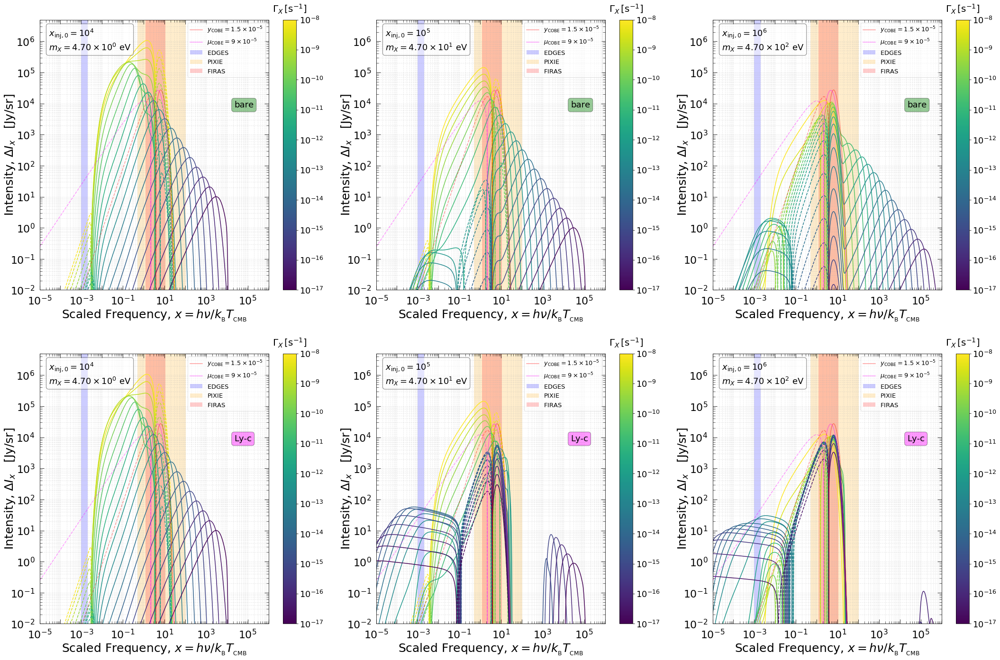

In [44]:
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)
xinj_to_mass = 4.698e-4 #in ev
xinj_asked_array = [1.e4,1e5,1e6,1.e4,1e5,1e6]

x_min = 1.e-5
x_max = 1.e6
ymin = 1.e-14*1e12
ymax = 5e-6*1e12

ngamma = 20


fig, ax_array = plt.subplots(2,3,figsize=(30,20))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5

my_cmap =  cm.get_cmap('viridis')
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax,iax) in zip(xinj_asked_array,ax_array.reshape(-1),np.arange(6)):
    if iax in (0,1,2):
        sd_lib = sd_lib_bare
        color=iter(cm.viridis(np.linspace(1,0,ngamma)))
        case_type = 'bare'
        case_color ='green'
    else:
        sd_lib = sd_lib_lyc
        color=iter(cm.viridis(np.linspace(1,0,ngamma)))
        case_type = 'Ly-c'
        case_color ='magenta'
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')

    
    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.1,0.5)


        
    ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'
    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()
    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    ax.text(0.04, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    
    ax.text(0.85, 0.7, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.4))

    
    Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    ax.plot(x_asked,Y,c='r',alpha = 0.4,label = label_y_firas)
    ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.4,label=label_mu_firas)
    ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)
    
    legend1 = ax.legend(loc=1,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(False) #(3)
    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')

fig.tight_layout(pad=3.0)
str_x = str("%.3e"%xinj_ct_for_plot)
plt.savefig(path_to_figures + '/spectra_for_paper_xinj_bare_vs_lyc_final_version.pdf')
plt.show()
plt.close(fig)

[[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8c8c879f98>


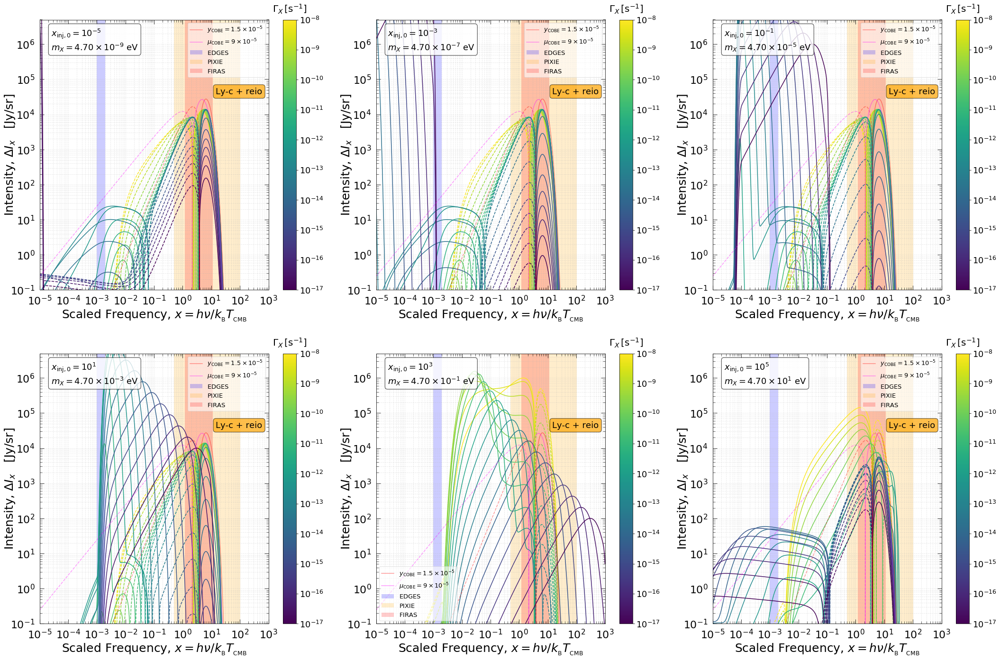

In [47]:
# Gamma_inj_min = 1e-17
# Gamma_inj_max = 1e-8
# N_Gamma_inj = 50
# Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)

xinj_asked_array = [1.e-5,1e-3,1e-1,1e1,1e3,1e5]

# x_min = 1.e-6
# x_max = 1.5e4
# ymin = 1.e-18
# ymax = 1.5e-3
x_min = 1.e-5
x_max = 1.e3
ymin = 1.e-1
ymax = 5e-6*1e6*1e6

ngamma = 20


fig, ax_array = plt.subplots(2,3,figsize=(30,20))
label_size = 22
title_size = 25
legend_size = 28
handle_length = 1.5

my_cmap =  cm.get_cmap('viridis')
sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0, vmax=1))


print(ax_array)
for (xinj_asked,ax) in zip(xinj_asked_array,ax_array.reshape(-1)):



    ax.set_xlim(x_min,x_max)
    ax.set_ylim(ymin,ymax)
    ax.set_xscale('log')
    ax.set_yscale('log')


    ax.set_xlabel(label_scaled_frequency,size=title_size)
    ax.set_ylabel(label_intensity,size=title_size)
    ax.yaxis.set_label_coords(-.1,0.5)
    
    cbar = fig.colorbar(sm,ax=ax)
    cbar.set_ticks(1./9.*np.arange(0,10))
    cbar.ax.set_yticklabels([r'$10^{-17}$',r'$10^{-16}$',r'$10^{-15}$',r'$10^{-14}$',r'$10^{-13}$',r'$10^{-12}$',r'$10^{-11}$',r'$10^{-10}$',r'$10^{-9}$',r'$10^{-8}$'],size=18)
    cbar.ax.set_title(r'$\Gamma_X\,[\mathrm{s}^{-1}]$',size=20,pad=15)





#     ax.tick_params(axis = 'x',which='both',length=5,direction='in', pad=10)
#     ax.tick_params(axis = 'y',which='both',length=5,direction='in', pad=10)

#     plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
#     plt.setp(ax.get_xticklabels(), fontsize=label_size)
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
#     majors = [0, 1, 5]
# #     majors = [0, 1, 5]
#    ax.xaxis.set_major_locator(ticker.FixedLocator(majors))
#     for label in ax.xaxis.get_ticklabels()[::2]:
#         label.set_visible(False) #(3)


#     ax.xaxis.set_ticks_position('both')
#     ax.yaxis.set_ticks_position('both')

#     ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
#     locmin = matplotlib.ticker.LogLocator(base=10.0, subs=np.arange(2, 10) ,
#                                           numticks=12)
#     ax.xaxis.set_minor_locator(locmin)
#     ax.yaxis.set_minor_locator(locmin)
#     ax.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
#     ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

    ax.axvspan(1.e-3, 2e-3, facecolor='blue', alpha=0.2,label=r'$\mathrm{EDGES}$')
    ax.axvspan(0.5, 105, facecolor='orange', alpha=0.2,label=r'$\mathrm{PIXIE}$')
    ax.axvspan(1.2, 11.2, facecolor='red', alpha=0.2,label=r'$\mathrm{FIRAS}$')
    #ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
    #ax.grid(  which="both", alpha=0.3, linestyle='--')


    
    color=iter(cm.viridis(np.linspace(1,0,ngamma)))

    x_asked = np.logspace(np.log10(x_min),np.log10(x_max),1000)
    
    
    m_dec_in_ev = xinj_to_mass*xinj_asked
    str_m_dec_in_ev =  str("%.3e"%m_dec_in_ev)
    text_mdec = r'$m_X=$'+scientific_notation(m_dec_in_ev)+r'$\,\,\mathrm{eV}$'

    
    xinj_ct_for_plot = xinj_asked
    


    for Gamma_asked in np.logspace(-17,-8,ngamma)[::-1]:

        S = pi.GetSpectra(Gamma_asked,xinj_asked,x_asked,sd_lib_lyc_reio)
        col = next(color)
#         ax.plot(S["x"],S["DI"]/S["finj"],c=col)
#         ax.plot(S["x"],-S["DI"]/S["finj"],c=col,ls='--')
        ax.plot(S["x"],S["DI"],c=col)
        ax.plot(S["x"],-S["DI"],c=col,ls='--')
        #ax.plot(S["x"],np.abs(S["DI"]),c=next(color))


    ax.loglog()

    text_gamma_str1 = r'$x_\mathrm{inj,0}= $'  + scientific_notation(xinj_asked)
    text_gamma_str = '\n'.join((text_gamma_str1,text_mdec))


    ax.text(0.05, 0.97, text_gamma_str, transform=ax.transAxes, fontsize=18, verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    
    Y = pi.GetYSpecDistAtTandX(firas.firas_y_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    ax.plot(x_asked,Y,c='r',alpha = 0.4,label = label_y_firas)
    ax.plot(x_asked,-Y,c='r',ls='--',alpha = 0.4)

    MU_chluba = pi.GetMuSpecDistAtTandX_chluba(firas.firas_mu_1996_95_cl,pi.firas_T0_bf,x_asked)*1e6
    ax.plot(x_asked,MU_chluba,c='magenta',alpha = 0.4,label=label_mu_firas)
    ax.plot(x_asked,-MU_chluba,c='magenta',ls='--',alpha = 0.4)
    
    
    if xinj_asked==1e3:
        lloc = 3
    else:
        lloc =1
    legend1 = ax.legend(loc=lloc,ncol=1,frameon=True,framealpha=0.6,fontsize = 13)
# my_cmap = cm.viridis
# sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=0., vmax=1.))

# # cbar = plt.colorbar(sm,ax=ax,ticks=[0.,0.5,1.])#,orientation='horizontal',anchor=(0.,0.),shrink=0.5)
# # cbar.ax.set_yticklabels(['0','1','2'])
# #cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)
# cbar= fig.colorbar(sm, ax=ax_array.flat,orientation='horizontal')
# cbar.ax.set_xticks([0.,0.5,1.])
# cbar.ax.set_xticklabels(['0','1','2'])
# cbar.set_label(r'$\Gamma_\mathrm{inj}$', rotation=0)

    ax.yaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.yaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.yaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=5)
    ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=5)
    ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)
    ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=9,labelsize=label_size,pad=10)

    # manipulate x-axis ticks and labels
    ax.xaxis.set_major_locator(LogLocator(numticks=15)) #(1)
    ax.xaxis.set_minor_locator(LogLocator(numticks=15,subs=np.arange(2,10))) #(2)
    for label in ax.xaxis.get_ticklabels()[::2]:
        label.set_visible(True) #(3)
        
    case_type = 'Ly-c + reio'
    case_color ='orange'
    ax.text(0.77, 0.75, case_type, transform=ax.transAxes, fontsize=18, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor=case_color, alpha=0.7))
        
    ax.grid( b=True, which="both", alpha=0.3, linestyle='--')
#     plt.tick_params(axis='both', which='major', labelsize=label_size,length=9,direction='in')
#     plt.tick_params(axis='both', which='minor', labelsize=label_size,length=5,direction='in')
fig.tight_layout(pad=3.0)
str_x = str("%.3e"%xinj_ct_for_plot)
plt.savefig(path_to_figures + '/spectra_for_paper_xinj_lyc_reio_final_version.pdf')
plt.show()
plt.close(fig)





# some standard mu and y to discuss hubble cooling

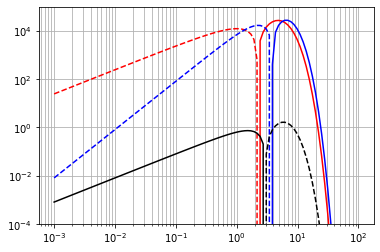

In [36]:
x_array = np.logspace(-3,2,100)
mu_array = sd.GetMuSpecDistAtTandX_chluba(9e-5,2.725,x_array)*1e6
y_array = sd.GetYSpecDistAtTandX(1.5e-5,2.725,x_array)*1e6
plt.plot(x_array,mu_array,c='r')
plt.plot(x_array,-mu_array,c='r',ls='--')
plt.plot(x_array,y_array,c='b')
plt.plot(x_array,-y_array,c='b',ls='--')
mu_cooling = sd.GetMuSpecDistAtTandX_chluba(-3e-9,2.725,x_array)*1e6
y_cooling = sd.GetYSpecDistAtTandX(-0.5e-9,2.725,x_array)*1e6
plt.plot(x_array,mu_cooling+y_cooling,c='k')
plt.plot(x_array,-mu_cooling-y_cooling,c='k',ls='--')
plt.loglog()
plt.ylim(1e-4,1e5)
plt.grid(which='both')


In [28]:
xinj_to_Einj*1e9

234900.0

In [30]:
'%.4e'%(1e5/xinj_to_Einj)

'4.2571e+08'

# new library at high frequency

In [2]:
sd_lib_extended_run_high_xinj = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_high_xinj_160920',sd_lib_extended_run_high_xinj)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_stim_070920',sd_lib_extended_run_stim)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [9]:
sd_lib_extended_run = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('extended_run_xe_history_120820',sd_lib_extended_run)
#extended_run_xe_history_Drho_rho_5e-6_no_collision_160820
pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_3e-5_zlate_1e3_without_collision_190820',sd_lib_extended_run)
#pi.load_ct_spectra_lib('extended_run_xe_history_Drho_rho_1e-8_160820',sd_lib_extended_run)
# sd_lib_xe_history_finj_fisher = pi.specdist_ct_spectra_lib()
# pi.load_ct_spectra_lib('xe_hi@story_200720_finj_fisher',sd_lib_xe_history_finj_fisher)
#sd_lib_lyc_reio = pi.specdist_ct_spectra_lib()
#pi.load_ct_spectra_lib('lyc_reio',sd_lib_lyc_reio)

In [14]:
def pi_compute_fdm_constraints(log10_tau_a,log10_Einj_in_ev,asd_lib,*args,**kwargs):
    
    asd_lib_high_xinj0 = kwargs.get('asd_lib_high_xinj0',None)
    
    Einj_in_ev = 10**log10_Einj_in_ev
    tau_a = 10**log10_tau_a
    #ma_in_ev = log10_ma_in_ev
    #tau_a = log10_tau_a
    xinj = Einj_in_ev/xinj_to_Einj
    #gagg = 3.57e7*(Gamma_values)**0.5*Xinj_values**(-3./2.)
    Gamma = 1./tau_a#((gagg/3.57e7)/xinj**(-3./2.))**2.
    lib_for_constraints = asd_lib
    if asd_lib_high_xinj0:
        if xinj>1e4 and Gamma<1e-14:
            lib_for_constraints = asd_lib_high_xinj0
            
    
    # for short lifetime, we compute the constraint
    # analytically using the mu-distortion
    if Gamma>1e-8:
        ct = sd.cosmotherm()
        ct.ct_T0 = 2.7255
        ct.ct_Yp = 0.245407
        ct.ct_N_eff = 3.046
        ct.ct_Omega_m = 0.312331
        ct.ct_Omega_b = 0.0491137
        ct.ct_h = 0.675422
        
        
        cosmo = sd.cosmo()
        X_dm = sd.dm_particle()
        pi.set_dm_params_to_CT_pi_params(X_dm,ct)
        pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
        
        X_dm.Gamma_inj = Gamma
        X_dm.x_0 = xinj
        fdm_constraint = np.abs(pi.high_redshift_f_dm_limit(7.4e-5,cosmo,ct,X_dm,N_int = 5))
    # for long lifetime, we compute the constraint
    # by extrapolating
    elif Gamma < lib_for_constraints.Gamma_inj_min:
        xi_a = [xinj]
        Gamma_values = [lib_for_constraints.Gamma_inj_min]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']*asd_lib.Gamma_inj_min/Gamma
    # for intermerdiate cases we compute the constraints using fisher matrix
    else:
        xi_a = [xinj]
        Gamma_values = [Gamma]
        D = sd.pi_run_fisher_constraints(Gamma_values,xi_a,lib_for_constraints,**kwargs)
        fdm_constraint = D['curves'][0]['fdm']
    return np.log10(fdm_constraint)

pi_compute_fdm_constraints = np.vectorize(pi_compute_fdm_constraints)






In [19]:
firas = sd.firas()
edges = sd.edges()

add_edges = 'yes'

#tau_values = np.linspace(13,20,50)
#Einj_values =np.linspace(0,5,50)

tau_values = np.linspace(5,30,200)
Einj_values =np.linspace(-10,5,200)

xlist = Einj_values
ylist = tau_values

X, Y = np.meshgrid(xlist, ylist)

a_dict = {}
a_dict['firas'] = firas
a_dict['edges'] = edges

if add_edges == 'yes':
    a_dict['add_edges'] = 'yes'
else:
    a_dict['add_edges'] = 'no'

#lib = sd_lib_lyc_reio
lib = sd_lib_extended_run
a_dict['asd_lib_high_xinj0'] = sd_lib_extended_run_high_xinj

#Z = vfunc_tau_a_contours(Y,X,lib,**a_dict)
Z =  pi_compute_fdm_constraints(Y,X,lib,**a_dict)

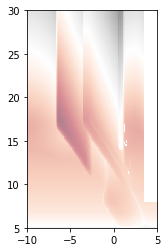

In [20]:
plt.imshow(Z, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
           cmap='RdGy', alpha=0.5)

In [21]:
# save the results

case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
     name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_190820'
#name_ext += '_test'
np.shape(Z)
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'

    
np.savetxt(path, Z, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'


np.savetxt(path, X, delimiter='\t', fmt='%.4e')

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'


np.savetxt(path, Y, delimiter='\t', fmt='%.4e')





In [23]:
# load the results
case = 'lyc+reio'
name_ext = ''
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
name_ext += '_extended_run_190820'
#name_ext += '_test'
path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Einj_in_ev' + name_ext + '.txt'
Xf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_Tau_X_in_s' + name_ext + '.txt'
Yf = np.loadtxt(path)

path = '/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/f_dm_constraints/log10_f_dm' + name_ext + '.txt'
Zf = np.loadtxt(path)

In [24]:
# load the non-thermal distorsion

NT = np.loadtxt('/Users/boris/Work/SPECTRAL-DISTORTIONS/specdist/specdist/data/E_gamma_nt.dat')
z_nt = NT[:,1]
E_nt = NT[:,0]

# f_nt = interp1d(z_nt,E_nt)


ct = sd.cosmotherm()
cosmo = sd.cosmo()
X_dm = sd.dm_particle()

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422
pi.set_dm_params_to_CT_pi_params(X_dm,ct)
pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)

G_nt = []
for zx in z_nt:
    G_nt.append(pi.find_Gamma_inj_for_injection_redshift_zX(zx,cosmo,ct))
G_nt = np.asarray(G_nt)

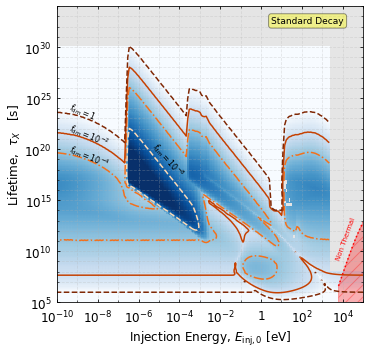

In [25]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
label_size = 12
title_size = 12
legend_size = 25
handle_length = 1.5


tau_values = Yf[:,0]
Einj_values = Xf[0]

# tau_values = np.linspace(5,30,500)
# Einj_values =np.linspace(-10,5,500)

# tau_values = 10**Yf[0]
# Einj_values = 10**Xf[0]
# xlist = Einj_values
# ylist = tau_values

levels = [-8,-4,-2,0]

colormap = plt.cm.Oranges #or any other colormap
colormap2 = plt.cm.Blues_r
colormap2 = colormap2
normalize = matplotlib.colors.Normalize(vmin=-10, vmax=0)

CS = ax.contour(Xf, Yf, Zf,levels,cmap = colormap,norm=normalize,linestyles=['--','-.','-','--'])


# CS.levels = [0.0001,0.01,1]


# # Label levels with specially formatted floats
# if plt.rcParams["text.usetex"]:
#     fmt = r'%r \%%'
# else:
#     fmt = r'$f_\mathrm{dm}=%r$'
    
# fmt = ticker.LogFormatterMathtext()

#ax.clabel(CS, CS.levels, inline=10, fontsize=8,fmt=fmt)
 

# masses_ev = np.logspace(-9,9,100)
# tau_dfsz = 1.1581e27*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_dfsz),c='k',lw=2,ls=':')
# tau_ksvz = 8.9078e23*masses_ev**-5
# ax.plot(np.log10(masses_ev*mass_to_Einj),np.log10(tau_ksvz),c='k',lw=2,ls=':')


ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)



ax.grid( b=True, which="both", alpha=0.3, linestyle='--')



ax.set_xlim(Einj_values[0],Einj_values[-1])
#ax.set_ylim(tau_values[0],tau_values[-1])
ax.set_ylim(tau_values[0],34)

ax.set_xlabel(label_injection_energy,size=title_size)
#ax.set_ylabel("coupling constant, "+r'$g_\mathrm{a\gamma\gamma}\quad[\mathrm{GeV}^{-1}]$',size=title_size)
ax.set_ylabel(label_Tau_x,size=title_size)

ax.yaxis.set_label_coords(-.11,0.5)
ax.xaxis.set_label_coords(0.5,-.09)


# im = ax.imshow(Zf, extent=[Einj_values[0], Einj_values[-1],tau_values[0],tau_values[-1]], origin='lower',
#            cmap=colormap2,norm=normalize, alpha=1.)


im = ax.imshow(Zf, extent=[-10,5,tau_values[0],
                           tau_values[-1]],
               origin='lower',
           cmap=colormap2,norm=normalize, alpha=1.,aspect=0.5)


ax.text(-9.5, 24.8, r'$f_\mathrm{dm}=1$' , rotation = -23,
          fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 22.8, r'$f_\mathrm{dm}=10^{-2}$' , rotation = -23,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(-9.5, 20.8, r'$f_\mathrm{dm}=10^{-4}$' , rotation = -23,
         fontsize=8, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))



ax.text(-5.5, 21, r'$f_\mathrm{dm}=10^{-8}$' , rotation = -49,
        fontsize=8, 
          verticalalignment='top',color='k',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))

ax.text(0.91, 0.29, r'Non Thermal' , rotation = 70,color='r',
        transform=ax.transAxes, fontsize=7, 
          verticalalignment='top',
          bbox=dict(boxstyle='round', facecolor='grey', alpha=0.))


ax.plot(np.log10(E_nt*1e3),np.log10(1./G_nt),c='red',ls=':')
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='r',alpha=0.3)
ax.fill_between(np.log10(E_nt*1e3),0,np.log10(1./G_nt),hatch='//',color='None',edgecolor='None')

ax.patch.set_color('grey') # or whatever color you like
ax.patch.set_alpha(.2)

ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(1))
ax.set_xticklabels([r'$10^{-10}$',r'$10^{-8}$',r'$10^{-6}$',r'$10^{-4}$',r'$10^{-2}$',r'$1$',r'$10^{2}$',r'$10^{4}$'])
ax.set_yticklabels([r'$10^{5}$',r'$10^{10}$',r'$10^{15}$',r'$10^{20}$',r'$10^{25}$',r'$10^{30}$'])


ax.text(0.5, 33., 'Standard Decay', fontsize=9, verticalalignment='top',
      bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.4))

fig.tight_layout()
#plt.legend()


name_ext = ''
case = 'lyc+reio'
if case == 'lyc+reio':
    name_ext += '_lyc_reio'
elif case == 'bare':
    name_ext += '_bare'
if add_edges == 'yes':
    name_ext += '_with_edges'
else:
    name_ext += '_no_edges'
name_ext += '_extended_run'
name_ext += '.pdf'

plt.savefig(path_to_figures + '/figures_for_paper_tau_a_final' + name_ext)

# try running some cases with the new starting redshift

In [22]:
xinj_values = [1e7]
N_x_inj = len(xinj_values)

x_min = 1.e-1
x_max = 5.e6
ymin = 1.e-3
ymax = 2e0

nxinj = N_x_inj 

args = {}
args['param_values_array'] = xinj_values
args['param_name'] = 'photon injection x_dec'

Drho_rho = 3e-5

ct = pi.cosmotherm()
# set relevant parameter values
ct.ct_Drho_rho_dec = Drho_rho


# ct.ct_h = 0.70
# ct.ct_Omega_b = 0.0457
# ct.ct_Omega_m = 0.30
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 5e6
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422
ct.ct_Gamma_dec = 1e-20
ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 1
ct.ct_pi_stim = 1
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1

ct.ct_include_collisions = 0

ct.pi_use_zstart_from_total_energy_fraction = 'yes'
#ct.ct_pi_redshift_evolution_mode=1
R = ct.run_cosmotherm_parallel(**args)

(1e-06, 1000000.0)

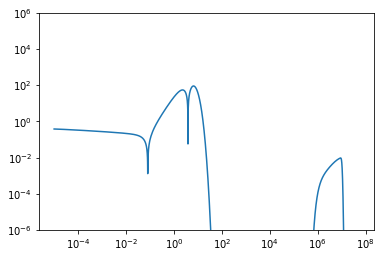

In [10]:
plt.plot(R[0]['x'],np.abs(R[0]['DI']))
plt.loglog()
plt.ylim(1.e-6,1e6)

(1e-06, 1000000.0)

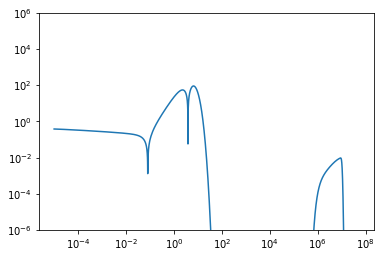

In [8]:
plt.plot(R[0]['x'],np.abs(R[0]['DI']))
plt.loglog()
plt.ylim(1.e-6,1e6)

# finding redshift of max injection given Gamma and xinj

In [63]:
# set cosmo to CT params:
ct = sd.cosmotherm()
ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422


cosmo = sd.cosmo()
X_dm = sd.dm_particle()
pi.set_dm_params_to_CT_pi_params(X_dm,ct)
pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)


In [3]:
gamma_inj = 1e-13
xinj = 1e0


In [88]:
#Gamma_inj_min = 1e-18
#Gamma_inj_max = 1e-8
#Gamma_values = np.logspace(np.log10(Gamma_inj_min),np.log10(Gamma_inj_max),N_Gamma_inj)
#Gamma_values = [1e-18,1e-17,5e-16,5e-14,1e-11,1e-8]
xinj_values = [1e3,1e1,1,1e-2,1e-4]
N_x_inj = len(xinj_values)

x_min = 1.e-1
x_max = 5.e6
ymin = 1.e-3
ymax = 2e0

nxinj = N_x_inj 

args = {}
args['param_values_array'] = xinj_values
args['param_name'] = 'photon injection x_dec'

ct = pi.cosmotherm()
ct = pi.cosmotherm()
ct.ct_emission_absorption_mode = 0
ct.ct_npts = 3000
# ct.ct_zend = 4e6
# ct.ct_zstart = 5e6
ct.ct_zend = 1e-2
ct.ct_zstart = 5e6
ct.ct_zlate = 1e3

ct.ct_T0 = 2.7255
ct.ct_Yp = 0.245407
ct.ct_N_eff = 3.046
ct.ct_Omega_m = 0.312331
ct.ct_Omega_b = 0.0491137
ct.ct_h = 0.675422

ct.ct_include_pi = 1
ct.ct_evolve_Xe = 1
ct.save_Xe = 'yes'
ct.ct_lyc = 1
ct.ct_pi_stim = 1
ct.ct_pi_energy_norm = 2
ct.ct_reionisation_model = 1
ct.ct_only_global_energetics = 1
ct.ct_Gamma_dec = 1e-17


#ct.ct_pi_redshift_evolution_mode=1
R = ct.run_cosmotherm_parallel(**args)

In [89]:
R

[{'photon injection x_dec': 1000.0,
  'z': array([4.95000000e+06, 4.90050000e+06, 4.85149500e+06, ...,
         2.02045515e-02, 2.00025060e-02, 1.00000000e-02]),
  '(NX/Nxini)': array([1.        , 1.        , 1.        , ..., 0.01408973, 0.01407711,
         0.01346167]),
  '(NX/Nxini)_stim': array([1.        , 1.        , 0.99999999, ..., 0.01407863, 0.01406602,
         0.01345106]),
  't_cosmic': array([9.73261730e+05, 9.93020582e+05, 1.01318055e+06, ...,
         4.26230886e+17, 4.26320514e+17, 4.30790901e+17]),
  't_stim': array([1.92716907e+10, 1.94663204e+10, 1.96629154e+10, ...,
         4.26309755e+17, 4.26399383e+17, 4.30869771e+17]),
  '[(dlnRho/dln1pz)/(dRho/Rho)_inj]': array([6.95656060e-18, 9.07012087e-18, 1.17540961e-17, ...,
         2.18473457e-01, 2.18342077e-01, 2.11870572e-01]),
  'finj': 2.835179257172153e-07},
 {'photon injection x_dec': 10.0,
  'z': array([4.95000000e+06, 4.90050000e+06, 4.85149500e+06, ...,
         2.02045515e-02, 2.00025060e-02, 1.00000000e-02

1000.0 15.205204742179806
10.0 75.85593588934317
1 3252.558517986744
0.01 557563.5278965657
0.0001 3530953.4772628406


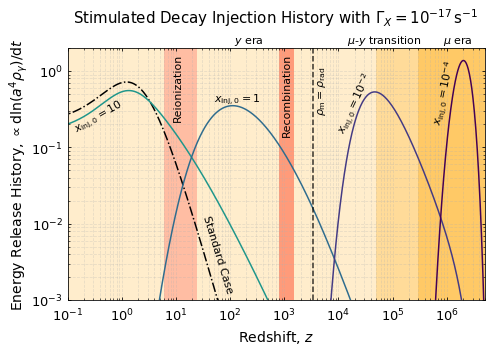

1e-17


In [106]:
#fig, ax_array = plt.subplots(2,3,figsize=(30,20))
fig, ax = plt.subplots(1,1,figsize=(7,5))
label_size = 13
title_size = 14
legend_size = 25
handle_length = 1.5


x_min = 1.e-1
x_max = 5.e6
x_min = 1.e-1
x_max = 5.e6
ymin = 1.e-3
ymax = 2e0

ax.set_xlim(x_min,x_max)
ax.set_ylim(ymin,ymax)
ax.set_xscale('log')
ax.set_yscale('log')


ax.set_xlabel("Redshift, "+ r'$z$',size=title_size)
ax.set_ylabel(r"Energy Release History, $\propto \mathrm{d}\ln (a^4 \rho_\gamma)/\mathrm{d}t$",size=title_size)
#ax.set_ylabel(r"Particle Decay History, $N_X(z)/N_X(z_\mathrm{ini})$",size=title_size)

ax.yaxis.set_label_coords(-.09,0.5)

ax.yaxis.set_tick_params(right='on',which='minor',direction='in',length=2)
ax.xaxis.set_tick_params(top='on',which='minor',direction='in',length=2)
ax.yaxis.set_tick_params(right='on',which='major',direction='in',length=3,labelsize=label_size,pad=5)
ax.xaxis.set_tick_params(top='on',which='major',direction='in',length=3,labelsize=label_size,pad=7)

plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=label_size)
plt.setp(ax.get_xticklabels(), fontsize=label_size)

ax.xaxis.set_ticks_position('both')
ax.yaxis.set_ticks_position('both')

ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=1000))
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=1000))
locmin = matplotlib.ticker.LogLocator(base=10.0, subs=np.arange(2, 10) ,
                                      numticks=12)
ax.xaxis.set_minor_locator(locmin)
ax.yaxis.set_minor_locator(locmin)
ax.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

ax.grid( b=True, which="both", alpha=0.3, linestyle='--')


ax.axvspan(800., 1500, facecolor='red', alpha=0.4)
ax.text(0.514, 0.98, 'Recombination', transform=ax.transAxes,color='k',rotation=90,fontsize=11,
        verticalalignment='top')

ax.axvspan(3.e5, x_max, facecolor='orange', alpha=0.6)
ax.text(0.9, 1.02, r'$\mu$ era', fontsize=11,
        transform=ax.transAxes,color='k',rotation=0)

ax.axvspan(5e4, 3e5, facecolor='orange', alpha=0.4)
ax.text(0.67, 1.02, r'$\mu$-$y$ transition', fontsize=11,transform=ax.transAxes,color='k',
        rotation=0)

ax.axvspan(x_min, 5e4, facecolor='orange', alpha=0.2)
ax.text(0.4, 1.02, r'$y$ era', fontsize=11, transform=ax.transAxes,color='k',rotation=0)



ax.axvspan(6., 25, facecolor='red', alpha=0.2)
ax.text(0.253, 0.98, 'Reionization', transform=ax.transAxes,color='k',rotation=90,fontsize=11,verticalalignment='top')



color=iter(cm.viridis(np.linspace(0.7,0.,nxinj)))

i = 0
for r,Gamma_asked in zip(R,xinj_values):
    xinj0 = r['photon injection x_dec']
    gamma_inj = ct.ct_Gamma_dec
    #zX = sd.injection_redshift_zX_stim(gamma_inj,xinj0,cosmo,ct)
    #print(zX)
    #print(Gamma_asked)

    col = next(color)
    slabel = r"$x_\mathrm{inj,0} = $"+scientific_notation(Gamma_asked)
    if i==0:
        ax.plot(r["z"],r["[(dlnRho/dln1pz)/(dRho/Rho)_inj]"],c='k',ls='-.',alpha=1.,label=slabel)

    else:
        ax.plot(r["z"],r["[(dlnRho/dln1pz)/(dRho/Rho)_inj]"],c=col,ls='-',alpha=1.,label=slabel)
    
    Int_rho = []
    for zp in r["z"]:
        Int_rho.append(np.trapz(-r["[(dlnRho/dln1pz)/(dRho/Rho)_inj]"][r["z"]>zp],np.log(1.+r["z"][r["z"]>zp])))
    Int_rho = np.asarray(Int_rho)
    f = interp1d(np.log(1.+r["z"]),Int_rho) 
    def f10(ln1pz):
        return f(ln1pz)-0.01
    zinj10 = np.exp(optimize.brentq(f10, np.log(1.+max(r["z"])), np.log(1.+min(r["z"]))))-1.
    print(xinj0,zinj10)
    #ax.plot(r["z"],r["(NX/Nxini)_stim"],c=col,ls='--',alpha=1.)
    
    #ct.ct_Gamma_dec = Gamma_asked
    #cosmo = pi.cosmo()
    #pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
    #print(ct.ct_Gamma_dec)
    
    
#     z_array = np.logspace(np.log10(cosmo.z_start),np.log10(cosmo.z_end),200)
#     Drho_array=pi.Drho_rho_inj_at_z_normalized(z_array,cosmo,ct)

    #ax.plot(z_array[i],np.abs(Drho_array[i]),c=col,ls='-',alpha=1.)      
    #try:
    #    zX = pi.injection_redshift_zX(Gamma_asked,cosmo,ct)
        #ax.axvline(zX)
        #print(zX)
    #except:
    #    zX = 0.
    i+=1
cosmo = pi.cosmo()
pi.set_cosmo_to_CT_cosmo_params(cosmo,ct)
ax.axvline(cosmo.z_eq(),c='k',ls='--',alpha=0.8)
ax.text(0.595, 0.75, r'$\rho_\mathrm{m}=\rho_\mathrm{rad}$', fontsize=11,transform=ax.transAxes,color='k',rotation=90)




ax.text(0.32, 0.03, r'Standard Case', fontsize=11,transform=ax.transAxes,color='k',
        rotation=-73)
ax.text(0.01, 0.67, r'$x_\mathrm{inj,0} = 10$', fontsize=11,transform=ax.transAxes,color='k',
        rotation=30)


ax.text(0.35, 0.79,  r'$x_\mathrm{inj,0} = 1$', fontsize=11,transform=ax.transAxes,color='k',
        rotation=0)

ax.text(0.64, 0.671,  r'$x_\mathrm{inj,0} = 10^{-2}$', fontsize=11,transform=ax.transAxes,color='k',
        rotation=65)


ax.text(0.87, 0.71,  r'$x_\mathrm{inj,0} = 10^{-4}$', fontsize=11,transform=ax.transAxes,color='k',
        rotation=78)



#ax.legend()
plt.title(r'Stimulated Decay Injection History with $\Gamma_X=10^{-17}\,\mathrm{s}^{-1}$',pad=25,size=15)

ax.loglog()

fig.tight_layout()
plt.savefig(path_to_figures + '/figures_for_paper_drho_rho_energy_mode_G_1e-17.pdf')
plt.show()
plt.close(fig)
print(ct.ct_Gamma_dec)

In [49]:

max(ct.ct_zlate,1e2)

1000.0

In [40]:
Int_rho = []
for zp in r["z"]:
    Int_rho.append(np.trapz(-r["[(dlnRho/dln1pz)/(dRho/Rho)_inj]"][r["z"]<zp],np.log(1.+r["z"][r["z"]<zp])))
Int_rho = np.asarray(Int_rho)
f = interp1d(np.log(1.+r["z"]),Int_rho) 

In [41]:
Int_rho

array([1.00000054, 1.00000054, 1.00000054, ..., 0.00211983, 0.        ,
       0.        ])